In [4]:
# !pip install pandarallel
# !pip install pywer
# !pip install pyjarowinkler
# !pip install pywer
# !pip install pyjarowinkler



In [5]:
import pandas as pd
# from pandarallel import pandarallel

# Initialization
# pandarallel.initialize()
from tqdm import tqdm
tqdm.pandas()
import os
import json
import pywer
from pyjarowinkler import distance as jwdistance
from tqdm import tqdm

class Const:
    OCR = 'ocr'
    GROUND = 'groundtruth'
    REGION = 'region'
    LINE = 'line'
    SENTENCE = 'sentence'
    FILE = 'filename'
    DATASET = 'dataset_name'
    PREDICTION = 'prediction'
    PROMPT = 'prompt'
    LANGUAGE = 'language'
    NONE = None


### Lookup datasets

In [6]:
datasets = []

for type_document in ['ocr', 'htr', 'asr']:
    for root, dirs, files in os.walk(f'../data/datasets/{type_document}/converted'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                if 'sample' not in input_file:
                    with open(input_file) as f:
                        lines = f.read().splitlines()
                    df_inter = pd.DataFrame(lines)
                    df_inter.columns = ['json_element']
                    df_inter['json_element'].apply(json.loads)
                    df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    print(input_file, dataset_name)
                    df['dataset_name'] = [dataset_name] * len(df)
                    if 'ajmc' in dataset_name:
                        df['language'] = ['el'] * len(df)
                    if 'overproof' in dataset_name:
                        df['language'] = ['en'] * len(df)
                    if 'impresso' in dataset_name:
                        df['language'] = ['de'] * len(df)

                    datasets.append(df)
            

../data/datasets/ocr/converted/icdar-2019/icdar-2019.jsonl icdar-2019
../data/datasets/ocr/converted/ajmc-primary/ajmc_primary_text.jsonl ajmc-primary
../data/datasets/ocr/converted/overproof/overproof.jsonl overproof
../data/datasets/ocr/converted/ajmc-mixed/ajmc_mixed.jsonl ajmc-mixed
../data/datasets/ocr/converted/impresso/impresso-nzz.jsonl impresso
../data/datasets/ocr/converted/icdar-2017/icdar-2017.jsonl icdar-2017
../data/datasets/htr/converted/htrec/htrec.jsonl htrec
../data/datasets/asr/converted/ina/ina.jsonl ina


In [7]:
print('Number of unique lines/sentences/regions.\n')
for dataset in datasets:
    print('Dataset:', dataset['dataset_name'].unique()[0], len(dataset), 'with duplicates')
    print('No. lines:', dataset['ocr.line']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. sentences:', dataset['ocr.sentence']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. regions:', dataset['ocr.region']. nunique(), '/', len(dataset['ocr.region']))
    print('-'*80)

Number of unique lines/sentences/regions.

Dataset: icdar-2019 404 with duplicates
No. lines: 0 / 404 No. sentences: 404 / 404 No. regions: 41 / 404
--------------------------------------------------------------------------------
Dataset: ajmc-primary 57 with duplicates
No. lines: 40 / 57 No. sentences: 27 / 57 No. regions: 9 / 57
--------------------------------------------------------------------------------
Dataset: overproof 2669 with duplicates
No. lines: 2278 / 2669 No. sentences: 399 / 2669 No. regions: 41 / 2669
--------------------------------------------------------------------------------
Dataset: ajmc-mixed 1291 with duplicates
No. lines: 535 / 1291 No. sentences: 379 / 1291 No. regions: 33 / 1291
--------------------------------------------------------------------------------
Dataset: impresso 1563 with duplicates
No. lines: 1256 / 1563 No. sentences: 577 / 1563 No. regions: 203 / 1563
--------------------------------------------------------------------------------
Dataset

## Step 1: Loading of Results


In [8]:
def read_line_by_line(filename):
    pass

def json_load(text):
    
    try:
        loaded_line = json.loads(text)
    except Exception as ex:
        print(ex)
        print(text[:30], '...')
        loaded_line = 'No text'
    return loaded_line

In [9]:
def get_icdar_2017_lang(filename):
    lang = filename.split('/')[-2].split('_')[0]
    if lang =='eng':
        lang = 'en'
    return lang

In [10]:
import gc; gc.collect()

0

In [11]:
from tqdm import tqdm
import os

results, results_backup = [], []

# First traversal to get count of .jsonl files
jsonl_count = 0
for root, dirs, files in os.walk('../data/output'):
    for file in files:
        if file.endswith(".jsonl"):
            jsonl_count += 1

# Second traversal to do the processing with tqdm progress bar
with tqdm(total=jsonl_count) as pbar:
    for root, dirs, files in os.walk('../data/output'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                is_few = False
                if 'few' in input_file:
                    prompt = root.split('/')[-2]
                    is_few = True
                else:
                    prompt = root.split('/')[-2]
                    
                if 'sample' not in input_file:
                    try:
                        with open(input_file) as f:
                            text = f.read()
                    
                        with open(input_file) as f:
                            lines = f.readlines()
                    except Exception as ex:
                        # sometimes, the results were in progress, so the jsonfile was not correct
                        print('We could not load {} {}'.format(input_file, ex))
                        continue
                    # Check correct lines
                    text = text.replace('\n', '')
                    text_list = text.split('}}{"')
                    json_objects = []

                    for i, t in enumerate(text_list):
                        if i != 0:
                            t = '{"' + t
                        if i != len(text_list) - 1:
                            t = t + '}'
                        if not t.endswith('}}'):
                            json_objects.append(t + '}\n')
                        else:
                            json_objects.append(t + '\n')
                        
                    df_inter = pd.DataFrame(json_objects)
                    df_inter.columns = ['json_element']

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    model_dataset_name = file[8:-6]
                    model_name = model_dataset_name.replace(root.split('/')[-1] + '-', '').strip()
                    try:
                        df_inter['json_element'].apply(lambda x: json_load(x))
                        df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                        df['model'] = [model_name] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        df['prompt'] = [prompt] * len(df)
                        try:
                            with open(f'../data/prompts/{prompt}.txt', 'r') as f:
                                prompt_text = f.read()
                            prompt_text = prompt
                        except:
                            prompt_text = 'prompt_complex_per_lang'
                            
                        df['prompt_text'] = [prompt_text] * len(df)
                        
                        if is_few:
                            df['type'] = ['few-shot'] * len(df)
                        else:
                            df['type'] = ['zero-shot'] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        
                        # for ajmc, it could be separated for -primary and -el only
                        if 'ajmc' in dataset_name:
                            df['language'] = ['el'] * len(df)
                        if 'ina' in dataset_name:
                            df['language'] = ['fr'] * len(df)
                        if 'overproof' in dataset_name:
                            df['language'] = ['en'] * len(df)
                        if 'impresso' in dataset_name:
                            df['language'] = ['de'] * len(df)
                        if 'htrec' in dataset_name:
                            df['language'] = ['el'] * len(df)

                        if dataset_name == 'icdar-2017':
                            df['language'] = df['filename'].apply(get_icdar_2017_lang)
                        
                        df['file'] = file
                        
                        df['name_of_file_idx'] = df.index.to_series().apply(lambda i: f"{file}_{i}")
                    
                        results.append(df)
                        results_backup.append(df)
                    except Exception as ex:
                        print('We could not load {} {}'.format(input_file, ex))
                    pbar.update()


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1115/1115 [07:30<00:00,  2.48it/s]


Check one result:

In [12]:
results[0].iloc[1]


language                                                               fr
filename                ../../data/datasets/ocr/original/icdar-2019/IC...
dataset_name                                                   icdar-2019
ocr.line                                                             None
ocr.sentence            Savoir faisons à touz, presens et avenir, à no...
ocr.region              Charles, par la grace de Dieu, etc. Savoir fai...
groundtruth.line                                                     None
groundtruth.sentence    Savoir faisons à touz, presens et avenir, à no...
groundtruth.region      Charles, par la grace de Dieu, etc. Savoir fai...
prediction.prompt       Veuillez nous aider à réviser et à corriger le...
prediction.sentence     /s>Veuillez nous aider à réviser et à corriger...
prediction.region       /s>Veuillez nous aider à réviser et à corriger...
model                                                   facebook-opt-6.7b
prompt                                

In [13]:
results[0].columns


Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'name_of_file_idx'],
      dtype='object')

In [14]:
for idx, result in tqdm(enumerate(results), total=len(results)):
    for _, item in result.iterrows():
        dataset_name = results[idx]['dataset_name'].unique()[0]
        if 'icdar' in dataset_name:
            text_types = ['sentence', 'region']
        else:
            text_types = ['line', 'sentence', 'region']

        for segment_type in text_types:
            if '{{TEXTE}}' in str(item[f'prediction.{segment_type}']):
                print(item['model'], item['dataset_name'], item['prompt'], item['type'])


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1115/1115 [05:48<00:00,  3.20it/s]


## Step 2:  Post-process the Results

In [15]:
import Levenshtein
from Levenshtein import distance
# from mbleven import compare
# import distance as faster_distance
# import mbleven

def compute_normalized_levenshtein_similarity(ground_truth_text, ocr_text):
    length = max(len(ocr_text), len(ground_truth_text))
    # Check if both strings are empty
    if length == 0:
        return 1.0
    levenshtein_distance = distance(ocr_text, ground_truth_text)
    similarity = (length - levenshtein_distance) / length
    return similarity

# def compute_jaccard(ocr_text, ground_truth_text):
#     try: 
#         return jwdistance.get_jaro_distance(ocr_text, ground_truth_text)
#     except:
#         return 0.0

def get_improvement(original_similarity, corrected_similarity):
    
    if original_similarity == 0:
        return min(max(corrected_similarity, -1), 1)
    elif original_similarity != corrected_similarity:
        return min(max((corrected_similarity - original_similarity) / original_similarity, -1), 1)
    elif original_similarity == corrected_similarity:
        return 0
    else:
        return 0 if corrected_similarity < 1 else 1


# lev(ocr, gs) − lev(c, gs)/len(gs)
# def get_improvement(original_similarity, corrected_similarity, pred_text, ocr_text, ground_truth_text):
#     if len(ground_truth_text) ==0:
#         print('----', ocr_text[:20].strip(), '----', pred_text[:20].strip())
#         return 0
#     score = (original_similarity - corrected_similarity)/len(ground_truth_text)
#     #print(ground_truth_text[:20].strip(), '----', ocr_text[:20].strip(), '----', pred_text[:20].strip(), len(ground_truth_text), len(pred_text), '--', score)
#     return score
    


#### Small checks:

In [16]:
gt_text = "149 Obrázek z maloměstského kukátka. Podává L. Gro 149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
ocr_text = "149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
pred_text = """Correct the text: "149 Obrázek z maloměstského kukátka. Podává L. Grwsmannová-Brodská. Místo děje: salon paní stavitelky; doba: čas věnovaný kávové „visitě"; jednající osoby: dámy přednější honorace městské, z nichž •většina je mladá a některé skutečně hezké. Na stole prostřeném krásným ubrusem damaškovým stojí talíře s koláčky, věnečky a preclíčky, kol toho pěkně se vyjímají křišťálové sklenky s vodou, stříbrné lžičky a šálky z jemného porcelánu, jejichž vonný obsah na přítomné paničky zdá se velmi blaze působiti. Ze živějšího hovoru vyznívá právě hlas paní notářky, která ve spravedlivém rozhorlení mluví: „Ano, mé dámy, již jest to takové! Samy ráčily jste býti svědky, jak svorně i jednohlasně byl přijat návrh paní sládkové, abychom si pořídily kroje národní a tak přispěly ku zvýšení lesku slavnosti, již pořádá náš statečný studentský spolek „Hvězda", a když již nás páni akademikové poctili důvěrou, že v naše ruce složili starost o buffet a jiné ještě funkce, tož měly bychom snad též jiti za příkladem slečen berních a vzdáti se činnosti jen proto, že se zdá paní berní národní kroj pro tři dcery býti nějakou zby tečnou výlohou?" Paničky projevovaly svoji nevoli, každá jiným spůsobem. Mladá paní adjunktová v duchu si umiňovala, že ve svém přátel ství k berňovům trochu ochladne; to tak! aby ten jejich pošetilý nápad, úóinkovati při slavnosti v obyčejném oděvu, přece zvítězil a dámám se bylo odříci těch půvabných krojů venkovských, co by si jen ona, paní adjunktová, počala s tou haldou brokátu, atlasu, krajek, stuh a aksamitu, za což vydala nejednu desítku, utěšujíc se tím, jak jí to bude slušeti! Hm, a škodu z toho také míti nebude, muž se bude musit po několik měsíců uskrovnit, služka se má beztoho též až příliš dobře, uhradí se to na domácnosti a bude! Nyní ujala se slova paní doktorka: „Aj, od berních to není nic divného, považte jen: tolik dětí! Vždyť my všecky víme, že kdyby sobě slečny toillety samy ne řídily, mnohého by nemohly míti; ony pak mají zásadu: nemá-li být něco pěkné, tož raději nic!" „Pravda, ale slečny Elišky, té nejmladší, jest mně líto; těšila se velice na selský kroj." „Ba ano, byla by v něm vypadala roztomile." „Nyní má po radosti." „Inu, proč má tak nepřející matinku." „To není to, má drahá, jest v tom však jiný háček." „Ah, ano; vždyť víme, že sotva tak tak vyjdou." „Ale na knihy, které jsi tvá, jinak našel byste jen krytí těch mladých mozí, jinak je vydáte." „A tak bude, ostatně jdu až na knihy; ale slyšet jsem od někoho, že o krojech něco dělat, a že to bylo bude dělat národní, a když jsi tento národní učil jak, pak by měl nalézt tuto kartu, ta by se jistě mohla vyměnit se všemi. Můžete-li to od nás odkázat?" Všem ozdravila její hlas, když řekla: „Já, já! a já ho učím. S těmi páne akademiky jsem již mohla vyprávět o světě, v němž vznítí v některé nocy a jednoho dne vyrostá vám hrozný kouzelný strom zůstane, o němž je psáno: ‚Už jen žádat!" 50 V tuto chvíli koupili mohou-li všichni pánové i paní, že když jsi to čerpala, dá se jen kupit. Přižili to, a já jim vám koupi ukáži.
„A já už jste tím vyděštila. Pánové, děkuji vám za chytré vědomí, se kterým vám projeví, že se už točí dívčí zrcadlo." – 151"""
                
get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))


# -0.7713953488372093

-0.7713953488372093

In [17]:
compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.9245323586325521

In [18]:
gt_text = "302."
ocr_text = "302."
pred_text = "302."

get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))



0

In [19]:
gt_text = 'testing'
ocr_text = 'reresting'
pred_text = 'testing'

compute_normalized_levenshtein_similarity(gt_text, ocr_text), distance(ocr_text, gt_text)

(0.6666666666666666, 3)

In [21]:
gt_text = 'testing'
ocr_text = 'sfsdfresting'
pred_text = 'testing'

compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.5

In [22]:
s1 = "testing"
s2 = "resting"

# Calculate the Levenshtein distance
lev_distance = Levenshtein.distance(s1, s2)
print(f"Levenshtein distance: {lev_distance}")

# Calculate the Levenshtein similarity
similarity = (max(len(s1), len(s2)) - lev_distance) / max(len(s1), len(s2))
print(f"Levenshtein similarity: {similarity:.2f}")


Levenshtein distance: 1
Levenshtein similarity: 0.86


### Post-process Methods

Read the prompts so they can be removed from the models' answers.

In [23]:
import glob

prompts = []

file_list = glob.glob('../data/prompts/**/*.txt', recursive=True)

prompts = [open(f).read() for f in file_list]

prompts = [text[:text.index('{{TEXT}}')].strip() for text in prompts]

In [24]:
prompts[0]

'Please assist with reviewing and correcting errors in texts produced by automatic transcription (OCR) of historical documents. Your task is to carefully examine the following text and correct any mistakes introduced by the OCR software. The text to correct appears after the segment "TEXT TO CORRECT:". Please place the corrected version of the text after the "CORRECTED TEXT:" segment. Do not write anything else than the corrected text.\n\nTEXT TO CORRECT:'

Other texts to remove, so we get the actual answer:

In [25]:
texts_to_remove = ["ΔΙΟΡΘΩΜΈΝΟ ΚΕΊΜΕΝΟ:", "CORRECTED TEXT:", "КОРИГИРАН ТЕКСТ:", "OPRAVENÝ TEXT:", 
                   "KORRIGIERTER TEXT:",
                  "TEXTO CORREGIDO:", "TEXTE CORRIGÉ:", "GECORRIGEERDE TEKST:", "POPRAWIONY TEKST:",
                  "POPRAVLJENO BESEDILO:", 'The corrected text:', 'The corrected text is:', 
                  'Corrected text:', 'Corrected text is:', "The correct spelling and grammar are:",
                  "TEXTE CORRIGÉ", "The correct text is:"]

In [26]:
def get_response(pred_text, ocr_text):
    if pred_text is not None:
        if type(pred_text) == str:
            if len(pred_text.strip()) > 0:
                if pred_text.startswith('"'):
                    pred_text = pred_text[1:]
                if pred_text.endswith('"'):
                    pred_text = pred_text[:-1]

            pred_text = pred_text.strip()
            
            processings = ''
            
            for prompt in prompts:
                prompt = prompt.strip()
                if prompt in pred_text:
                    index_of_last_occurrence = pred_text.lower().rfind(prompt.lower())
                    pred_text = pred_text[index_of_last_occurrence+len(prompt):].strip()
                    processings += 'PROMPT-REMOVED' + '|'

            for text in texts_to_remove:
                text = text.strip()
                if text in pred_text:
                    index_of_last_occurrence = pred_text.lower().rfind(text.lower())
                    pred_text = pred_text[index_of_last_occurrence+len(text):].strip()
                    processings += f'[{text}]-REMOVED' + '|'
            
            original_len = len(pred_text)
            # Enforce pred_text length limits relative to ocr_text
            max_length = int(len(ocr_text) * 1.5)
            if original_len > max_length:
                pred_text = pred_text[:max_length]
                processings += 'PRED-TEXT-TRUNCATED' + '|'
                    
            if 'There is no text provided to correct'.lower() in pred_text.lower():
                return ocr_text, '[There is no text provided to correct]-ANSWER'
            if 'No correction needed'.lower() in pred_text.lower():
                return ocr_text, '[No correction needed]-ANSWER'
            
            # this last case will never happen - the data was re-run
            if '{{TEXTE}}'.lower() in pred_text.lower():
                return ocr_text, '{{TEXTE}}'
    
    if len(processings.strip()) < 2:
        processings = 'NONE'
        
    return pd.Series([str(pred_text).strip(), processings.strip()])  

def postprocess_segment_type(segment_type):
    def postprocess(row):
        pred_text = str(row[f'prediction.{segment_type}'])
        ground_text = str(row[f'groundtruth.{segment_type}'])
        ocr_text = str(row[f'ocr.{segment_type}'])
        prompt_text = str(row['prompt_text'])
        
        pred_text = get_response(pred_text, ocr_text)
        
        return pred_text
    return postprocess

In [27]:
MODEL_MAP = {'gpt-4':'GPT-4', 
             'gpt-3.5-turbo':'GPT-3.5', 
             'facebook-opt-350m':'OPT-350M',
             'bigscience-bloom-560m':'BLOOM-560M', 
             'decapoda-research-llama-7b-hf':'LLAMA-7B',
             'davinci':'GPT-3', 'gpt2':'GPT-2', 
             'tloen-alpaca-lora-7b':'Alpaca', 
             '3few-shot-gpt-4': 'GPT-4', 
             '3few-shot-gpt-3.5-turbo': 'GPT-3.5', 
             '3few-shot-davinci': 'GPT-3',
             '3few-shot-gpt2': 'GPT-2', 
             '3few-shot-facebook-opt-350m': 'OPT-350M', 
             'ajmc_primary_text-gpt-4': 'GPT-4', 
             'ajmc_primary_text-bigscience-bloom-560m': 'BLOOM-560M', 
             'ajmc_primary_text-decapoda-research-llama-7b-hf': 'LLAMA-7B', 
             'ajmc_primary_text-davinci': 'GPT-3', 
             'ajmc_primary_text-facebook-opt-350m': "OPT-350M",
             'ajmc_primary_text-gpt2': 'GPT-2',
             'ajmc_primary_text-gpt-3.5-turbo': 'GPT-3.5', 
             'ajmc_mixed-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             'ajmc_mixed-bigscience-bloom-560m': 'BLOOM-560M',
             'ajmc_mixed-gpt2': 'GPT-2',
             'ajmc_mixed-facebook-opt-350m': 'OPT-350M',
             'ajmc_mixed-gpt-4': 'GPT-4',
             'ajmc_mixed-davinci': 'GPT-3',
             'ajmc_mixed-gpt-3.5-turbo': 'GPT-3.5',
             '3few-shot-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-impresso-nzz-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-facebook-opt-350m': 'OPT-350M',
             '3few-shot-..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             '..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             'facebook-opt-6.7b': 'OPT-6.7B',
             'bigscience-bloom-3b': 'BLOOM-3B',
             'bigscience-bloom-7b1': 'BLOOM-7.1B',
             '3few-shot-bigscience-bloom-7b1': 'BLOOM-7.1B',
             'ina-facebook-opt-6.7b': 'OPT-6.7B',
             'decapoda-research-llama-13b-hf': 'LLAMA-13B',
             'bigscience-bloomz-3b': 'BLOOMZ-3B',
             'bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             'bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloom-3b': 'BLOOM-3B',
             '3few-shot-facebook-opt-6.7b': 'OPT-6.7B',
             '3few-shot-bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             '3few-shot-bigscience-bloomz-3b': 'BLOOMZ-3B',
             'meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             '3few-shot-meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             'decapoda-research-llama-65b-hf': 'LLAMA-65B',
             'gpt-3.5-turbo-OLD': 'GPT-3-OLD'
            }

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Custom binning function
def bin_improvement(x):
    if x < 0:
        return "Negative Improvement"
    elif x == 0:
        return "No Improvement"
    elif x > 0:
        return "Positive Improvement"



In [28]:
import os

path = '../data/processed_data'
os.makedirs(path, exist_ok=True)


Not removing anymore the columns with < 1 token, but adding new columns for number of tokens and number of characters + mapping of the models' names to more understandable names.

In [29]:
def count_tokens(text):
    return len(text.split(' '))

for idx, result in tqdm(enumerate(results), total=len(results)):
    print('idx', idx)
    try:
        results[idx] = results[idx].fillna('No text')
    except:
        print(idx)
        pass
    
    try:
        results[idx]['model'] = results[idx]['model'].apply(lambda x: MODEL_MAP[x])
    except:
        print("Models already mapped.")
        
    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    print('Dataset:', dataset_name, 'Model:', model_name, 'Prompt:', prompt, 'Prompt text:', prompt_text)
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
    for segment_type in text_types:

        postprocess = postprocess_segment_type(segment_type)
        
        # Keeping the original un-processed column
        try:
            results[idx][[f'prediction.{segment_type}.postprocessed','post-processings']] = results[idx].apply(postprocess, axis=1)
        except Exception as ex:
            print(f'-------Problem encountered at {idx}.', ex)
            
        results[idx]['length_prediction_tokens'] = results[idx][f'prediction.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length_prediction_tokens'] > 0]
    
        results[idx]['length_ocr_tokens'] = results[idx][f'ocr.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length_ocr_tokens'] > 0]
        
        results[idx]['length_groundtruth_tokens'] = results[idx][f'groundtruth.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length_groundtruth_tokens'] > 0]
        
        results[idx]['length_groundtruth_chars'] = results[idx][f'groundtruth.{segment_type}'].apply(lambda x: len(str(x)))
#         results[idx] = results[idx][results[idx]['length_groundtruth_chars'] > 0]

        results[idx]['length_prediction_chars'] = results[idx][f'prediction.{segment_type}'].apply(lambda x: len(str(x)))

        results[idx]['length_ocr_chars'] = results[idx][f'ocr.{segment_type}'].apply(lambda x: len(str(x)))

        
    print(f'Saving to ../data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_csv(f"../data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.parquet") 
    
    

  0%|                                                                                                                                                                                                                                                          | 0/1115 [00:00<?, ?it/s]

idx 0
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  0%|▏                                                                                                                                                                                                                                                 | 1/1115 [00:00<11:09,  1.66it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 1
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  0%|▍                                                                                                                                                                                                                                                 | 2/1115 [00:00<08:46,  2.11it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_GPT-4.csv
idx 2
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  0%|▋                                                                                                                                                                                                                                                 | 3/1115 [00:01<08:01,  2.31it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 3
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  0%|▊                                                                                                                                                                                                                                                 | 4/1115 [00:01<07:49,  2.37it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_GPT-3.csv
idx 4
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  0%|█                                                                                                                                                                                                                                                 | 5/1115 [00:02<08:11,  2.26it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 5
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|█▎                                                                                                                                                                                                                                                | 6/1115 [00:02<07:43,  2.40it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 6
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|█▌                                                                                                                                                                                                                                                | 7/1115 [00:03<07:53,  2.34it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 7
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|█▋                                                                                                                                                                                                                                                | 8/1115 [00:03<08:53,  2.07it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_OPT-350M.csv
idx 8
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|█▉                                                                                                                                                                                                                                                | 9/1115 [00:04<09:44,  1.89it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 9
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|██▏                                                                                                                                                                                                                                              | 10/1115 [00:04<10:13,  1.80it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 10
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|██▍                                                                                                                                                                                                                                              | 11/1115 [00:05<10:29,  1.75it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 11
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|██▌                                                                                                                                                                                                                                              | 12/1115 [00:06<10:34,  1.74it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 12
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|██▊                                                                                                                                                                                                                                              | 13/1115 [00:06<11:15,  1.63it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 13
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|███                                                                                                                                                                                                                                              | 14/1115 [00:07<10:34,  1.74it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_GPT-2.csv
idx 14
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  1%|███▏                                                                                                                                                                                                                                             | 15/1115 [00:07<09:55,  1.85it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 15
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 16
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  2%|████                                                                                                                                                                                                                                             | 19/1115 [00:08<04:17,  4.26it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_GPT-2.csv
idx 17
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 18
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 19
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  2%|████▌                                                                                                                                                                                                                                            | 21/1115 [00:08<03:18,  5.52it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 20
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 21
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 22
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  2%|█████▍                                                                                                                                                                                                                                           | 25/1115 [00:08<02:14,  8.08it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 23
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_OPT-350M.csv
idx 24
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_GPT-4.csv
idx 25
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  2%|█████▊                                                                                                                                                                                                                                           | 27/1115 [00:08<01:56,  9.35it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 26
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 27
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 28
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  3%|██████▎                                                                                                                                                                                                                                          | 29/1115 [00:08<01:49,  9.87it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_per_lang_GPT-3.csv
idx 29
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 30
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_GPT-2.csv


  3%|██████▋                                                                                                                                                                                                                                          | 31/1115 [00:18<26:57,  1.49s/it]

idx 31
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


  3%|██████▉                                                                                                                                                                                                                                          | 32/1115 [00:22<37:36,  2.08s/it]

idx 32
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_GPT-4.csv


  3%|███████▏                                                                                                                                                                                                                                         | 33/1115 [00:26<43:37,  2.42s/it]

idx 33
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


  3%|███████▎                                                                                                                                                                                                                                         | 34/1115 [00:30<48:25,  2.69s/it]

idx 34
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv


  3%|███████▌                                                                                                                                                                                                                                         | 35/1115 [00:32<46:05,  2.56s/it]

idx 35
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv


  3%|███████▊                                                                                                                                                                                                                                         | 36/1115 [00:37<56:50,  3.16s/it]

idx 36
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


  3%|███████▉                                                                                                                                                                                                                                         | 37/1115 [00:40<59:16,  3.30s/it]

idx 37
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


  3%|████████▏                                                                                                                                                                                                                                      | 38/1115 [00:44<1:02:01,  3.46s/it]

idx 38
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_GPT-3.csv


  3%|████████▎                                                                                                                                                                                                                                      | 39/1115 [00:48<1:02:30,  3.49s/it]

idx 39
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_GPT-3.5.csv


  4%|████████▌                                                                                                                                                                                                                                      | 40/1115 [00:51<1:03:11,  3.53s/it]

idx 40
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_OPT-350M.csv


  4%|████████▊                                                                                                                                                                                                                                      | 41/1115 [00:56<1:09:26,  3.88s/it]

idx 41
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv


  4%|█████████                                                                                                                                                                                                                                      | 42/1115 [01:01<1:14:51,  4.19s/it]

idx 42
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


  4%|█████████▏                                                                                                                                                                                                                                     | 43/1115 [01:06<1:18:14,  4.38s/it]

idx 43
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_GPT-3.csv


  4%|█████████▍                                                                                                                                                                                                                                     | 44/1115 [01:08<1:04:08,  3.59s/it]

idx 44
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv


  4%|█████████▋                                                                                                                                                                                                                                       | 45/1115 [01:10<57:22,  3.22s/it]

idx 45
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


  4%|█████████▉                                                                                                                                                                                                                                       | 46/1115 [01:12<50:26,  2.83s/it]

idx 46
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_GPT-2.csv


  4%|██████████▏                                                                                                                                                                                                                                      | 47/1115 [01:14<47:06,  2.65s/it]

idx 47
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


  4%|██████████▎                                                                                                                                                                                                                                      | 48/1115 [01:16<42:56,  2.41s/it]

idx 48
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_OPT-350M.csv


  4%|██████████▌                                                                                                                                                                                                                                      | 49/1115 [01:18<41:45,  2.35s/it]

idx 49
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


  4%|██████████▊                                                                                                                                                                                                                                      | 50/1115 [01:21<41:29,  2.34s/it]

idx 50
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  5%|███████████                                                                                                                                                                                                                                      | 51/1115 [01:22<36:49,  2.08s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 51
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv


  5%|███████████▏                                                                                                                                                                                                                                     | 52/1115 [01:24<36:59,  2.09s/it]

idx 52
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv


  5%|███████████▍                                                                                                                                                                                                                                     | 53/1115 [01:26<38:25,  2.17s/it]

idx 53
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


  5%|███████████▋                                                                                                                                                                                                                                     | 54/1115 [01:29<38:37,  2.18s/it]

idx 54
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


  5%|███████████▉                                                                                                                                                                                                                                     | 55/1115 [01:31<37:04,  2.10s/it]

idx 55
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_GPT-4.csv


  5%|████████████                                                                                                                                                                                                                                     | 56/1115 [01:32<34:08,  1.93s/it]

idx 56
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv


  5%|████████████▎                                                                                                                                                                                                                                    | 57/1115 [01:34<36:12,  2.05s/it]

idx 57
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv


  5%|████████████▌                                                                                                                                                                                                                                    | 58/1115 [01:36<35:31,  2.02s/it]

idx 58
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv


  5%|████████████▊                                                                                                                                                                                                                                    | 59/1115 [01:38<34:09,  1.94s/it]

idx 59
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  5%|████████████▉                                                                                                                                                                                                                                    | 60/1115 [01:40<30:54,  1.76s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_GPT-4.csv
idx 60
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_GPT-2.csv


  5%|█████████████▏                                                                                                                                                                                                                                   | 61/1115 [01:41<29:48,  1.70s/it]

idx 61
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  6%|█████████████▍                                                                                                                                                                                                                                   | 62/1115 [01:42<26:59,  1.54s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 62
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


  6%|█████████████▌                                                                                                                                                                                                                                   | 63/1115 [01:44<28:27,  1.62s/it]

idx 63
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv


  6%|█████████████▊                                                                                                                                                                                                                                   | 64/1115 [01:46<29:44,  1.70s/it]

idx 64
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  6%|██████████████                                                                                                                                                                                                                                   | 65/1115 [01:47<26:51,  1.53s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 65
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


  6%|██████████████▎                                                                                                                                                                                                                                  | 66/1115 [01:49<27:14,  1.56s/it]

idx 66
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  6%|██████████████▍                                                                                                                                                                                                                                  | 67/1115 [01:50<24:45,  1.42s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 67
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  6%|██████████████▋                                                                                                                                                                                                                                  | 68/1115 [01:50<18:59,  1.09s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_GPT-3.csv
idx 68
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv


  6%|██████████████▉                                                                                                                                                                                                                                  | 69/1115 [01:52<22:15,  1.28s/it]

idx 69
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  6%|███████████████▏                                                                                                                                                                                                                                 | 70/1115 [01:53<22:25,  1.29s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 70
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_per_lang_OPT-350M.csv


  6%|███████████████▎                                                                                                                                                                                                                                 | 71/1115 [01:55<24:22,  1.40s/it]

idx 71
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


  6%|███████████████▌                                                                                                                                                                                                                                 | 72/1115 [01:57<28:09,  1.62s/it]

idx 72
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_GPT-3.csv


  7%|███████████████▊                                                                                                                                                                                                                                 | 73/1115 [01:58<26:14,  1.51s/it]

idx 73
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_OPT-350M.csv


  7%|███████████████▉                                                                                                                                                                                                                                 | 74/1115 [02:00<25:56,  1.50s/it]

idx 74
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv


  7%|████████████████▏                                                                                                                                                                                                                                | 75/1115 [02:03<33:26,  1.93s/it]

idx 75
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_GPT-2.csv


  7%|████████████████▍                                                                                                                                                                                                                                | 76/1115 [02:04<30:29,  1.76s/it]

idx 76
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


  7%|████████████████▋                                                                                                                                                                                                                                | 77/1115 [02:08<40:11,  2.32s/it]

idx 77
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


  7%|████████████████▊                                                                                                                                                                                                                                | 78/1115 [02:10<41:23,  2.40s/it]

idx 78
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv


  7%|█████████████████                                                                                                                                                                                                                                | 79/1115 [02:12<38:20,  2.22s/it]

idx 79
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


  7%|█████████████████▎                                                                                                                                                                                                                               | 80/1115 [02:15<44:10,  2.56s/it]

idx 80
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


  7%|█████████████████▌                                                                                                                                                                                                                               | 81/1115 [02:17<38:03,  2.21s/it]

idx 81
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_GPT-4.csv


  7%|█████████████████▋                                                                                                                                                                                                                               | 82/1115 [02:18<33:27,  1.94s/it]

idx 82
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv


  7%|█████████████████▉                                                                                                                                                                                                                               | 83/1115 [02:20<31:10,  1.81s/it]

idx 83
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_GPT-3.5.csv


  8%|██████████████████▏                                                                                                                                                                                                                              | 84/1115 [02:21<27:58,  1.63s/it]

idx 84
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv


  8%|██████████████████▎                                                                                                                                                                                                                              | 85/1115 [02:22<27:01,  1.57s/it]

idx 85
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|██████████████████▌                                                                                                                                                                                                                              | 86/1115 [02:23<21:33,  1.26s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_GPT-3.csv
idx 86
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|██████████████████▊                                                                                                                                                                                                                              | 87/1115 [02:23<17:32,  1.02s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 87
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|███████████████████                                                                                                                                                                                                                              | 88/1115 [02:24<14:55,  1.15it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_GPT-2.csv
idx 88
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|███████████████████▏                                                                                                                                                                                                                             | 89/1115 [02:24<12:54,  1.32it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 89
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|███████████████████▍                                                                                                                                                                                                                             | 90/1115 [02:25<12:05,  1.41it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 90
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|███████████████████▋                                                                                                                                                                                                                             | 91/1115 [02:25<11:53,  1.43it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_OPT-350M.csv
idx 91
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|███████████████████▉                                                                                                                                                                                                                             | 92/1115 [02:26<10:41,  1.59it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_GPT-4.csv
idx 92
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|████████████████████                                                                                                                                                                                                                             | 93/1115 [02:26<09:42,  1.75it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 93
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  8%|████████████████████▎                                                                                                                                                                                                                            | 94/1115 [02:27<09:53,  1.72it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 94
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|████████████████████▌                                                                                                                                                                                                                            | 95/1115 [02:28<09:45,  1.74it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 95
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|████████████████████▋                                                                                                                                                                                                                            | 96/1115 [02:28<09:46,  1.74it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 96
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|████████████████████▉                                                                                                                                                                                                                            | 97/1115 [02:29<09:48,  1.73it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 97
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|█████████████████████▏                                                                                                                                                                                                                           | 98/1115 [02:29<09:53,  1.71it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 98
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|█████████████████████▍                                                                                                                                                                                                                           | 99/1115 [02:30<10:12,  1.66it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 99
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|█████████████████████▌                                                                                                                                                                                                                          | 100/1115 [02:30<08:13,  2.06it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 100
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|█████████████████████▋                                                                                                                                                                                                                          | 101/1115 [02:30<07:18,  2.31it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 101
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|█████████████████████▉                                                                                                                                                                                                                          | 102/1115 [02:31<06:27,  2.62it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_GPT-2.csv
idx 102
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|██████████████████████▏                                                                                                                                                                                                                         | 103/1115 [02:31<06:08,  2.74it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 103
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|██████████████████████▍                                                                                                                                                                                                                         | 104/1115 [02:31<05:26,  3.10it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 104
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


  9%|██████████████████████▌                                                                                                                                                                                                                         | 105/1115 [02:32<05:18,  3.17it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_GPT-3.csv
idx 105
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|██████████████████████▊                                                                                                                                                                                                                         | 106/1115 [02:32<04:51,  3.47it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 106
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|███████████████████████                                                                                                                                                                                                                         | 107/1115 [02:32<04:45,  3.53it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 107
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|███████████████████████▏                                                                                                                                                                                                                        | 108/1115 [02:32<05:10,  3.25it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 108
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|███████████████████████▍                                                                                                                                                                                                                        | 109/1115 [02:33<04:57,  3.39it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_OPT-350M.csv
idx 109
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|███████████████████████▋                                                                                                                                                                                                                        | 110/1115 [02:33<04:38,  3.61it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_GPT-4.csv
idx 110
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|███████████████████████▉                                                                                                                                                                                                                        | 111/1115 [02:33<04:22,  3.83it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 111
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|████████████████████████                                                                                                                                                                                                                        | 112/1115 [02:33<04:39,  3.59it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 112
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 10%|████████████████████████▎                                                                                                                                                                                                                       | 113/1115 [02:34<04:51,  3.44it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 113
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 10%|████████████████████████▌                                                                                                                                                                                                                       | 114/1115 [02:34<05:37,  2.97it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 114
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 10%|████████████████████████▊                                                                                                                                                                                                                       | 115/1115 [02:35<05:33,  3.00it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-4.csv
idx 115
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
-------Problem encountered at 115. Columns must be same length as key


 10%|████████████████████████▉                                                                                                                                                                                                                       | 116/1115 [02:35<05:22,  3.10it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 116
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 10%|█████████████████████████▏                                                                                                                                                                                                                      | 117/1115 [02:35<06:01,  2.76it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-3.csv
idx 117
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▍                                                                                                                                                                                                                      | 118/1115 [02:36<05:33,  2.99it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 118
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▌                                                                                                                                                                                                                      | 119/1115 [02:36<05:14,  3.16it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 119
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▊                                                                                                                                                                                                                      | 120/1115 [02:36<05:49,  2.84it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_OPT-350M.csv
idx 120
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████                                                                                                                                                                                                                      | 121/1115 [02:37<05:58,  2.78it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 121
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████▎                                                                                                                                                                                                                     | 122/1115 [02:37<06:05,  2.72it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 122
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████▍                                                                                                                                                                                                                     | 123/1115 [02:37<06:04,  2.72it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 123
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████▋                                                                                                                                                                                                                     | 124/1115 [02:38<06:30,  2.54it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 124
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████▉                                                                                                                                                                                                                     | 125/1115 [02:38<06:29,  2.54it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 125
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|███████████████████████████                                                                                                                                                                                                                     | 126/1115 [02:39<06:32,  2.52it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-2.csv
idx 126
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 12%|███████████████████████████▊                                                                                                                                                                                                                    | 129/1115 [02:39<03:39,  4.50it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 127
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 128
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-2.csv
idx 129
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 12%|████████████████████████████▏                                                                                                                                                                                                                   | 131/1115 [02:39<02:38,  6.19it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 130
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 131
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 132
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 12%|█████████████████████████████                                                                                                                                                                                                                   | 135/1115 [02:39<01:44,  9.39it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 133
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 134
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 135
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_OPT-350M.csv


 12%|█████████████████████████████▉                                                                                                                                                                                                                  | 139/1115 [02:40<01:20, 12.11it/s]

idx 136
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-4.csv
idx 137
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 138
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 139
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 13%|██████████████████████████████▎                                                                                                                                                                                                                 | 141/1115 [02:40<01:17, 12.62it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 140
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-3.csv
idx 141
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 142
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-2.csv


 13%|██████████████████████████████▊                                                                                                                                                                                                                 | 143/1115 [02:47<19:53,  1.23s/it]

idx 143
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_LLAMA-2-7B.csv


 13%|██████████████████████████████▉                                                                                                                                                                                                                 | 144/1115 [02:51<26:32,  1.64s/it]

idx 144
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-4.csv


 13%|███████████████████████████████▏                                                                                                                                                                                                                | 145/1115 [02:54<32:02,  1.98s/it]

idx 145
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-560M.csv


 13%|███████████████████████████████▍                                                                                                                                                                                                                | 146/1115 [02:57<34:39,  2.15s/it]

idx 146
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_LLAMA-7B.csv


 13%|███████████████████████████████▋                                                                                                                                                                                                                | 147/1115 [03:01<43:08,  2.67s/it]

idx 147
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOM-560M.csv


 13%|███████████████████████████████▊                                                                                                                                                                                                                | 148/1115 [03:05<47:32,  2.95s/it]

idx 148
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-3B.csv


 13%|████████████████████████████████                                                                                                                                                                                                                | 149/1115 [03:08<46:34,  2.89s/it]

idx 149
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 13%|████████████████████████████████▎                                                                                                                                                                                                               | 150/1115 [03:11<45:51,  2.85s/it]

idx 150
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-3.csv


 14%|████████████████████████████████▌                                                                                                                                                                                                               | 151/1115 [03:14<48:26,  3.01s/it]

idx 151
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-3.5.csv


 14%|████████████████████████████████▋                                                                                                                                                                                                               | 152/1115 [03:17<48:50,  3.04s/it]

idx 152
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_OPT-350M.csv


 14%|████████████████████████████████▉                                                                                                                                                                                                               | 153/1115 [03:21<54:17,  3.39s/it]

idx 153
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_OPT-6.7B.csv


 14%|█████████████████████████████████▏                                                                                                                                                                                                              | 154/1115 [03:25<57:49,  3.61s/it]

idx 154
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOM-7.1B.csv


 14%|█████████████████████████████████▎                                                                                                                                                                                                              | 155/1115 [03:29<59:03,  3.69s/it]

idx 155
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▌                                                                                                                                                                                                              | 156/1115 [03:31<48:30,  3.04s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-3.csv
idx 156
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▊                                                                                                                                                                                                              | 157/1115 [03:32<41:10,  2.58s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 157
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████                                                                                                                                                                                                              | 158/1115 [03:34<35:00,  2.19s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 158
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▏                                                                                                                                                                                                             | 159/1115 [03:35<32:09,  2.02s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-2.csv
idx 159
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▍                                                                                                                                                                                                             | 160/1115 [03:37<28:50,  1.81s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 160
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_OPT-350M.csv


 14%|██████████████████████████████████▋                                                                                                                                                                                                             | 161/1115 [03:38<27:46,  1.75s/it]

idx 161
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|██████████████████████████████████▊                                                                                                                                                                                                             | 162/1115 [03:40<26:44,  1.68s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 162
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████                                                                                                                                                                                                             | 163/1115 [03:41<25:27,  1.60s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 163
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▎                                                                                                                                                                                                            | 164/1115 [03:43<25:14,  1.59s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 164
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▌                                                                                                                                                                                                            | 165/1115 [03:44<24:51,  1.57s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 165
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▋                                                                                                                                                                                                            | 166/1115 [03:46<24:24,  1.54s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 166
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▉                                                                                                                                                                                                            | 167/1115 [03:47<23:10,  1.47s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 167
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▏                                                                                                                                                                                                           | 168/1115 [03:48<23:02,  1.46s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-4.csv
idx 168
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▍                                                                                                                                                                                                           | 169/1115 [03:50<23:17,  1.48s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 169
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▌                                                                                                                                                                                                           | 170/1115 [03:51<22:31,  1.43s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 170
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▊                                                                                                                                                                                                           | 171/1115 [03:53<22:30,  1.43s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 171
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|█████████████████████████████████████                                                                                                                                                                                                           | 172/1115 [03:54<21:42,  1.38s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-4.csv
idx 172
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▏                                                                                                                                                                                                          | 173/1115 [03:55<21:57,  1.40s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-2.csv
idx 173
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▍                                                                                                                                                                                                          | 174/1115 [03:56<19:54,  1.27s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 174
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▋                                                                                                                                                                                                          | 175/1115 [03:58<19:54,  1.27s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 175
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▉                                                                                                                                                                                                          | 176/1115 [03:59<20:03,  1.28s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 176
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████                                                                                                                                                                                                          | 177/1115 [04:00<18:54,  1.21s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 177
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▎                                                                                                                                                                                                         | 178/1115 [04:01<19:07,  1.22s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 178
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▌                                                                                                                                                                                                         | 179/1115 [04:02<18:14,  1.17s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 179
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▋                                                                                                                                                                                                         | 180/1115 [04:04<18:52,  1.21s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-3.csv
idx 180
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▉                                                                                                                                                                                                         | 181/1115 [04:05<18:36,  1.20s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 181
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|███████████████████████████████████████▏                                                                                                                                                                                                        | 182/1115 [04:06<18:47,  1.21s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 182
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|███████████████████████████████████████▍                                                                                                                                                                                                        | 183/1115 [04:07<19:57,  1.28s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_OPT-350M.csv
idx 183
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_LLAMA-2-7B.csv


 17%|███████████████████████████████████████▌                                                                                                                                                                                                        | 184/1115 [04:10<24:03,  1.55s/it]

idx 184
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_GPT-3.csv


 17%|███████████████████████████████████████▊                                                                                                                                                                                                        | 185/1115 [04:11<22:34,  1.46s/it]

idx 185
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_OPT-350M.csv


 17%|████████████████████████████████████████                                                                                                                                                                                                        | 186/1115 [04:12<21:53,  1.41s/it]

idx 186
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-3B.csv


 17%|████████████████████████████████████████▎                                                                                                                                                                                                       | 187/1115 [04:14<22:44,  1.47s/it]

idx 187
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_GPT-2.csv


 17%|████████████████████████████████████████▍                                                                                                                                                                                                       | 188/1115 [04:15<21:50,  1.41s/it]

idx 188
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 17%|████████████████████████████████████████▋                                                                                                                                                                                                       | 189/1115 [04:16<21:20,  1.38s/it]

idx 189
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-560M.csv


 17%|████████████████████████████████████████▉                                                                                                                                                                                                       | 190/1115 [04:18<20:56,  1.36s/it]

idx 190
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-560M.csv


 17%|█████████████████████████████████████████                                                                                                                                                                                                       | 191/1115 [04:19<22:42,  1.47s/it]

idx 191
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-7.1B.csv


 17%|█████████████████████████████████████████▎                                                                                                                                                                                                      | 192/1115 [04:21<23:37,  1.54s/it]

idx 192
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-3B.csv


 17%|█████████████████████████████████████████▌                                                                                                                                                                                                      | 193/1115 [04:22<22:31,  1.47s/it]

idx 193
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_GPT-4.csv


 17%|█████████████████████████████████████████▊                                                                                                                                                                                                      | 194/1115 [04:23<21:04,  1.37s/it]

idx 194
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_LLAMA-7B.csv


 17%|█████████████████████████████████████████▉                                                                                                                                                                                                      | 195/1115 [04:25<21:37,  1.41s/it]

idx 195
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_GPT-3.5.csv


 18%|██████████████████████████████████████████▏                                                                                                                                                                                                     | 196/1115 [04:26<20:03,  1.31s/it]

idx 196
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_01_OPT-6.7B.csv


 18%|██████████████████████████████████████████▍                                                                                                                                                                                                     | 197/1115 [04:28<20:48,  1.36s/it]

idx 197
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|██████████████████████████████████████████▌                                                                                                                                                                                                     | 198/1115 [04:28<16:31,  1.08s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-3.csv
idx 198
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|██████████████████████████████████████████▊                                                                                                                                                                                                     | 199/1115 [04:28<13:07,  1.16it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 199
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████                                                                                                                                                                                                     | 200/1115 [04:29<11:15,  1.36it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-2.csv
idx 200
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▎                                                                                                                                                                                                    | 201/1115 [04:29<09:25,  1.62it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 201
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▍                                                                                                                                                                                                    | 202/1115 [04:30<09:07,  1.67it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 202
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▋                                                                                                                                                                                                    | 203/1115 [04:30<08:49,  1.72it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_OPT-350M.csv
idx 203
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▉                                                                                                                                                                                                    | 204/1115 [04:31<07:53,  1.92it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-4.csv
idx 204
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|████████████████████████████████████████████▏                                                                                                                                                                                                   | 205/1115 [04:31<07:19,  2.07it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 205
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|████████████████████████████████████████████▎                                                                                                                                                                                                   | 206/1115 [04:31<07:13,  2.10it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 206
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|████████████████████████████████████████████▌                                                                                                                                                                                                   | 207/1115 [04:32<07:26,  2.03it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 207
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|████████████████████████████████████████████▊                                                                                                                                                                                                   | 208/1115 [04:32<06:44,  2.24it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 208
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|████████████████████████████████████████████▉                                                                                                                                                                                                   | 209/1115 [04:33<07:09,  2.11it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 209
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▏                                                                                                                                                                                                  | 210/1115 [04:33<07:03,  2.14it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 210
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▍                                                                                                                                                                                                  | 211/1115 [04:34<06:58,  2.16it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 211
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▋                                                                                                                                                                                                  | 212/1115 [04:34<05:38,  2.67it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 212
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▊                                                                                                                                                                                                  | 213/1115 [04:34<05:01,  2.99it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 213
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|██████████████████████████████████████████████                                                                                                                                                                                                  | 214/1115 [04:34<04:31,  3.31it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-2.csv
idx 214
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|██████████████████████████████████████████████▎                                                                                                                                                                                                 | 215/1115 [04:35<04:14,  3.54it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 215
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-3B.csv


 19%|██████████████████████████████████████████████▍                                                                                                                                                                                                 | 216/1115 [04:35<03:46,  3.97it/s]

idx 216
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|██████████████████████████████████████████████▋                                                                                                                                                                                                 | 217/1115 [04:35<03:53,  3.84it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-3.csv
idx 217
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-560M.csv


 20%|██████████████████████████████████████████████▉                                                                                                                                                                                                 | 218/1115 [04:35<03:35,  4.16it/s]

idx 218
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_OPT-6.7B.csv


 20%|███████████████████████████████████████████████▏                                                                                                                                                                                                | 219/1115 [04:36<03:38,  4.10it/s]

idx 219
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_LLAMA-7B.csv


 20%|███████████████████████████████████████████████▎                                                                                                                                                                                                | 220/1115 [04:36<03:34,  4.18it/s]

idx 220
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|███████████████████████████████████████████████▌                                                                                                                                                                                                | 221/1115 [04:36<03:42,  4.02it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_OPT-350M.csv
idx 221
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|███████████████████████████████████████████████▊                                                                                                                                                                                                | 222/1115 [04:36<03:26,  4.33it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-4.csv
idx 222
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 20%|████████████████████████████████████████████████                                                                                                                                                                                                | 223/1115 [04:36<03:13,  4.62it/s]

idx 223
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-560M.csv


 20%|████████████████████████████████████████████████▏                                                                                                                                                                                               | 224/1115 [04:37<03:20,  4.44it/s]

idx 224
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|████████████████████████████████████████████████▍                                                                                                                                                                                               | 225/1115 [04:37<03:28,  4.27it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 225
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|████████████████████████████████████████████████▋                                                                                                                                                                                               | 226/1115 [04:37<04:49,  3.07it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 226
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|████████████████████████████████████████████████▊                                                                                                                                                                                               | 227/1115 [04:38<05:01,  2.94it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-4.csv
idx 227
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|█████████████████████████████████████████████████                                                                                                                                                                                               | 228/1115 [04:38<05:31,  2.68it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 228
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▎                                                                                                                                                                                              | 229/1115 [04:39<05:40,  2.60it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-3.csv
idx 229
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▌                                                                                                                                                                                              | 230/1115 [04:39<06:09,  2.39it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 230
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▋                                                                                                                                                                                              | 231/1115 [04:40<06:19,  2.33it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 231
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▉                                                                                                                                                                                              | 232/1115 [04:40<06:44,  2.18it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_OPT-350M.csv
idx 232
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▏                                                                                                                                                                                             | 233/1115 [04:41<07:21,  2.00it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 233
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▎                                                                                                                                                                                             | 234/1115 [04:41<07:46,  1.89it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 234
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▌                                                                                                                                                                                             | 235/1115 [04:42<08:22,  1.75it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 235
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▊                                                                                                                                                                                             | 236/1115 [04:43<08:13,  1.78it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 236
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████                                                                                                                                                                                             | 237/1115 [04:43<08:11,  1.79it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 237
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████▏                                                                                                                                                                                            | 238/1115 [04:44<07:37,  1.92it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-2.csv
idx 238
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████▍                                                                                                                                                                                            | 239/1115 [04:44<07:19,  1.99it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 239
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 240
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 22%|████████████████████████████████████████████████████▎                                                                                                                                                                                           | 243/1115 [04:44<03:11,  4.56it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-2.csv
idx 241
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 242
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 243
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 22%|████████████████████████████████████████████████████▋                                                                                                                                                                                           | 245/1115 [04:44<02:27,  5.90it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 244
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 245
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 246
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 22%|█████████████████████████████████████████████████████▌                                                                                                                                                                                          | 249/1115 [04:45<01:40,  8.57it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 247
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_OPT-350M.csv
idx 248
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-4.csv
idx 249
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 23%|██████████████████████████████████████████████████████                                                                                                                                                                                          | 251/1115 [04:45<01:27,  9.91it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 250
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 251
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 252
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 23%|██████████████████████████████████████████████████████▍                                                                                                                                                                                         | 253/1115 [04:45<01:23, 10.34it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-3.csv
idx 253
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 254
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-2.csv


 23%|██████████████████████████████████████████████████████▉                                                                                                                                                                                         | 255/1115 [04:54<21:42,  1.51s/it]

idx 255
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 23%|███████████████████████████████████████████████████████                                                                                                                                                                                         | 256/1115 [04:59<30:15,  2.11s/it]

idx 256
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-4.csv


 23%|███████████████████████████████████████████████████████▎                                                                                                                                                                                        | 257/1115 [05:03<34:46,  2.43s/it]

idx 257
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-560M.csv


 23%|███████████████████████████████████████████████████████▌                                                                                                                                                                                        | 258/1115 [05:07<39:37,  2.77s/it]

idx 258
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_LLAMA-7B.csv


 23%|███████████████████████████████████████████████████████▋                                                                                                                                                                                        | 259/1115 [05:12<46:01,  3.23s/it]

idx 259
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOM-560M.csv


 23%|███████████████████████████████████████████████████████▉                                                                                                                                                                                        | 260/1115 [05:16<52:06,  3.66s/it]

idx 260
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 23%|████████████████████████████████████████████████████████▏                                                                                                                                                                                       | 261/1115 [05:21<53:55,  3.79s/it]

idx 261
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 23%|████████████████████████████████████████████████████████▍                                                                                                                                                                                       | 262/1115 [05:25<55:16,  3.89s/it]

idx 262
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-3.csv


 24%|████████████████████████████████████████████████████████▌                                                                                                                                                                                       | 263/1115 [05:28<53:14,  3.75s/it]

idx 263
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-3.5.csv


 24%|████████████████████████████████████████████████████████▊                                                                                                                                                                                       | 264/1115 [05:32<52:18,  3.69s/it]

idx 264
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_OPT-350M.csv


 24%|█████████████████████████████████████████████████████████                                                                                                                                                                                       | 265/1115 [05:36<56:51,  4.01s/it]

idx 265
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_OPT-6.7B.csv


 24%|████████████████████████████████████████████████████████▊                                                                                                                                                                                     | 266/1115 [05:41<1:00:01,  4.24s/it]

idx 266
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 24%|████████████████████████████████████████████████████████▉                                                                                                                                                                                     | 267/1115 [05:46<1:03:08,  4.47s/it]

idx 267
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-3.csv


 24%|█████████████████████████████████████████████████████████▋                                                                                                                                                                                      | 268/1115 [05:48<51:19,  3.64s/it]

idx 268
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-3B.csv


 24%|█████████████████████████████████████████████████████████▉                                                                                                                                                                                      | 269/1115 [05:50<45:05,  3.20s/it]

idx 269
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 24%|██████████████████████████████████████████████████████████                                                                                                                                                                                      | 270/1115 [05:52<39:27,  2.80s/it]

idx 270
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-2.csv


 24%|██████████████████████████████████████████████████████████▎                                                                                                                                                                                     | 271/1115 [05:54<35:23,  2.52s/it]

idx 271
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-560M.csv


 24%|██████████████████████████████████████████████████████████▌                                                                                                                                                                                     | 272/1115 [05:56<32:32,  2.32s/it]

idx 272
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_OPT-350M.csv


 24%|██████████████████████████████████████████████████████████▊                                                                                                                                                                                     | 273/1115 [05:58<31:19,  2.23s/it]

idx 273
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 25%|██████████████████████████████████████████████████████████▉                                                                                                                                                                                     | 274/1115 [06:00<31:30,  2.25s/it]

idx 274
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▏                                                                                                                                                                                    | 275/1115 [06:01<28:13,  2.02s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 275
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_OPT-6.7B.csv


 25%|███████████████████████████████████████████████████████████▍                                                                                                                                                                                    | 276/1115 [06:03<28:15,  2.02s/it]

idx 276
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-560M.csv


 25%|███████████████████████████████████████████████████████████▌                                                                                                                                                                                    | 277/1115 [06:06<29:05,  2.08s/it]

idx 277
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 25%|███████████████████████████████████████████████████████████▊                                                                                                                                                                                    | 278/1115 [06:08<28:37,  2.05s/it]

idx 278
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 25%|████████████████████████████████████████████████████████████                                                                                                                                                                                    | 279/1115 [06:10<27:54,  2.00s/it]

idx 279
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▎                                                                                                                                                                                   | 280/1115 [06:11<25:53,  1.86s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-4.csv
idx 280
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_LLAMA-7B.csv


 25%|████████████████████████████████████████████████████████████▍                                                                                                                                                                                   | 281/1115 [06:13<26:30,  1.91s/it]

idx 281
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_LLAMA-7B.csv


 25%|████████████████████████████████████████████████████████████▋                                                                                                                                                                                   | 282/1115 [06:15<25:59,  1.87s/it]

idx 282
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_OPT-6.7B.csv


 25%|████████████████████████████████████████████████████████████▉                                                                                                                                                                                   | 283/1115 [06:17<25:39,  1.85s/it]

idx 283
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|█████████████████████████████████████████████████████████████▏                                                                                                                                                                                  | 284/1115 [06:18<23:27,  1.69s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-4.csv
idx 284
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-2.csv


 26%|█████████████████████████████████████████████████████████████▎                                                                                                                                                                                  | 285/1115 [06:20<22:48,  1.65s/it]

idx 285
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▌                                                                                                                                                                                  | 286/1115 [06:21<21:49,  1.58s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 286
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 26%|█████████████████████████████████████████████████████████████▊                                                                                                                                                                                  | 287/1115 [06:23<22:47,  1.65s/it]

idx 287
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-3B.csv


 26%|█████████████████████████████████████████████████████████████▉                                                                                                                                                                                  | 288/1115 [06:25<23:15,  1.69s/it]

idx 288
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▏                                                                                                                                                                                 | 289/1115 [06:26<21:46,  1.58s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 289
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 26%|██████████████████████████████████████████████████████████████▍                                                                                                                                                                                 | 290/1115 [06:28<22:00,  1.60s/it]

idx 290
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▋                                                                                                                                                                                 | 291/1115 [06:29<20:34,  1.50s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 291
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▊                                                                                                                                                                                 | 292/1115 [06:30<17:25,  1.27s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-3.csv
idx 292
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-560M.csv


 26%|███████████████████████████████████████████████████████████████                                                                                                                                                                                 | 293/1115 [06:31<19:28,  1.42s/it]

idx 293
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|███████████████████████████████████████████████████████████████▎                                                                                                                                                                                | 294/1115 [06:33<19:05,  1.40s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 294
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_OPT-350M.csv


 26%|███████████████████████████████████████████████████████████████▍                                                                                                                                                                                | 295/1115 [06:34<19:57,  1.46s/it]

idx 295
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 27%|███████████████████████████████████████████████████████████████▋                                                                                                                                                                                | 296/1115 [06:36<21:46,  1.60s/it]

idx 296
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_GPT-3.csv


 27%|███████████████████████████████████████████████████████████████▉                                                                                                                                                                                | 297/1115 [06:37<20:16,  1.49s/it]

idx 297
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_OPT-350M.csv


 27%|████████████████████████████████████████████████████████████████▏                                                                                                                                                                               | 298/1115 [06:39<19:41,  1.45s/it]

idx 298
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-3B.csv


 27%|████████████████████████████████████████████████████████████████▎                                                                                                                                                                               | 299/1115 [06:40<20:45,  1.53s/it]

idx 299
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_GPT-2.csv


 27%|████████████████████████████████████████████████████████████████▌                                                                                                                                                                               | 300/1115 [06:42<19:28,  1.43s/it]

idx 300
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 27%|████████████████████████████████████████████████████████████████▊                                                                                                                                                                               | 301/1115 [06:43<18:59,  1.40s/it]

idx 301
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-560M.csv


 27%|█████████████████████████████████████████████████████████████████                                                                                                                                                                               | 302/1115 [06:44<18:57,  1.40s/it]

idx 302
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-560M.csv


 27%|█████████████████████████████████████████████████████████████████▏                                                                                                                                                                              | 303/1115 [06:46<19:43,  1.46s/it]

idx 303
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 27%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                                              | 304/1115 [06:48<20:42,  1.53s/it]

idx 304
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 27%|█████████████████████████████████████████████████████████████████▋                                                                                                                                                                              | 305/1115 [06:49<20:13,  1.50s/it]

idx 305
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_GPT-4.csv


 27%|█████████████████████████████████████████████████████████████████▊                                                                                                                                                                              | 306/1115 [06:51<19:42,  1.46s/it]

idx 306
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_LLAMA-7B.csv


 28%|██████████████████████████████████████████████████████████████████                                                                                                                                                                              | 307/1115 [06:52<19:45,  1.47s/it]

idx 307
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_GPT-3.5.csv


 28%|██████████████████████████████████████████████████████████████████▎                                                                                                                                                                             | 308/1115 [06:53<18:41,  1.39s/it]

idx 308
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_02_OPT-6.7B.csv


 28%|██████████████████████████████████████████████████████████████████▌                                                                                                                                                                             | 309/1115 [06:55<19:10,  1.43s/it]

idx 309
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|██████████████████████████████████████████████████████████████████▋                                                                                                                                                                             | 310/1115 [06:55<15:23,  1.15s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-3.csv
idx 310
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|██████████████████████████████████████████████████████████████████▉                                                                                                                                                                             | 311/1115 [06:56<12:44,  1.05it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 311
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|███████████████████████████████████████████████████████████████████▏                                                                                                                                                                            | 312/1115 [06:56<10:51,  1.23it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-2.csv
idx 312
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|███████████████████████████████████████████████████████████████████▎                                                                                                                                                                            | 313/1115 [06:57<09:31,  1.40it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 313
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|███████████████████████████████████████████████████████████████████▌                                                                                                                                                                            | 314/1115 [06:57<09:22,  1.42it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 314
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|███████████████████████████████████████████████████████████████████▊                                                                                                                                                                            | 315/1115 [06:58<08:51,  1.51it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_OPT-350M.csv
idx 315
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|████████████████████████████████████████████████████████████████████                                                                                                                                                                            | 316/1115 [06:58<07:55,  1.68it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-4.csv
idx 316
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|████████████████████████████████████████████████████████████████████▏                                                                                                                                                                           | 317/1115 [06:59<07:15,  1.83it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 317
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▍                                                                                                                                                                           | 318/1115 [06:59<07:30,  1.77it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 318
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▋                                                                                                                                                                           | 319/1115 [07:00<07:48,  1.70it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 319
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▉                                                                                                                                                                           | 320/1115 [07:01<07:20,  1.81it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 320
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████                                                                                                                                                                           | 321/1115 [07:01<07:33,  1.75it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 321
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▎                                                                                                                                                                          | 322/1115 [07:02<07:43,  1.71it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 322
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▌                                                                                                                                                                          | 323/1115 [07:02<07:46,  1.70it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 323
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▋                                                                                                                                                                          | 324/1115 [07:03<06:16,  2.10it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 324
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▉                                                                                                                                                                          | 325/1115 [07:03<06:01,  2.19it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 325
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|██████████████████████████████████████████████████████████████████████▏                                                                                                                                                                         | 326/1115 [07:03<05:07,  2.56it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-2.csv
idx 326
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|██████████████████████████████████████████████████████████████████████▍                                                                                                                                                                         | 327/1115 [07:04<04:52,  2.70it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 327
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|██████████████████████████████████████████████████████████████████████▌                                                                                                                                                                         | 328/1115 [07:04<04:19,  3.03it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 328
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|██████████████████████████████████████████████████████████████████████▊                                                                                                                                                                         | 329/1115 [07:04<04:11,  3.12it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-3.csv
idx 329
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████                                                                                                                                                                         | 330/1115 [07:04<03:56,  3.31it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 330
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▏                                                                                                                                                                        | 331/1115 [07:05<03:51,  3.39it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 331
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▍                                                                                                                                                                        | 332/1115 [07:05<03:49,  3.41it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 332
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▋                                                                                                                                                                        | 333/1115 [07:05<03:49,  3.40it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_OPT-350M.csv
idx 333
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▉                                                                                                                                                                        | 334/1115 [07:05<03:34,  3.63it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-4.csv
idx 334
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|████████████████████████████████████████████████████████████████████████                                                                                                                                                                        | 335/1115 [07:06<03:28,  3.74it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 335
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                       | 336/1115 [07:06<03:42,  3.51it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 336
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                       | 337/1115 [07:06<03:48,  3.41it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 337
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 30%|████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                       | 338/1115 [07:07<04:12,  3.08it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_GPT-4.csv
idx 338
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 30%|████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                       | 339/1115 [07:07<05:33,  2.33it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 339
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 30%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                      | 340/1115 [07:08<05:46,  2.23it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_GPT-3.csv
idx 340
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                      | 341/1115 [07:09<08:24,  1.54it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 341
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                      | 342/1115 [07:09<07:45,  1.66it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 342
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                      | 343/1115 [07:10<08:26,  1.52it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 343
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|██████████████████████████████████████████████████████████████████████████                                                                                                                                                                      | 344/1115 [07:11<07:44,  1.66it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 344
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                     | 345/1115 [07:12<08:21,  1.54it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 345
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                     | 346/1115 [07:12<08:47,  1.46it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 346
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                     | 347/1115 [07:13<09:06,  1.41it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_OPT-350M.csv
idx 347
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                     | 348/1115 [07:14<08:15,  1.55it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 348
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|███████████████████████████████████████████████████████████████████████████                                                                                                                                                                     | 349/1115 [07:14<08:39,  1.47it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 349
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                    | 350/1115 [07:15<07:55,  1.61it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_GPT-2.csv
idx 350
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 31%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                    | 351/1115 [07:15<06:57,  1.83it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 351
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_GPT-4.csv
idx 352
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 32%|████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                   | 355/1115 [07:15<02:56,  4.30it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 353
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 354
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 355
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 32%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                   | 357/1115 [07:16<02:15,  5.58it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 356
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 357
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 358
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 32%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                  | 361/1115 [07:16<01:33,  8.07it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 359
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 360
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 361
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 33%|██████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                 | 363/1115 [07:16<01:25,  8.82it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_GPT-2.csv
idx 362
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_GPT-3.csv
idx 363
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 364
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 33%|██████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                 | 365/1115 [07:16<01:16,  9.79it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_per_lang_OPT-350M.csv
idx 365
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 366
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


 33%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                 | 367/1115 [07:29<25:43,  2.06s/it]

idx 367
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_GPT-4.csv


 33%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                | 368/1115 [07:33<29:31,  2.37s/it]

idx 368
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_GPT-3.5.csv


 33%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                | 369/1115 [07:37<32:36,  2.62s/it]

idx 369
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOM-3B.csv


 33%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                | 370/1115 [07:45<47:30,  3.83s/it]

idx 370
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_GPT-3.csv


 33%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                | 371/1115 [07:50<51:08,  4.12s/it]

idx 371
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


 33%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                              | 372/1115 [07:59<1:07:52,  5.48s/it]

idx 372
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


 33%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                              | 373/1115 [08:04<1:06:08,  5.35s/it]

idx 373
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_LLAMA-7B.csv


 34%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                              | 374/1115 [08:10<1:09:09,  5.60s/it]

idx 374
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_OPT-6.7B.csv


 34%|████████████████████████████████████████████████████████████████████████████████                                                                                                                                                              | 375/1115 [08:17<1:11:57,  5.83s/it]

idx 375
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


 34%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                             | 376/1115 [08:22<1:09:00,  5.60s/it]

idx 376
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


 34%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                             | 377/1115 [08:27<1:07:14,  5.47s/it]

idx 377
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_OPT-350M.csv


 34%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                             | 378/1115 [08:34<1:12:25,  5.90s/it]

idx 378
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_per_lang_GPT-2.csv


 34%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                             | 379/1115 [08:39<1:09:21,  5.65s/it]

idx 379
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_GPT-4.csv


 34%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                              | 380/1115 [08:40<54:17,  4.43s/it]

idx 380
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_OPT-6.7B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████                                                                                                                                                              | 381/1115 [08:42<45:50,  3.75s/it]

idx 381
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOM-3B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                             | 382/1115 [08:45<40:33,  3.32s/it]

idx 382
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                             | 383/1115 [08:47<36:53,  3.02s/it]

idx 383
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_LLAMA-7B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                             | 384/1115 [08:49<34:11,  2.81s/it]

idx 384
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_GPT-2.csv


 35%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                             | 385/1115 [08:52<32:02,  2.63s/it]

idx 385
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_OPT-350M.csv


 35%|███████████████████████████████████████████████████████████████████████████████████                                                                                                                                                             | 386/1115 [08:54<30:27,  2.51s/it]

idx 386
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


 35%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                            | 387/1115 [08:56<28:09,  2.32s/it]

idx 387
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_GPT-3.5.csv


 35%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                            | 388/1115 [08:57<25:07,  2.07s/it]

idx 388
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


 35%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                            | 389/1115 [08:59<25:18,  2.09s/it]

idx 389
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOM-560M.csv


 35%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                            | 390/1115 [09:02<26:08,  2.16s/it]

idx 390
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


 35%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                           | 391/1115 [09:04<25:04,  2.08s/it]

idx 391
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_GPT-3.csv


 35%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                           | 392/1115 [09:06<25:35,  2.12s/it]

idx 392
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


 35%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                           | 393/1115 [09:08<24:51,  2.07s/it]

idx 393
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                           | 394/1115 [09:09<22:09,  1.84s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 394
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOM-3B.csv


 35%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                           | 395/1115 [09:11<22:11,  1.85s/it]

idx 395
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_LLAMA-7B.csv


 36%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                          | 396/1115 [09:13<22:33,  1.88s/it]

idx 396
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOM-560M.csv


 36%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                          | 397/1115 [09:15<22:24,  1.87s/it]

idx 397
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_OPT-350M.csv


 36%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                          | 398/1115 [09:16<21:23,  1.79s/it]

idx 398
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


 36%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                          | 399/1115 [09:18<20:49,  1.75s/it]

idx 399
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                          | 400/1115 [09:19<18:47,  1.58s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 400
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                         | 401/1115 [09:20<17:21,  1.46s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 401
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                         | 402/1115 [09:22<16:24,  1.38s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 402
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                         | 403/1115 [09:23<16:08,  1.36s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_GPT-4.csv
idx 403
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_OPT-6.7B.csv


 36%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                         | 404/1115 [09:25<17:21,  1.46s/it]

idx 404
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


 36%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                        | 405/1115 [09:26<18:41,  1.58s/it]

idx 405
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_GPT-3.csv


 36%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                        | 406/1115 [09:28<19:24,  1.64s/it]

idx 406
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_per_lang_GPT-2.csv


 37%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                        | 407/1115 [09:30<19:24,  1.64s/it]

idx 407
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_GPT-3.5.csv


 37%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                        | 408/1115 [09:31<17:50,  1.51s/it]

idx 408
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_OPT-350M.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                        | 409/1115 [09:32<17:38,  1.50s/it]

idx 409
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOM-560M.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                       | 410/1115 [09:34<18:27,  1.57s/it]

idx 410
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_GPT-2.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                       | 411/1115 [09:36<17:38,  1.50s/it]

idx 411
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                       | 412/1115 [09:37<17:29,  1.49s/it]

idx 412
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_GPT-4.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                       | 413/1115 [09:38<16:39,  1.42s/it]

idx 413
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                       | 414/1115 [09:40<18:17,  1.57s/it]

idx 414
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                      | 415/1115 [09:42<17:36,  1.51s/it]

idx 415
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOM-3B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                      | 416/1115 [09:43<18:36,  1.60s/it]

idx 416
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_OPT-6.7B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                      | 417/1115 [09:45<18:06,  1.56s/it]

idx 417
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                      | 418/1115 [09:46<17:32,  1.51s/it]

idx 418
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                     | 419/1115 [09:48<18:43,  1.61s/it]

idx 419
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_GPT-3.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                     | 420/1115 [09:49<17:40,  1.53s/it]

idx 420
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/ina_few-shot_prompt_complex_per_lang_LLAMA-7B.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                     | 421/1115 [09:51<17:38,  1.52s/it]

idx 421
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                     | 422/1115 [09:52<14:47,  1.28s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_GPT-2.csv
idx 422
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                     | 423/1115 [09:52<12:06,  1.05s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 423
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 424/1115 [09:53<10:59,  1.05it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 424
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                    | 425/1115 [09:53<09:20,  1.23it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_GPT-4.csv
idx 425
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                    | 426/1115 [09:54<08:59,  1.28it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_OPT-350M.csv
idx 426
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                    | 427/1115 [09:55<08:07,  1.41it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_GPT-3.csv
idx 427
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                   | 428/1115 [09:55<07:44,  1.48it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 428
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 38%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                   | 429/1115 [09:56<07:40,  1.49it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 429
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                   | 430/1115 [09:56<06:54,  1.65it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 430
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                   | 431/1115 [09:57<07:23,  1.54it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 431
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                   | 432/1115 [09:58<07:31,  1.51it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 432
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang
Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                  | 433/1115 [09:59<08:22,  1.36it/s]

idx 433
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                  | 434/1115 [09:59<08:31,  1.33it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 434
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                  | 435/1115 [10:00<07:38,  1.48it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 435
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                  | 436/1115 [10:00<06:20,  1.78it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_GPT-2.csv
idx 436
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                  | 437/1115 [10:01<05:31,  2.05it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_LLAMA-2-7B.csv
idx 437
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                 | 438/1115 [10:01<04:58,  2.27it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOM-7.1B.csv
idx 438
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                 | 439/1115 [10:01<04:17,  2.63it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_GPT-4.csv
idx 439
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                 | 440/1115 [10:01<03:55,  2.87it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_OPT-6.7B.csv
idx 440
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                 | 441/1115 [10:02<03:39,  3.06it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOMZ-7.1B.csv
idx 441
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                | 442/1115 [10:02<03:27,  3.24it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_GPT-3.csv
idx 442
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                | 443/1115 [10:02<03:11,  3.50it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOMZ-3B.csv
idx 443
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                | 444/1115 [10:03<03:24,  3.28it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOM-560M.csv
idx 444
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                | 445/1115 [10:03<03:24,  3.28it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOMZ-560M.csv
idx 445
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                | 446/1115 [10:03<03:26,  3.24it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_BLOOM-3B.csv
idx 446
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                               | 447/1115 [10:03<03:04,  3.62it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_GPT-3.5.csv
idx 447
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                               | 448/1115 [10:04<03:01,  3.67it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_OPT-350M.csv
idx 448
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                               | 449/1115 [10:04<03:06,  3.57it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_per_lang_LLAMA-7B.csv
idx 449
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                               | 450/1115 [10:04<03:15,  3.41it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-4.csv
idx 450
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 40%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                               | 451/1115 [10:05<04:10,  2.65it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 451
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                              | 452/1115 [10:05<04:20,  2.54it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-3.csv
idx 452
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                              | 453/1115 [10:06<05:13,  2.11it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 453
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                              | 454/1115 [10:06<05:06,  2.16it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 454
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                              | 455/1115 [10:07<05:58,  1.84it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 455
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                             | 456/1115 [10:08<05:38,  1.95it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 456
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                             | 457/1115 [10:08<06:02,  1.82it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 457
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                             | 458/1115 [10:09<06:18,  1.73it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 458
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                             | 459/1115 [10:09<06:18,  1.73it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_OPT-350M.csv
idx 459
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                             | 460/1115 [10:10<05:52,  1.86it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 460
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                            | 461/1115 [10:10<06:08,  1.78it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 461
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                            | 462/1115 [10:11<05:48,  1.88it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-2.csv
idx 462
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 42%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                            | 463/1115 [10:11<05:22,  2.02it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-3.5.csv
idx 463
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-4.csv
idx 464
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-3.5.csv


 42%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                           | 467/1115 [10:12<02:21,  4.58it/s]

idx 465
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 466
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 467
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 42%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                           | 469/1115 [10:12<01:53,  5.70it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 468
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 469
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 42%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                          | 470/1115 [10:12<01:47,  6.00it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 470
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 471
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                          | 474/1115 [10:12<01:17,  8.30it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 472
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 473
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-2.csv
idx 474
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                         | 476/1115 [10:13<01:09,  9.18it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-3.csv
idx 475
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 476
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_OPT-350M.csv
idx 477
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-560M.csv


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                         | 478/1115 [10:17<09:06,  1.17it/s]

idx 478
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                         | 479/1115 [10:22<17:02,  1.61s/it]

idx 479
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_GPT-4.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                        | 480/1115 [10:26<21:09,  2.00s/it]

idx 480
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_GPT-3.5.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                        | 481/1115 [10:29<24:54,  2.36s/it]

idx 481
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-3B.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                        | 482/1115 [10:34<31:28,  2.98s/it]

idx 482
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_GPT-3.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                        | 483/1115 [10:38<33:58,  3.23s/it]

idx 483
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 43%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                       | 484/1115 [10:42<36:54,  3.51s/it]

idx 484
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 43%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                       | 485/1115 [10:46<37:09,  3.54s/it]

idx 485
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_LLAMA-7B.csv


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                       | 486/1115 [10:51<41:23,  3.95s/it]

idx 486
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_OPT-6.7B.csv


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                       | 487/1115 [10:56<43:59,  4.20s/it]

idx 487
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                       | 488/1115 [11:00<42:56,  4.11s/it]

idx 488
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                      | 489/1115 [11:03<41:57,  4.02s/it]

idx 489
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_OPT-350M.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                      | 490/1115 [11:08<44:56,  4.31s/it]

idx 490
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_01_GPT-2.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                      | 491/1115 [11:13<44:59,  4.33s/it]

idx 491
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                      | 492/1115 [11:14<35:56,  3.46s/it]

Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-4.csv
idx 492
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_OPT-6.7B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                      | 493/1115 [11:16<31:49,  3.07s/it]

idx 493
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-3B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                     | 494/1115 [11:18<28:02,  2.71s/it]

idx 494
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                     | 495/1115 [11:20<25:31,  2.47s/it]

idx 495
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_LLAMA-7B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                     | 496/1115 [11:22<23:49,  2.31s/it]

idx 496
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-2.csv


 45%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                     | 497/1115 [11:24<23:00,  2.23s/it]

idx 497
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_OPT-350M.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                    | 498/1115 [11:26<22:53,  2.23s/it]

idx 498
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 499/1115 [11:28<20:35,  2.01s/it]

idx 499
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                    | 500/1115 [11:29<18:27,  1.80s/it]

Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-3.5.csv
idx 500
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                    | 501/1115 [11:32<20:02,  1.96s/it]

idx 501
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-560M.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                    | 502/1115 [11:34<20:31,  2.01s/it]

idx 502
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                   | 503/1115 [11:35<18:54,  1.85s/it]

idx 503
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-3.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                   | 504/1115 [11:37<18:50,  1.85s/it]

idx 504
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                   | 505/1115 [11:38<17:43,  1.74s/it]

idx 505
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                   | 506/1115 [11:40<16:14,  1.60s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-3.5.csv
idx 506
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-3B.csv


 45%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                  | 507/1115 [11:42<17:22,  1.71s/it]

idx 507
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_LLAMA-7B.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                  | 508/1115 [11:44<17:36,  1.74s/it]

idx 508
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-560M.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                  | 509/1115 [11:46<18:42,  1.85s/it]

idx 509
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_OPT-350M.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                  | 510/1115 [11:47<18:39,  1.85s/it]

idx 510
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                  | 511/1115 [11:50<20:04,  1.99s/it]

idx 511
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                 | 512/1115 [11:52<19:17,  1.92s/it]

idx 512
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                 | 513/1115 [11:53<18:34,  1.85s/it]

idx 513
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                 | 514/1115 [11:55<17:52,  1.78s/it]

idx 514
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                 | 515/1115 [11:56<16:25,  1.64s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-4.csv
idx 515
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_OPT-6.7B.csv


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                 | 516/1115 [11:58<17:08,  1.72s/it]

idx 516
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                | 517/1115 [12:00<18:14,  1.83s/it]

idx 517
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-3.csv


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                | 518/1115 [12:02<17:28,  1.76s/it]

idx 518
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-2.csv


 47%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 519/1115 [12:03<17:10,  1.73s/it]

idx 519
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_GPT-3.5.csv


 47%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                | 520/1115 [12:04<15:10,  1.53s/it]

idx 520
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_OPT-350M.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                               | 521/1115 [12:06<14:47,  1.49s/it]

idx 521
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-560M.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 522/1115 [12:08<15:19,  1.55s/it]

idx 522
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_GPT-2.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                               | 523/1115 [12:09<14:23,  1.46s/it]

idx 523
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                               | 524/1115 [12:10<14:03,  1.43s/it]

idx 524
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_GPT-4.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                               | 525/1115 [12:12<13:49,  1.41s/it]

idx 525
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                              | 526/1115 [12:14<16:15,  1.66s/it]

idx 526
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                              | 527/1115 [12:15<15:21,  1.57s/it]

idx 527
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-3B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                              | 528/1115 [12:17<15:46,  1.61s/it]

idx 528
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_OPT-6.7B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                              | 529/1115 [12:18<15:29,  1.59s/it]

idx 529
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                              | 530/1115 [12:20<14:42,  1.51s/it]

idx 530
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                             | 531/1115 [12:21<15:15,  1.57s/it]

idx 531
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_GPT-3.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                             | 532/1115 [12:23<14:27,  1.49s/it]

idx 532
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/ina_few-shot_prompt_basic_01_LLAMA-7B.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                             | 533/1115 [12:24<14:41,  1.52s/it]

idx 533
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                             | 534/1115 [12:25<11:47,  1.22s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-2.csv
idx 534
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                            | 535/1115 [12:25<09:49,  1.02s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 535
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                            | 536/1115 [12:26<09:07,  1.06it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 536
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                            | 537/1115 [12:27<07:50,  1.23it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-4.csv
idx 537
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                            | 538/1115 [12:27<07:15,  1.32it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_OPT-350M.csv
idx 538
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                            | 539/1115 [12:28<06:28,  1.48it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-3.csv
idx 539
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                           | 540/1115 [12:28<06:04,  1.58it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 540
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                           | 541/1115 [12:29<06:09,  1.55it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 541
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                           | 542/1115 [12:29<05:21,  1.78it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-3.5.csv
idx 542
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                           | 543/1115 [12:30<05:44,  1.66it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 543
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                           | 544/1115 [12:31<06:01,  1.58it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 544
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                          | 545/1115 [12:31<06:01,  1.58it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 545
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                          | 546/1115 [12:32<06:16,  1.51it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 546
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                          | 547/1115 [12:33<05:55,  1.60it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 547
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                          | 548/1115 [12:33<04:47,  1.97it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_GPT-2.csv
idx 548
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                         | 549/1115 [12:33<04:29,  2.10it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 549
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                         | 550/1115 [12:34<03:58,  2.37it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 550
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                         | 551/1115 [12:34<03:31,  2.67it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_GPT-4.csv
idx 551
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_OPT-6.7B.csv


 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 552/1115 [12:34<03:02,  3.08it/s]

idx 552
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                         | 553/1115 [12:34<02:47,  3.36it/s]

idx 553
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_GPT-3.csv


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                        | 554/1115 [12:34<02:31,  3.69it/s]

idx 554
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                        | 555/1115 [12:35<02:26,  3.83it/s]

idx 555
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                        | 556/1115 [12:35<02:35,  3.60it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 556
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 557/1115 [12:35<02:31,  3.69it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 557
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                        | 558/1115 [12:36<02:42,  3.43it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 558
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 559/1115 [12:36<02:21,  3.92it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_GPT-3.5.csv
idx 559
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 560/1115 [12:36<02:18,  4.02it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_OPT-350M.csv
idx 560
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 561/1115 [12:36<02:22,  3.89it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 561
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                       | 562/1115 [12:37<03:48,  2.42it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 562
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 563/1115 [12:37<03:44,  2.46it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-4.csv
idx 563
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 564/1115 [12:38<03:52,  2.37it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-3.5.csv
idx 564
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 565/1115 [12:38<04:03,  2.26it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-3.csv
idx 565
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 566/1115 [12:40<05:47,  1.58it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 566
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                      | 567/1115 [12:40<05:36,  1.63it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 567
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 568/1115 [12:41<06:17,  1.45it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 568
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 569/1115 [12:42<05:57,  1.53it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 569
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 570/1115 [12:42<06:22,  1.42it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 570
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 571/1115 [12:43<06:44,  1.34it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 571
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                     | 572/1115 [12:44<07:04,  1.28it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_OPT-350M.csv
idx 572
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 573/1115 [12:45<06:32,  1.38it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 573
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                    | 574/1115 [12:45<05:22,  1.68it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 574
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 575/1115 [12:45<05:11,  1.74it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-2.csv
idx 575
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-4.csv
idx 576
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 578/1115 [12:46<02:31,  3.54it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-3.5.csv
idx 577
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 578
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 580/1115 [12:46<01:50,  4.82it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 579
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 580
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 582/1115 [12:46<01:29,  5.94it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 581
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 582
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 584/1115 [12:46<01:15,  7.06it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 583
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 584
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 586/1115 [12:47<01:04,  8.23it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 585
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-2.csv
idx 586
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-3.csv
idx 587
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 589/1115 [12:47<00:57,  9.08it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 588
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_OPT-350M.csv
idx 589
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-560M.csv


 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 590/1115 [12:57<21:38,  2.47s/it]

idx 590
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 591/1115 [13:04<30:03,  3.44s/it]

idx 591
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_GPT-4.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 592/1115 [13:07<28:22,  3.26s/it]

idx 592
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_GPT-3.5.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 593/1115 [13:09<26:45,  3.08s/it]

idx 593
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-3B.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 594/1115 [13:15<34:19,  3.95s/it]

idx 594
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_GPT-3.csv


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                | 595/1115 [13:18<30:58,  3.57s/it]

idx 595
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 596/1115 [13:27<45:18,  5.24s/it]

idx 596
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 597/1115 [13:32<44:35,  5.17s/it]

idx 597
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_LLAMA-7B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 598/1115 [13:39<47:27,  5.51s/it]

idx 598
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_OPT-6.7B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 599/1115 [13:45<49:30,  5.76s/it]

idx 599
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                              | 600/1115 [13:50<47:35,  5.55s/it]

idx 600
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 601
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_OPT-350M.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 602/1115 [13:57<39:24,  4.61s/it]

idx 602
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_02_GPT-2.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                              | 603/1115 [14:00<35:19,  4.14s/it]

idx 603
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-4.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                              | 604/1115 [14:01<29:30,  3.46s/it]

idx 604
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_OPT-6.7B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 605/1115 [14:04<28:30,  3.35s/it]

idx 605
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-3B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 606/1115 [14:08<27:54,  3.29s/it]

idx 606
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 607/1115 [14:11<27:49,  3.29s/it]

idx 607
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_LLAMA-7B.csv


 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 608/1115 [14:14<27:46,  3.29s/it]

idx 608
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-2.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 609/1115 [14:17<25:41,  3.05s/it]

idx 609
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_OPT-350M.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                            | 610/1115 [14:20<25:49,  3.07s/it]

idx 610
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                            | 611/1115 [14:22<23:54,  2.85s/it]

idx 611
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-3.5.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 612/1115 [14:24<20:33,  2.45s/it]

idx 612
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                            | 613/1115 [14:27<22:49,  2.73s/it]

idx 613
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-560M.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 614/1115 [14:30<24:11,  2.90s/it]

idx 614
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 615/1115 [14:33<22:38,  2.72s/it]

idx 615
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-3.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 616/1115 [14:35<21:05,  2.54s/it]

idx 616
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 617/1115 [14:37<20:35,  2.48s/it]

idx 617
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 618/1115 [14:38<17:50,  2.15s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-3.5.csv
idx 618
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-3B.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 619/1115 [14:41<19:02,  2.30s/it]

idx 619
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 620/1115 [14:41<14:08,  1.71s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 620
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-560M.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                          | 621/1115 [14:44<16:24,  1.99s/it]

idx 621
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_OPT-350M.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 622/1115 [14:46<17:07,  2.08s/it]

idx 622
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 623/1115 [14:50<20:02,  2.44s/it]

idx 623
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 624/1115 [14:52<18:56,  2.31s/it]

idx 624
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 625/1115 [14:54<18:08,  2.22s/it]

idx 625
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 626/1115 [14:56<17:32,  2.15s/it]

idx 626
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 627/1115 [14:57<15:32,  1.91s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-4.csv
idx 627
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_OPT-6.7B.csv


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 628/1115 [14:59<16:41,  2.06s/it]

idx 628
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                        | 629/1115 [15:02<17:50,  2.20s/it]

idx 629
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-3.csv


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 630/1115 [15:04<16:20,  2.02s/it]

idx 630
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-2.csv


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 631/1115 [15:06<16:29,  2.04s/it]

idx 631
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_GPT-3.5.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 632/1115 [15:07<14:27,  1.80s/it]

idx 632
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_OPT-350M.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 633/1115 [15:08<14:01,  1.75s/it]

idx 633
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-560M.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 634/1115 [15:10<14:12,  1.77s/it]

idx 634
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_GPT-2.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 635/1115 [15:12<13:15,  1.66s/it]

idx 635
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 636/1115 [15:13<12:57,  1.62s/it]

idx 636
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_GPT-4.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 637/1115 [15:15<12:12,  1.53s/it]

idx 637
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 638/1115 [15:17<13:36,  1.71s/it]

idx 638
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 639/1115 [15:18<13:05,  1.65s/it]

idx 639
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-3B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 640/1115 [15:20<13:12,  1.67s/it]

idx 640
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_OPT-6.7B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 641/1115 [15:21<12:58,  1.64s/it]

idx 641
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 642/1115 [15:23<12:25,  1.58s/it]

idx 642
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 643/1115 [15:25<12:58,  1.65s/it]

idx 643
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_GPT-3.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 644/1115 [15:26<12:08,  1.55s/it]

idx 644
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/ina_few-shot_prompt_complex_02_LLAMA-7B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 645/1115 [15:28<12:21,  1.58s/it]

idx 645
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 646/1115 [15:28<10:04,  1.29s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-3.csv
idx 646
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 647/1115 [15:29<08:24,  1.08s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 647
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 648/1115 [15:30<07:50,  1.01s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 648
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 649/1115 [15:30<06:50,  1.14it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-2.csv
idx 649
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 650/1115 [15:31<06:22,  1.22it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_OPT-350M.csv
idx 650
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 651/1115 [15:32<05:48,  1.33it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 651
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 652/1115 [15:32<05:45,  1.34it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 652
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 653/1115 [15:33<05:36,  1.37it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 653
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 654/1115 [15:34<05:35,  1.37it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 654
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 655/1115 [15:34<04:58,  1.54it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-4.csv
idx 655
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                  | 656/1115 [15:35<04:31,  1.69it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-3.5.csv
idx 656
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 657/1115 [15:36<05:32,  1.38it/s]

idx 657
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 658/1115 [15:36<05:40,  1.34it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 658
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 659/1115 [15:37<05:17,  1.44it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 659
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 660/1115 [15:37<04:12,  1.80it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_GPT-3.5.csv
idx 660
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 661/1115 [15:38<03:42,  2.04it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 661
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 662/1115 [15:38<03:21,  2.25it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 662
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 663/1115 [15:38<02:55,  2.57it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_GPT-2.csv
idx 663
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 664/1115 [15:38<02:41,  2.79it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 664
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 665/1115 [15:39<02:26,  3.08it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 665
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 666/1115 [15:39<02:23,  3.12it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_GPT-3.csv
idx 666
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 667/1115 [15:39<02:12,  3.37it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 667
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 668/1115 [15:40<02:02,  3.65it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_GPT-4.csv
idx 668
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 669/1115 [15:40<02:08,  3.48it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 669
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 670/1115 [15:40<02:02,  3.63it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 670
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 671/1115 [15:40<02:10,  3.40it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 671
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 672/1115 [15:41<02:14,  3.29it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_OPT-350M.csv
idx 672
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 673/1115 [15:41<02:26,  3.03it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 673
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 674/1115 [15:42<02:33,  2.88it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-4.csv
idx 674
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 675/1115 [15:42<03:01,  2.42it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 675
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 676/1115 [15:43<03:08,  2.33it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-3.csv
idx 676
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 677/1115 [15:43<03:37,  2.02it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 677
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 678/1115 [15:44<03:28,  2.09it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 678
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 679/1115 [15:44<03:41,  1.96it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 679
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 680/1115 [15:45<03:45,  1.93it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 680
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 681/1115 [15:45<03:52,  1.86it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 681
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 682/1115 [15:46<03:59,  1.81it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 682
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 683/1115 [15:47<04:03,  1.78it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_OPT-350M.csv
idx 683
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 684/1115 [15:47<03:47,  1.90it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 684
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_LLAMA-7B.csv


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 685/1115 [15:48<04:05,  1.75it/s]

idx 685
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 686/1115 [15:48<03:55,  1.82it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-2.csv
idx 686
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 687/1115 [15:49<03:33,  2.01it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-3.5.csv
idx 687
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 690/1115 [15:49<01:47,  3.95it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-4.csv
idx 688
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-3.5.csv
idx 689
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 690
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 692/1115 [15:49<01:21,  5.20it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 691
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_LLAMA-7B.csv
idx 692
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 694/1115 [15:49<01:05,  6.46it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 693
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 694
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 696/1115 [15:50<00:53,  7.82it/s]

idx 695
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 696
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 697
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 700/1115 [15:50<00:41,  9.88it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-2.csv
idx 698
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-3.csv
idx 699
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 700
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_OPT-350M.csv
idx 701
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOM-560M.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 702/1115 [15:55<06:58,  1.01s/it]

idx 702
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 703/1115 [16:01<12:33,  1.83s/it]

idx 703
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_GPT-4.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 704/1115 [16:04<14:25,  2.11s/it]

idx 704
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_GPT-3.5.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 705/1115 [16:07<16:07,  2.36s/it]

idx 705
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOM-3B.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 706/1115 [16:12<21:20,  3.13s/it]

idx 706
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_GPT-3.csv


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 707/1115 [16:17<23:42,  3.49s/it]

idx 707
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 708/1115 [16:23<28:44,  4.24s/it]

idx 708
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 709/1115 [16:27<28:07,  4.16s/it]

idx 709
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_LLAMA-7B.csv


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 710/1115 [16:32<30:36,  4.53s/it]

idx 710
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_OPT-6.7B.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 711/1115 [16:38<31:47,  4.72s/it]

idx 711
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 712/1115 [16:42<30:37,  4.56s/it]

idx 712
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 713/1115 [16:46<29:57,  4.47s/it]

idx 713
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_OPT-350M.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 714/1115 [16:51<31:43,  4.75s/it]

idx 714
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_few-shot_prompt_basic_02_GPT-2.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 715/1115 [16:56<31:19,  4.70s/it]

idx 715
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-4.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 716/1115 [16:58<25:11,  3.79s/it]

idx 716
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_OPT-6.7B.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 717/1115 [17:00<21:48,  3.29s/it]

idx 717
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-3B.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 718/1115 [17:02<19:01,  2.88s/it]

idx 718
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 719/1115 [17:04<17:09,  2.60s/it]

idx 719
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_LLAMA-7B.csv


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 720/1115 [17:06<15:59,  2.43s/it]

idx 720
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-2.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 721/1115 [17:08<14:55,  2.27s/it]

idx 721
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_OPT-350M.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 722/1115 [17:10<14:42,  2.25s/it]

idx 722
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 723/1115 [17:11<13:14,  2.03s/it]

idx 723
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 724/1115 [17:13<11:57,  1.83s/it]

Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-3.5.csv
idx 724
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 725/1115 [17:15<11:58,  1.84s/it]

idx 725
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-560M.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 726/1115 [17:17<12:18,  1.90s/it]

idx 726
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 727/1115 [17:18<11:37,  1.80s/it]

idx 727
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-3.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 728/1115 [17:20<11:33,  1.79s/it]

idx 728
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 729/1115 [17:21<10:58,  1.70s/it]

idx 729
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 730/1115 [17:23<10:17,  1.60s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-3.5.csv
idx 730
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-3B.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 731/1115 [17:25<11:12,  1.75s/it]

idx 731
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_LLAMA-7B.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 732/1115 [17:27<10:57,  1.72s/it]

idx 732
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-560M.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 733/1115 [17:29<11:25,  1.79s/it]

idx 733
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_OPT-350M.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 734/1115 [17:30<11:27,  1.81s/it]

idx 734
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 735/1115 [17:32<11:35,  1.83s/it]

idx 735
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 736/1115 [17:34<10:51,  1.72s/it]

idx 736
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 737/1115 [17:35<10:20,  1.64s/it]

idx 737
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 738/1115 [17:37<09:49,  1.56s/it]

idx 738
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 739/1115 [17:38<09:25,  1.50s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-4.csv
idx 739
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_OPT-6.7B.csv


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 740/1115 [17:40<09:53,  1.58s/it]

idx 740
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 741/1115 [17:42<10:23,  1.67s/it]

idx 741
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-3.csv


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 742/1115 [17:43<10:08,  1.63s/it]

idx 742
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-2.csv


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 743/1115 [17:45<10:42,  1.73s/it]

idx 743
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_GPT-3.5.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 744/1115 [17:46<10:04,  1.63s/it]

idx 744
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_OPT-350M.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 745/1115 [17:48<09:36,  1.56s/it]

idx 745
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-560M.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 746/1115 [17:50<10:00,  1.63s/it]

idx 746
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_GPT-2.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 747/1115 [17:51<09:18,  1.52s/it]

idx 747
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 748/1115 [17:52<08:58,  1.47s/it]

idx 748
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_GPT-4.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 749/1115 [17:54<08:54,  1.46s/it]

idx 749
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 750/1115 [17:56<10:21,  1.70s/it]

idx 750
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 751/1115 [17:57<09:43,  1.60s/it]

idx 751
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-3B.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 752/1115 [17:59<09:55,  1.64s/it]

idx 752
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_OPT-6.7B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 753/1115 [18:01<09:46,  1.62s/it]

idx 753
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 754/1115 [18:02<09:15,  1.54s/it]

idx 754
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 755/1115 [18:04<09:33,  1.59s/it]

idx 755
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_GPT-3.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 756/1115 [18:05<08:53,  1.49s/it]

idx 756
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_few-shot_prompt_basic_02_LLAMA-7B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 757/1115 [18:07<09:04,  1.52s/it]

idx 757
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 758/1115 [18:07<07:17,  1.23s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-2.csv
idx 758
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 759/1115 [18:08<06:04,  1.02s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 759
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 760/1115 [18:08<05:38,  1.05it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 760
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 761/1115 [18:09<04:35,  1.28it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-4.csv
idx 761
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 762/1115 [18:09<04:30,  1.31it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_OPT-350M.csv
idx 762
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 763/1115 [18:10<04:03,  1.44it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-3.csv
idx 763
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 764/1115 [18:11<03:47,  1.54it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 764
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_LLAMA-7B.csv


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 765/1115 [18:14<08:45,  1.50s/it]

idx 765
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 766/1115 [18:14<06:50,  1.18s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-3.5.csv
idx 766
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 767/1115 [18:15<05:52,  1.01s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 767
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 768/1115 [18:16<05:25,  1.07it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 768
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 769/1115 [18:17<05:02,  1.14it/s]

idx 769
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 770/1115 [18:17<04:47,  1.20it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 770
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 771/1115 [18:18<04:17,  1.34it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 771
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 772/1115 [18:18<03:23,  1.68it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_GPT-2.csv
idx 772
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 773/1115 [18:19<03:03,  1.87it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 773
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 774/1115 [18:19<02:39,  2.14it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 774
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 775/1115 [18:19<02:12,  2.56it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_GPT-4.csv
idx 775
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_OPT-6.7B.csv


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 776/1115 [18:19<01:53,  2.97it/s]

idx 776
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 777/1115 [18:19<01:43,  3.27it/s]

idx 777
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_GPT-3.csv


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 778/1115 [18:20<01:37,  3.44it/s]

idx 778
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 779/1115 [18:20<01:31,  3.67it/s]

idx 779
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 780/1115 [18:20<01:35,  3.53it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 780
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 781/1115 [18:21<01:31,  3.65it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 781
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 782/1115 [18:21<01:34,  3.54it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 782
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 783/1115 [18:21<01:25,  3.87it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_GPT-3.5.csv
idx 783
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 784/1115 [18:21<01:22,  4.01it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_OPT-350M.csv
idx 784
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_few-shot_prompt_basic_02_LLAMA-7B.csv


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 785/1115 [18:24<05:43,  1.04s/it]

idx 785
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 786/1115 [18:25<04:37,  1.19it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-4.csv
idx 786
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 787/1115 [18:25<04:21,  1.25it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 787
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 788/1115 [18:26<03:54,  1.39it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-3.csv
idx 788
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 789/1115 [18:27<04:21,  1.25it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 789
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 790/1115 [18:27<04:01,  1.35it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 790
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 791/1115 [18:28<03:57,  1.37it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 791
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 792/1115 [18:29<03:32,  1.52it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 792
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 793/1115 [18:29<03:34,  1.50it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 793
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-560M.csv


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 794/1115 [18:31<04:59,  1.07it/s]

idx 794
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 795/1115 [18:32<04:42,  1.13it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_OPT-350M.csv
idx 795
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 796/1115 [18:32<04:03,  1.31it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 796
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 797/1115 [18:33<04:16,  1.24it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 797
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 798/1115 [18:34<03:53,  1.36it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-2.csv
idx 798
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 799/1115 [18:34<03:18,  1.59it/s]

Saving to ../data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-3.5.csv
idx 799
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-4.csv
idx 800
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 801/1115 [18:34<01:56,  2.69it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-3.5.csv
idx 801
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 802
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-3B.csv


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 805/1115 [18:34<01:04,  4.79it/s]

idx 803
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 804
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 805
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 807/1115 [18:35<00:51,  5.98it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 806
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 807
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 810/1115 [18:35<00:39,  7.72it/s]

idx 808
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 809
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-2.csv
idx 810
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 811/1115 [18:35<00:38,  7.86it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-3.csv
idx 811
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 812
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 813/1115 [18:35<00:37,  7.99it/s]

Saving to ../data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_OPT-350M.csv
idx 813
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_BLOOM-560M.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 814/1115 [18:42<07:31,  1.50s/it]

idx 814
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_GPT-4.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 815/1115 [18:46<10:23,  2.08s/it]

idx 815
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_GPT-3.5.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 816/1115 [18:50<12:29,  2.51s/it]

idx 816
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_GPT-3.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 817/1115 [18:55<16:03,  3.23s/it]

idx 817
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_LLAMA-7B.csv


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 818/1115 [19:01<20:07,  4.07s/it]

idx 818
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_OPT-6.7B.csv


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 819/1115 [19:08<23:54,  4.84s/it]

idx 819
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_OPT-350M.csv


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 820/1115 [19:15<26:40,  5.43s/it]

idx 820
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_few-shot_prompt_complex_01_GPT-2.csv


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 821/1115 [19:20<25:38,  5.23s/it]

idx 821
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-4.csv


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 822/1115 [19:22<20:22,  4.17s/it]

idx 822
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_OPT-6.7B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 823/1115 [19:24<17:50,  3.67s/it]

idx 823
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-3B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 824/1115 [19:27<16:14,  3.35s/it]

idx 824
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 825/1115 [19:29<15:10,  3.14s/it]

idx 825
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_LLAMA-7B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 826/1115 [19:32<15:11,  3.15s/it]

idx 826
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-2.csv


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 827/1115 [19:35<14:25,  3.01s/it]

idx 827
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_OPT-350M.csv


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 828/1115 [19:38<14:23,  3.01s/it]

idx 828
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-3B.csv


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 829/1115 [19:40<13:08,  2.76s/it]

idx 829
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 830/1115 [19:42<11:07,  2.34s/it]

Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-3.5.csv
idx 830
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 831/1115 [19:45<13:00,  2.75s/it]

idx 831
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-560M.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 832/1115 [19:49<13:41,  2.90s/it]

idx 832
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-560M.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 833/1115 [19:51<12:24,  2.64s/it]

idx 833
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-3.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 834/1115 [19:53<11:52,  2.53s/it]

idx 834
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 835/1115 [19:55<11:08,  2.39s/it]

idx 835
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 836/1115 [19:56<09:25,  2.03s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-3.5.csv
idx 836
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-3B.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 837/1115 [19:58<09:24,  2.03s/it]

idx 837
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_LLAMA-7B.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 838/1115 [20:00<09:20,  2.02s/it]

idx 838
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-560M.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 839/1115 [20:02<09:07,  1.98s/it]

idx 839
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_OPT-350M.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 840/1115 [20:04<09:08,  1.99s/it]

idx 840
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 841/1115 [20:06<09:24,  2.06s/it]

idx 841
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-560M.csv


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 842/1115 [20:08<08:35,  1.89s/it]

idx 842
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-3B.csv


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 843/1115 [20:09<08:08,  1.80s/it]

idx 843
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 844/1115 [20:11<07:44,  1.72s/it]

idx 844
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 845/1115 [20:12<06:48,  1.51s/it]

Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-4.csv
idx 845
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_OPT-6.7B.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 846/1115 [20:14<07:18,  1.63s/it]

idx 846
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 847/1115 [20:16<08:01,  1.80s/it]

idx 847
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-3.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 848/1115 [20:18<07:53,  1.77s/it]

idx 848
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-2.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 849/1115 [20:20<08:01,  1.81s/it]

idx 849
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_GPT-3.5.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 850/1115 [20:21<07:29,  1.70s/it]

idx 850
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_OPT-350M.csv


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 851/1115 [20:22<07:05,  1.61s/it]

idx 851
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-560M.csv


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 852/1115 [20:24<07:21,  1.68s/it]

idx 852
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_GPT-2.csv


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 853/1115 [20:26<06:48,  1.56s/it]

idx 853
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 854/1115 [20:27<06:34,  1.51s/it]

idx 854
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_GPT-4.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 855/1115 [20:29<06:37,  1.53s/it]

idx 855
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 856/1115 [20:31<07:32,  1.75s/it]

idx 856
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-560M.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 857/1115 [20:32<07:02,  1.64s/it]

idx 857
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-3B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 858/1115 [20:34<07:12,  1.68s/it]

idx 858
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_OPT-6.7B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 859/1115 [20:36<07:08,  1.68s/it]

idx 859
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-3B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 860/1115 [20:37<06:45,  1.59s/it]

idx 860
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 861/1115 [20:39<06:57,  1.64s/it]

idx 861
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_GPT-3.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 862/1115 [20:40<06:36,  1.57s/it]

idx 862
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_few-shot_prompt_complex_01_LLAMA-7B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 863/1115 [20:42<06:50,  1.63s/it]

idx 863
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 864/1115 [20:43<05:34,  1.33s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-2.csv
idx 864
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 865/1115 [20:43<04:30,  1.08s/it]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 865
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 866/1115 [20:44<04:06,  1.01it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 866
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 867/1115 [20:44<03:18,  1.25it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-4.csv
idx 867
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 868/1115 [20:45<03:06,  1.32it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_OPT-350M.csv
idx 868
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 869/1115 [20:45<02:51,  1.44it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-3.csv
idx 869
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 870/1115 [20:46<02:35,  1.58it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 870
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 871/1115 [20:47<02:37,  1.55it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 871
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 872/1115 [20:47<02:25,  1.67it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-3.5.csv
idx 872
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 873/1115 [20:48<02:21,  1.72it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 873
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 874/1115 [20:48<02:24,  1.67it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 874
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 875/1115 [20:49<02:39,  1.50it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 875
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 876/1115 [20:50<02:39,  1.50it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 876
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 877/1115 [20:50<02:33,  1.55it/s]

Saving to ../data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 877
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 878/1115 [20:51<02:05,  1.89it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_GPT-2.csv
idx 878
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 879/1115 [20:51<01:57,  2.02it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 879
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 880/1115 [20:51<01:44,  2.24it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 880
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 881/1115 [20:52<01:26,  2.71it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_GPT-4.csv
idx 881
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 882/1115 [20:52<01:24,  2.76it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 882
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 883/1115 [20:52<01:15,  3.07it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 883
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 884/1115 [20:52<01:13,  3.12it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_GPT-3.csv
idx 884
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 885/1115 [20:53<01:08,  3.37it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 885
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 886/1115 [20:53<01:13,  3.10it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 886
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 887/1115 [20:53<01:09,  3.28it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 887
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 888/1115 [20:54<01:11,  3.18it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 888
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 889/1115 [20:54<01:02,  3.59it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_GPT-3.5.csv
idx 889
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 890/1115 [20:54<01:04,  3.49it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_OPT-350M.csv
idx 890
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 891/1115 [20:55<01:08,  3.26it/s]

Saving to ../data/processed_data/htrec_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 891
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 892/1115 [20:55<01:16,  2.90it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 892
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 893/1115 [20:55<01:14,  2.96it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-4.csv
idx 893
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 894/1115 [20:56<01:20,  2.76it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 894
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 895/1115 [20:56<01:19,  2.75it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-3.csv
idx 895
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 896/1115 [20:56<01:13,  2.98it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 896
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 897/1115 [20:57<01:09,  3.15it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 897
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 898/1115 [20:57<01:16,  2.82it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_OPT-350M.csv
idx 898
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 899/1115 [20:57<01:17,  2.77it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 899
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 900/1115 [20:58<01:18,  2.75it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 900
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 901/1115 [20:58<01:25,  2.52it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 901
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 902/1115 [20:59<01:21,  2.62it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 902
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 903/1115 [20:59<01:20,  2.64it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 903
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 904/1115 [20:59<01:21,  2.58it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-2.csv
idx 904
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 907/1115 [21:00<00:45,  4.55it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 905
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 906
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-2.csv
idx 907
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 909/1115 [21:00<00:32,  6.26it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 908
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 909
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 910
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 913/1115 [21:00<00:21,  9.54it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 911
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 912
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 913
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_OPT-350M.csv


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 917/1115 [21:00<00:16, 12.16it/s]

idx 914
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-4.csv
idx 915
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 916
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 917
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 919/1115 [21:01<00:15, 12.74it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 918
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-3.csv
idx 919
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 920
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-2.csv


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 921/1115 [21:08<04:04,  1.26s/it]

idx 921
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_LLAMA-2-7B.csv


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 922/1115 [21:12<05:19,  1.66s/it]

idx 922
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-4.csv


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 923/1115 [21:15<06:18,  1.97s/it]

idx 923
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-560M.csv


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 924/1115 [21:18<06:54,  2.17s/it]

idx 924
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_LLAMA-7B.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 925/1115 [21:21<07:52,  2.49s/it]

idx 925
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-560M.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 926/1115 [21:26<09:09,  2.91s/it]

idx 926
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 927/1115 [21:28<09:00,  2.88s/it]

idx 927
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 928/1115 [21:31<08:52,  2.85s/it]

idx 928
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-3.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 929/1115 [21:35<09:28,  3.06s/it]

idx 929
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-3.5.csv


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 930/1115 [21:38<09:35,  3.11s/it]

idx 930
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_OPT-350M.csv


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 931/1115 [21:42<10:39,  3.48s/it]

idx 931
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_OPT-6.7B.csv


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 932/1115 [21:46<11:10,  3.66s/it]

idx 932
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-7.1B.csv


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 933/1115 [21:50<11:11,  3.69s/it]

idx 933
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 934/1115 [21:52<09:09,  3.04s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-3.csv
idx 934
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 935/1115 [21:53<07:45,  2.59s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 935
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 936/1115 [21:55<06:39,  2.23s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 936
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 937/1115 [21:56<06:04,  2.05s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-2.csv
idx 937
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 938/1115 [21:58<05:25,  1.84s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 938
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 939/1115 [21:59<05:10,  1.76s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_OPT-350M.csv
idx 939
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 940/1115 [22:01<04:57,  1.70s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 940
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 941/1115 [22:02<04:42,  1.62s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 941
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 942/1115 [22:04<04:38,  1.61s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 942
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 943/1115 [22:05<04:35,  1.60s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 943
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 944/1115 [22:07<04:35,  1.61s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 944
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 945/1115 [22:08<04:20,  1.53s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 945
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-4.csv


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 946/1115 [22:10<04:25,  1.57s/it]

idx 946
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 947/1115 [22:11<04:15,  1.52s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 947
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 948/1115 [22:13<03:58,  1.43s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 948
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 949/1115 [22:14<03:59,  1.44s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 949
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 950/1115 [22:15<03:50,  1.40s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-4.csv
idx 950
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 951/1115 [22:17<03:53,  1.43s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-2.csv
idx 951
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 952/1115 [22:18<03:34,  1.32s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 952
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 953/1115 [22:19<03:33,  1.32s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 953
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 954/1115 [22:20<03:31,  1.31s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 954
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 955/1115 [22:21<03:15,  1.22s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 955
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 956/1115 [22:23<03:17,  1.24s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 956
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 957/1115 [22:24<03:08,  1.19s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 957
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 958/1115 [22:25<03:13,  1.23s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-3.csv
idx 958
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 959/1115 [22:26<03:14,  1.24s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 959
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 960/1115 [22:28<03:13,  1.25s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 960
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 961/1115 [22:29<03:22,  1.32s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_OPT-350M.csv
idx 961
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_LLAMA-2-7B.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 962/1115 [22:31<04:03,  1.59s/it]

idx 962
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_GPT-3.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 963/1115 [22:33<03:41,  1.46s/it]

idx 963
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_OPT-350M.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 964/1115 [22:34<03:33,  1.42s/it]

idx 964
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-3B.csv


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 965/1115 [22:36<03:46,  1.51s/it]

idx 965
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_GPT-2.csv


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 966/1115 [22:37<03:30,  1.42s/it]

idx 966
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 967/1115 [22:38<03:24,  1.38s/it]

idx 967
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-560M.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 968/1115 [22:40<03:26,  1.40s/it]

idx 968
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-560M.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 969/1115 [22:41<03:33,  1.46s/it]

idx 969
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-7.1B.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 970/1115 [22:43<03:39,  1.51s/it]

idx 970
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 971/1115 [22:44<03:33,  1.48s/it]

idx 971
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_GPT-4.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 972/1115 [22:46<03:27,  1.45s/it]

idx 972
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_LLAMA-7B.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 973/1115 [22:47<03:26,  1.45s/it]

idx 973
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_GPT-3.5.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 974/1115 [22:48<03:19,  1.42s/it]

idx 974
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/ina_zero-shot_prompt_basic_02_OPT-6.7B.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 975/1115 [22:50<03:16,  1.41s/it]

idx 975
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 976/1115 [22:50<02:34,  1.11s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-3.csv
idx 976
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 977/1115 [22:51<02:01,  1.14it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 977
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 978/1115 [22:51<01:43,  1.33it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-2.csv
idx 978
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 979/1115 [22:51<01:25,  1.59it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 979
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 980/1115 [22:52<01:16,  1.76it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 980
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 981/1115 [22:52<01:16,  1.76it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_OPT-350M.csv
idx 981
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 982/1115 [22:53<01:08,  1.93it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-4.csv
idx 982
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 983/1115 [22:53<01:03,  2.09it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 983
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 984/1115 [22:54<01:01,  2.12it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 984
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 985/1115 [22:54<01:01,  2.11it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 985
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 986/1115 [22:54<00:55,  2.31it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 986
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 987/1115 [22:55<01:03,  2.02it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 987
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 988/1115 [22:55<01:01,  2.07it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 988
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 989/1115 [22:56<00:59,  2.12it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 989
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 990/1115 [22:56<00:47,  2.61it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 990
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 991/1115 [22:56<00:42,  2.95it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 991
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 992/1115 [22:57<00:37,  3.29it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-2.csv
idx 992
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 993/1115 [22:57<00:34,  3.51it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 993
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 994/1115 [22:57<00:30,  3.92it/s]

idx 994
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-3.csv


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 996/1115 [22:57<00:26,  4.41it/s]

idx 995
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 996
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 997/1115 [22:58<00:26,  4.38it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 997
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 998/1115 [22:58<00:28,  4.10it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 998
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 999/1115 [22:58<00:28,  4.13it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_OPT-350M.csv
idx 999
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1000/1115 [22:58<00:29,  3.91it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-4.csv
idx 1000
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1001/1115 [22:59<00:26,  4.27it/s]

idx 1001
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1002/1115 [22:59<00:27,  4.06it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 1002
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1003/1115 [22:59<00:28,  3.98it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 1003
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1004/1115 [23:00<00:33,  3.34it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1004
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1005/1115 [23:00<00:33,  3.25it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-4.csv
idx 1005
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1006/1115 [23:00<00:34,  3.18it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1006
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1007/1115 [23:01<00:36,  2.92it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-3.csv
idx 1007
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1008/1115 [23:01<00:36,  2.95it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1008
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1009/1115 [23:01<00:35,  3.02it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1009
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1010/1115 [23:02<00:40,  2.61it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1010
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1011/1115 [23:02<00:40,  2.58it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1011
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1012/1115 [23:03<00:40,  2.53it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1012
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1013/1115 [23:03<00:40,  2.51it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1013
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1014/1115 [23:03<00:40,  2.50it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1014
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1015/1115 [23:04<00:36,  2.77it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1015
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1016/1115 [23:04<00:37,  2.64it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-2.csv
idx 1016
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1019/1115 [23:05<00:21,  4.41it/s]

Saving to ../data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1017
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1018
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-2.csv


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1021/1115 [23:05<00:15,  6.05it/s]

idx 1019
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1020
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1021
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1023/1115 [23:05<00:12,  7.60it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1022
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1023
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1024
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1027/1115 [23:05<00:08, 10.35it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1025
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1026
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-4.csv
idx 1027
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1029/1115 [23:05<00:07, 11.60it/s]

Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1028
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1029
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1030
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-3.csv


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1031/1115 [23:05<00:06, 12.33it/s]

idx 1031
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1032
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-2.csv


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1033/1115 [23:13<01:46,  1.30s/it]

idx 1033
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_LLAMA-2-7B.csv


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1034/1115 [23:17<02:22,  1.77s/it]

idx 1034
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-4.csv


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1035/1115 [23:21<02:50,  2.13s/it]

idx 1035
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-560M.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1036/1115 [23:24<03:10,  2.41s/it]

idx 1036
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_LLAMA-7B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1037/1115 [23:28<03:41,  2.84s/it]

idx 1037
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-560M.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1038/1115 [23:32<04:00,  3.12s/it]

idx 1038
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-3B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1039/1115 [23:37<04:37,  3.65s/it]

idx 1039
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1040/1115 [23:42<05:03,  4.05s/it]

idx 1040
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-3.csv


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1041/1115 [23:48<05:24,  4.38s/it]

idx 1041
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-3.5.csv


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1042/1115 [23:51<04:55,  4.05s/it]

idx 1042
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_OPT-350M.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1043/1115 [23:55<04:49,  4.02s/it]

idx 1043
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_OPT-6.7B.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1044/1115 [23:58<04:36,  3.90s/it]

idx 1044
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1045/1115 [24:03<04:36,  3.95s/it]

idx 1045
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1046/1115 [24:04<03:44,  3.25s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-3.csv
idx 1046
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-3B.csv


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1047/1115 [24:06<03:07,  2.76s/it]

idx 1047
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1048/1115 [24:07<02:39,  2.38s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1048
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-2.csv


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1049/1115 [24:09<02:23,  2.17s/it]

idx 1049
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1050/1115 [24:10<02:07,  1.97s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1050
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1051/1115 [24:12<01:58,  1.85s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1051
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1052/1115 [24:14<01:53,  1.80s/it]

idx 1052
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1053/1115 [24:15<01:45,  1.70s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1053
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1054/1115 [24:17<01:41,  1.67s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1054
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-560M.csv


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1055/1115 [24:18<01:39,  1.67s/it]

idx 1055
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1056/1115 [24:20<01:37,  1.65s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1056
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1057/1115 [24:21<01:32,  1.59s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1057
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1058/1115 [24:23<01:29,  1.56s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-4.csv
idx 1058
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1059/1115 [24:24<01:17,  1.39s/it]

Saving to ../data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1059
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1060/1115 [24:25<01:17,  1.40s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1060
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1061/1115 [24:27<01:13,  1.35s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1061
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-4.csv


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1062/1115 [24:29<01:26,  1.64s/it]

idx 1062
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1063/1115 [24:30<01:23,  1.61s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-2.csv
idx 1063
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1064/1115 [24:32<01:15,  1.48s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1064
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1065/1115 [24:33<01:12,  1.46s/it]

idx 1065
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1066/1115 [24:34<01:10,  1.44s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1066
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1067/1115 [24:36<01:05,  1.37s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1067
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1068/1115 [24:37<01:04,  1.36s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1068
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1069/1115 [24:38<00:59,  1.30s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1069
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1070/1115 [24:39<00:59,  1.32s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-3.csv
idx 1070
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1071/1115 [24:41<00:58,  1.33s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1071
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1072/1115 [24:42<00:55,  1.29s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1072
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1073/1115 [24:43<00:55,  1.31s/it]

Saving to ../data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1073
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_LLAMA-2-7B.csv


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1074/1115 [24:46<01:04,  1.57s/it]

idx 1074
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_GPT-3.csv


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1075/1115 [24:47<00:58,  1.47s/it]

idx 1075
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_OPT-350M.csv


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1076/1115 [24:48<00:56,  1.44s/it]

idx 1076
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-3B.csv


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1077/1115 [24:50<00:59,  1.57s/it]

idx 1077
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_GPT-2.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1078/1115 [24:51<00:53,  1.45s/it]

idx 1078
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1079/1115 [24:53<00:50,  1.41s/it]

idx 1079
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-560M.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1080/1115 [24:54<00:48,  1.38s/it]

idx 1080
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-560M.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1081/1115 [24:56<00:51,  1.52s/it]

idx 1081
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1082/1115 [24:57<00:50,  1.53s/it]

idx 1082
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-3B.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1083/1115 [24:59<00:46,  1.46s/it]

idx 1083
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_GPT-4.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1084/1115 [25:00<00:43,  1.42s/it]

idx 1084
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_LLAMA-7B.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1085/1115 [25:01<00:44,  1.47s/it]

idx 1085
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_GPT-3.5.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1086/1115 [25:03<00:40,  1.38s/it]

idx 1086
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/ina_zero-shot_prompt_complex_01_OPT-6.7B.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 1087/1115 [25:04<00:38,  1.38s/it]

idx 1087
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1088/1115 [25:05<00:30,  1.12s/it]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-3.csv
idx 1088
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1089/1115 [25:05<00:23,  1.12it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1089
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1090/1115 [25:05<00:19,  1.31it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-2.csv
idx 1090
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1091/1115 [25:06<00:15,  1.56it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1091
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1092/1115 [25:06<00:13,  1.74it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1092
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1093/1115 [25:07<00:11,  1.85it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1093
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1094/1115 [25:07<00:10,  1.91it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-4.csv
idx 1094
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1095/1115 [25:07<00:09,  2.08it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1095
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1096/1115 [25:08<00:08,  2.12it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1096
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1097/1115 [25:08<00:08,  2.16it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1097
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1098/1115 [25:09<00:07,  2.31it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1098
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1099/1115 [25:09<00:06,  2.32it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1099
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1100/1115 [25:10<00:07,  2.13it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1100
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1101/1115 [25:10<00:06,  2.15it/s]

Saving to ../data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1101
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1102/1115 [25:10<00:05,  2.56it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1102
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1103/1115 [25:11<00:04,  2.88it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1103
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1104/1115 [25:11<00:03,  3.18it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-2.csv
idx 1104
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1105/1115 [25:11<00:02,  3.38it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1105
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1106/1115 [25:11<00:02,  3.79it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1106
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1107/1115 [25:12<00:02,  3.80it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-3.csv
idx 1107
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1108/1115 [25:12<00:01,  4.12it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1108
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1109/1115 [25:12<00:01,  4.12it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1109
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1110/1115 [25:12<00:01,  3.95it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1110
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1111/1115 [25:13<00:01,  3.99it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1111
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-4.csv


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1113/1115 [25:13<00:00,  4.55it/s]

idx 1112
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1113
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1114/1115 [25:13<00:00,  4.42it/s]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1114
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1115/1115 [25:13<00:00,  1.36s/it]

Saving to ../data/processed_data/htrec_zero-shot_prompt_complex_01_LLAMA-2-7B.csv


In [30]:
for segment_type in ['region', 'sentence', 'line']:

    results[115][[f'prediction.{segment_type}.postprocessed','post-processings']] = results[115].apply(postprocess, axis=1)


In [42]:
results[0].columns

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'name_of_file_idx', 'prediction.sentence.postprocessed',
       'post-processings', 'length_prediction_tokens', 'length_ocr_tokens',
       'length_groundtruth_tokens', 'length_groundtruth_chars',
       'length_prediction_chars', 'length_ocr_chars',
       'prediction.region.postprocessed'],
      dtype='object')

In [39]:
f'prediction.{segment_type}.postprocessed' in results[0].columns


False

In [43]:
for idx, df in tqdm(enumerate(results), total=len(results)):
    for segment_type in ['region', 'sentence']:
        if f'prediction.{segment_type}.postprocessed' not in df.columns:
            print('--', idx)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1115/1115 [00:00<00:00, 162921.06it/s]


Not removing anymore the N/A. 

In [ ]:
# for idx, df in tqdm(enumerate(results), total=len(results)):

#     dataset_name = results[idx]['dataset_name'].unique()[0]
#     model_name = results[idx]['model'].unique()[0]
#     prompt = results[idx]['prompt'].unique()[0]
#     prompt_text = results[idx]['prompt_text'].unique()[0]
#     run_type = results[idx]['type'].unique()[0]
    
#     if 'icdar' in dataset_name:
#         text_types = ['sentence', 'region']
#     else:
#         text_types = ['line', 'sentence', 'region']
        
#     for segment_type in text_types:
        
#         results[idx] = results[idx].dropna(subset=[f'groundtruth.{segment_type}'])
#         results[idx] = results[idx].dropna(subset=[f'prediction.{segment_type}'])
#         results[idx] = results[idx].dropna(subset=[f'ocr.{segment_type}'])

In [ ]:
import gc; gc.collect()

In [ ]:
results[idx].columns

In [ ]:
results[idx].head()

In [ ]:
results[-2].iloc[175]['prediction.sentence']

In [ ]:
data.columns

In [44]:
from tqdm import tqdm
tqdm.pandas()


In [45]:
#     if os.path.exists(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv"):
#         print('Already exists. Skipping.')
#         results[idx] = pd.read_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv")
#         continue
import glob

# csv_paths = glob.glob(os.path.join('data/processed_data/', '*.csv'))
for idx, result in tqdm(enumerate(results), total=len(results)):

    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
        
    for segment_type in text_types:
        results[idx][f'{segment_type}-lev-ocr'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                  x[f'ocr.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-pred'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                   x[f'prediction.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-improvement'] = \
            results[idx].apply(lambda x: get_improvement(x[f'{segment_type}-lev-ocr'],
                                                         x[f'{segment_type}-lev-pred']), axis=1)
    
        # Create a new column for the OCR noise level bins
        results[idx][f"quality-band-{segment_type}"] = pd.cut(results[idx][f'{segment_type}-lev-ocr'], 
                                                    bins=bins, labels=labels, include_lowest=True)


        results[idx][f'{segment_type}-lev-pred-postprocessed'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                   x[f'prediction.{segment_type}.postprocessed']), axis=1)

        results[idx][f'{segment_type}-lev-improvement-postprocessed'] = \
            results[idx].apply(lambda x: get_improvement(x[f'{segment_type}-lev-ocr'],
                                                         x[f'{segment_type}-lev-pred-postprocessed']), axis=1)
    
    
    if 'icdar' in dataset_name:
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'sentence-lev-improvement', 
                                                                         f'region-lev-improvement']].mean(axis=1)
        results[idx][f'overall-levenshtein-improvement-postprocessed'] = results[idx][[f'sentence-lev-improvement-postprocessed', 
                                                                                       f'region-lev-improvement-postprocessed']].mean(axis=1)
    else:
        results[idx][f'overall-levenshtein-improvement-postprocessed'] = results[idx][[f'line-lev-improvement-postprocessed', 
                                                                                       f'sentence-lev-improvement-postprocessed', 
                                                                                       f'region-lev-improvement-postprocessed']].mean(axis=1)
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'line-lev-improvement', 
                                                                         f'sentence-lev-improvement', 
                                                                         f'region-lev-improvement']].mean(axis=1)

    results[idx]['improvement-band'] = results[idx]['overall-levenshtein-improvement'].apply(bin_improvement)
    
    
#     print(f'Saving to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_parquet(f"../data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}-final.parquet") 
#     results[idx].to_csv(f"../data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}-final.csv") 
    

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1115/1115 [1:08:06<00:00,  3.67s/it]


In [65]:
results[idx].iloc[0]

language                                                                                        fr
filename                                         ../../data/datasets/ocr/original/icdar-2019/IC...
dataset_name                                                                            icdar-2019
ocr.line                                                                                   No text
ocr.sentence                                                   Charles, par la grace de Dieu, etc.
ocr.region                                       Charles, par la grace de Dieu, etc. Savoir fai...
groundtruth.line                                                                           No text
groundtruth.sentence                                           Charles, par la grace de Dieu, etc.
groundtruth.region                               Charles, par la grace de Dieu, etc. Savoir fai...
prediction.prompt                                Veuillez nous aider à réviser et à corriger le...
prediction

In [ ]:
import os
import tarfile
import glob
import pandas as pd

def read_csvs_from_archives(archive_folder):
    """
    Read all CSV files within the archives in a specified folder into a list of DataFrames.

    Parameters:
        archive_folder (str): Path to the folder containing the archive files.

    Returns:
        List[pd.DataFrame]: A list of DataFrames created from the CSV files.
    """
    results = []
    
    # Fetch all .tar.gz files in the specified folder
    archive_paths = glob.glob(os.path.join(archive_folder, '*.tar.gz'))
    
    for archive_path in archive_paths:
        with tarfile.open(archive_path, "r:gz") as tar:
            for member in tar.getmembers():
                if member.name.endswith(".csv"):
                    # Extract the file from the archive to a temporary path
                    temp_path = os.path.join("/tmp", member.name)
                    tar.extract(member, path="/tmp")
                    
                    # Read the CSV file into a DataFrame and add it to the results
                    df = pd.read_csv(temp_path)
                    results.append(df)
                    
                    # Delete the temporary file
                    os.remove(temp_path)
    
    return results

if os.path.exists('./output_archives'):
    results = read_csvs_from_archives(archive_paths)

## Step 3: Preparing the final results (results concatenation + generating quality bands, etc.)


In [53]:
data = pd.concat(results)

len(data)

974902

In [73]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [74]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [76]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century'],
      dtype='object')

In [77]:
data[f"quality-band-region"].unique()


array(['80-99%', '60-80%', '99-100%', '0-40%', '40-60%'], dtype=object)

In [105]:
# Add Overall Levenshtein Improvement
# data[f'overall-levenshtein-improvement'] = data[[f'line-lev-improvement', 
#                                                  f'sentence-lev-improvement', 
#                                                  f'region-lev-improvement']].mean(axis=1)



In [47]:
import glob

parquet_paths = glob.glob(os.path.join('../data/processed_data/', '*final.parquet'))
len(parquet_paths)


1114

In [48]:
results_test = []
for parquet_path in parquet_paths:
    df = pd.read_parquet(parquet_path)
    
    results_test.append(df)

In [51]:
del results_test

# Sampling

In [107]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century', 'Access'],
      dtype='object')

## Sampling for few-shot (commented out)

In [107]:
data[f'quality-band'] = data[[f'quality-band-line', 
                              f'quality-band-sentence', 
                              f'quality-band-region']].mean(axis=1)


In [108]:
data.head()

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,line-lev-pred,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,quality-band
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [357]:
data_zero_shot = data[data['type'] == 'zero-shot']


## Step 3: Sampling for analysis

In [83]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from datetime import datetime

dataset_names = data_zero_shot.dataset_name.unique()
quality_bands = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]
dataset_names = ['ajmc-mixed', 'ajmc-primary-text', 'icdar-2019', 'overproof', 'htrec', 'impresso-nzz', 'ina',
       'icdar-2017']
dataset_names = ['icdar-2019', 'overproof']
dataset_names = ['ajmc-mixed', 'ajmc-primary-text', 'htrec', 'impresso-nzz', 'ina', 'icdar-2017']
# Iterate over all unique datasets
for dataset in tqdm(dataset_names):
    sample_list = []
    
    # Pre-filter the dataset
    data_for_current_dataset = data_zero_shot[data_zero_shot['dataset_name'] == dataset]
    
    # Fetch unique values for current dataset
    languages = data_for_current_dataset['language'].unique()
    prompts = data_for_current_dataset['prompt'].unique()
    models = data_for_current_dataset['model'].unique()
    improvement_bands = data_for_current_dataset['improvement-band'].unique()
    
    for language in languages:
        groundtruth_samples = data_for_current_dataset[
                (data_for_current_dataset['language'] == language) &
                (data_for_current_dataset['groundtruth.sentence'].str.len() > 10) &
                (~data_for_current_dataset['prediction.sentence'].str.contains("{{TEXTE}}", na=False)) &
                (~data_for_current_dataset['prediction.region'].str.contains("{{TEXTE}}", na=False))
                ]

#         print(len(groundtruth_samples))
        # If you have a large number of groundtruth samples, consider sampling a subset
        sample_size = min(len(groundtruth_samples), 3)  # You can adjust this value
        groundtruth_samples = groundtruth_samples.sample(sample_size)
#         print('Sampling:', len(groundtruth_samples))
        
        for idx, gt_sample in groundtruth_samples.iterrows():
            for prompt in prompts:
                for model in models:
                    for quality_band in quality_bands:
                        for improvement_band in improvement_bands:
                            if dataset not in ['icdar-2019', 'icdar-2017']:
                                subset = data_for_current_dataset[
                                    (data_for_current_dataset['language'] == language) &
                                    (data_for_current_dataset['prompt'] == prompt) &
                                    (data_for_current_dataset['model'] == model) &
                                    (data_for_current_dataset['improvement-band'] == improvement_band) &
                                    (data_for_current_dataset['quality-band-sentence'] == quality_band) &
                                    (data_for_current_dataset['groundtruth.line'] == gt_sample['groundtruth.line']) &
                                    (data_for_current_dataset['groundtruth.sentence'] == gt_sample['groundtruth.sentence']) &
                                    (data_for_current_dataset['groundtruth.region'] == gt_sample['groundtruth.region'])
                                ]
                            else:
                                subset = data_for_current_dataset[
                                    (data_for_current_dataset['language'] == language) &
                                    (data_for_current_dataset['prompt'] == prompt) &
                                    (data_for_current_dataset['model'] == model) &
                                    (data_for_current_dataset['improvement-band'] == improvement_band) &
                                    (data_for_current_dataset['quality-band-sentence'] == quality_band) &
                                    (data_for_current_dataset['groundtruth.sentence'] == gt_sample['groundtruth.sentence']) &
                                    (data_for_current_dataset['groundtruth.region'] == gt_sample['groundtruth.region'])
                                ]
                            if not subset.empty:
                                sample = subset.sample(1, random_state=2023, replace=True)
                                sample_list.append(sample)
#                                 print(dataset, prompt, model, quality_band, improvement_band, len(sample_list))

    if sample_list:
        sample_df = pd.concat(sample_list, ignore_index=True)

        today = datetime.now().strftime('%d%B')
        sample_df.to_csv(f'data/ResultsGPT_{dataset}_Sample_{today}.csv', index=False)    
        print(f'Saved to data/ResultsGPT_{dataset}_Sample_{today}.csv')
    else:
        print(f'Nothing was found for {dataset}')

 17%|████████████████████████████████████████▋                                                                                                                                                                                                           | 1/6 [03:09<15:49, 189.90s/it]

Saved to data/ResultsGPT_ajmc-mixed_Sample_01November.csv


 33%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                   | 2/6 [03:21<05:39, 84.86s/it]

Saved to data/ResultsGPT_ajmc-primary-text_Sample_01November.csv


 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                          | 3/6 [03:49<02:57, 59.23s/it]

Saved to data/ResultsGPT_htrec_Sample_01November.csv


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 4/6 [07:48<04:19, 129.94s/it]

Saved to data/ResultsGPT_impresso-nzz_Sample_01November.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 5/6 [10:30<02:21, 141.61s/it]

Saved to data/ResultsGPT_ina_Sample_01November.csv


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [13:04<00:00, 130.68s/it]

Saved to data/ResultsGPT_icdar-2017_Sample_01November.csv


In [142]:
sample_data = []
csv_paths = glob.glob(os.path.join('data/', '*.csv'))
for csv_path in csv_paths:
    if '01November' in csv_path:
        df = pd.read_csv(csv_path)
        sample_data.append(df)
        

In [144]:
sample_data = pd.concat(sample_data)

In [97]:
df = pd.read_csv("data/ResultsGPT_icdar-2017_Sample_01November.csv")

In [87]:
df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File', 'prediction.prompt', 'century'], axis=1)

In [91]:
columns = ['language', 'filename', 'dataset_name', 
           'groundtruth.line', 'ocr.line', 'prediction.line', 'line-lev-ocr', 'line-lev-pred', 'line-lev-improvement', 
           'groundtruth.sentence','ocr.sentence', 'prediction.sentence', 'sentence-lev-ocr', 'sentence-lev-pred', 'sentence-lev-improvement', 
           'groundtruth.region', 'ocr.region', 'prediction.region', 'region-lev-ocr', 'region-lev-pred', 'region-lev-improvement', 
           'model', 'prompt', 'type', 
           'quality-band-sentence', 'quality-band-region', 'quality-band-line', 
           'overall-levenshtein-improvement', 'improvement-band',
           'article_id', 'Date',
           'Type', 'file']

In [92]:
sample_df = df[columns]

In [96]:
csv_paths = glob.glob(os.path.join('data/', '*Sample*.csv'))
for idx, csv_path in tqdm(enumerate(csv_paths), total=len(csv_paths)):
    print(csv_path)
    df = pd.read_csv(csv_path)
    df = df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File', 'prediction.prompt', 'century'], axis=1)
    sample_df = df[columns]
    sample_df.to_csv(csv_path, index=False)  
    
    

  0%|                                                                                                                                                                                                                                                             | 0/8 [00:00<?, ?it/s]

data/ResultsGPT_icdar-2019_Sample_01November.csv


 12%|██████████████████████████████▋                                                                                                                                                                                                                      | 1/8 [00:00<00:04,  1.58it/s]

data/ResultsGPT_icdar-2017_Sample_01November.csv


 38%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                         | 3/8 [00:01<00:01,  3.50it/s]

data/ResultsGPT_ajmc-primary-text_Sample_01November.csv
data/ResultsGPT_ina_Sample_01November.csv


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 5/8 [00:01<00:00,  3.47it/s]

data/ResultsGPT_overproof_Sample_01November.csv
data/ResultsGPT_impresso-nzz_Sample_01November.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 6/8 [00:01<00:00,  4.38it/s]

data/ResultsGPT_htrec_Sample_01November.csv


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 7/8 [00:01<00:00,  4.39it/s]

data/ResultsGPT_ajmc-mixed_Sample_01November.csv


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.65it/s]


In [98]:
df

,language,filename,dataset_name,groundtruth.line,ocr.line,prediction.line,line-lev-ocr,line-lev-pred,line-lev-improvement,groundtruth.sentence,...,type,quality-band-sentence,quality-band-region,quality-band-line,overall-levenshtein-improvement,improvement-band,article_id,Date,Type,file
0,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.751235,Negative Improvement,NaN,1858,monograph,results-icdar-2017-davinci.jsonl
1,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.202678,Negative Improvement,NaN,1858,monograph,results-icdar-2017-bigscience-bloomz-3b.jsonl
2,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.514426,Negative Improvement,NaN,1858,monograph,results-icdar-2017-gpt2.jsonl
3,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.637927,Negative Improvement,NaN,1858,monograph,results-icdar-2017-bigscience-bloomz-7b1.jsonl
4,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.431263,Negative Improvement,NaN,1858,monograph,results-icdar-2017-meta-llama-Llama-2-7b-hf.jsonl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.565652,Negative Improvement,NaN,1850,monograph,results-icdar-2017-decapoda-research-llama-7b-...
416,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.230539,Negative Improvement,NaN,1850,monograph,results-icdar-2017-bigscience-bloomz-560m.jsonl
417,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.584293,Negative Improvement,NaN,1850,monograph,results-icdar-2017-facebook-opt-6.7b.jsonl
418,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.610487,Negative Improvement,NaN,1850,monograph,results-icdar-2017-bigscience-bloom-7b1.jsonl


### Order columns

In [ ]:
# sample_df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File'], axis=1)

In [ ]:

# # 'index', 
# order = ['filename', 'dataset_name', 'model', 'language', 'prompt', 
#          'Overall Levenshtein Improvement', 'Quality Band', 'Improvement Band',
#          'ocr.line', 'groundtruth.line', 'prediction.line', 
#          'line-lev-ocr', 'line-lev-pred', 'line-lev-improvement',
#          'ocr.sentence', 'groundtruth.sentence', 'prediction.sentence', 
#          'sentence-lev-ocr', 'sentence-lev-pred', 'sentence-lev-improvement', 
#          'ocr.region', 'groundtruth.region', 'prediction.region',
#          'region-lev-ocr', 'region-lev-pred', 'region-lev-improvement', 
#          'article_id', 'century', 'Date', 'Type']

# # Reorder the DataFrame
# sample_df = sample_df[order]


### Write sample

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import warnings
# warnings.filterwarnings('ignore')

# # Define OCR noise level bins
# # bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# # bins = [0, 0.7, 0.8, 0.9, 1.0]
# bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# # Assign OCR noise level labels
# # labels = ["0-10%", "10-20%", "20-30%", "30-40%", "40-50%", "50-60%", "60-70%", "70-80%", "80-90%", "90-100%"]
# # labels = ["0-70%", "70-80%", "80-90%", "90-100%"]
# labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# # Count the number of unique datasets
# n_datasets = data.dataset_name.nunique()
# dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
#                  'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec']

# for error_rate in ['lev']:
#     # Create subplots
#     fig, axs = plt.subplots(3, 4, figsize=(20, 15))

#     # Flatten the axes for easy iteration
#     axs = axs.flatten()

#     for i, dataset in enumerate(dataset_names):
#         dataset_data = data[data.dataset_name == dataset]

#         # Compute the mean WER across line, sentence, and region levels
#         dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
#                                                           f'sentence-{error_rate}-improvement', 
#                                                           f'region-{error_rate}-improvement']].mean(axis=1)
#         # Plot the distribution of WERs for each quality band
#         for band in labels:
#             band_df = dataset_data[dataset_data[f"{segment_type}-ocr-noise-group"] == band]

#             _ = sns.histplot(band_df, x=f"Overall Levenshtein Improvement", 
#                              label=f"Quality Band {band}", kde=True, ax=axs[i])

# #         axs[i].set_ylim([0, 300])
#         axs[i].set_xlim([-1, 1])
#         axs[i].set_title(f'{dataset.upper()}')
#         axs[i].legend()

#     # Remove empty subplots
#     for i in range(len(data.dataset_name.unique()), len(axs)):
#         fig.delaxes(axs[i])

#     plt.tight_layout()
#     plt.suptitle('Overall Levenshtein Improvement across Datasets and Quality Bands', fontsize=20, y=1.02)
#     plt.show()

In [54]:
data.type.unique()


array(['zero-shot', 'few-shot'], dtype=object)

In [55]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [56]:
data['improvement-band'].unique()


array(['Negative Improvement', 'Positive Improvement', 'No Improvement'],
      dtype=object)

In [57]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [58]:
MODELS = [
       'LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2', 'GPT-3', 'GPT-3.5', 'GPT-4']
MODELS

['LLAMA-7B',
 'LLAMA-2-7B',
 'BLOOM-560M',
 'BLOOM-3B',
 'BLOOM-7.1B',
 'BLOOMZ-560M',
 'BLOOMZ-3B',
 'BLOOMZ-7.1B',
 'OPT-350M',
 'OPT-6.7B',
 'GPT-2',
 'GPT-3',
 'GPT-3.5',
 'GPT-4']

In [59]:
open_models = ['LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2']  # Replace these with your list of 'limited' models
limited_models = ['GPT-3', 'GPT-3.5', 'GPT-4']  # Replace these with your list of 'open' models

# Create new 'Access' column
data['Access'] = data['model'].apply(lambda x: 'limited' if x in limited_models else ('open' if x in open_models else 'unknown'))


In [60]:
data.columns

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'name_of_file_idx', 'prediction.sentence.postprocessed',
       'post-processings', 'length_prediction_tokens', 'length_ocr_tokens',
       'length_groundtruth_tokens', 'length_groundtruth_chars',
       'length_prediction_chars', 'length_ocr_chars',
       'prediction.region.postprocessed', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence-postprocessed',
       'sentence-lev-pred-postprocessed',
       'sentence-lev-improvement-postprocessed', 'region-lev-ocr',
       'region-lev-pred', 'region-lev-improvement',
       'quality-band-region-postprocessed', 'region-lev-pred-postprocessed',
       'region-lev-improvement-postprocessed',
  

# Plots

In [104]:
data.tail()

,Unnamed: 0,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,...,line-lev-pred,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,Access
175,175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.137931,-0.691684,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
176,176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.153061,-0.710884,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
177,177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.129944,-0.781881,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
178,178,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τὶλλεινε ττοὐεπράτιειντας γναθους,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τίλλειν ἑαυτοῦ καὶ σπαράττειν τὰς γνάθους,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.151515,-0.741162,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
179,179,el,../../data/datasets/htr/original/htrec/data/or...,htrec,καἀκόδετπτεισκεικύφις κακλα καντκρας,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἀκόπτετ ἐγκεκυφώς κἄκλαε κἀκεκράγει,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.094488,-0.799907,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited


In [120]:
data

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,quality-band,Access
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.008143,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.011069,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.009911,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
178,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τὶλλεινε ττοὐεπράτιειντας γναθους,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τίλλειν ἑαυτοῦ καὶ σπαράττειν τὰς γνάθους,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...

2


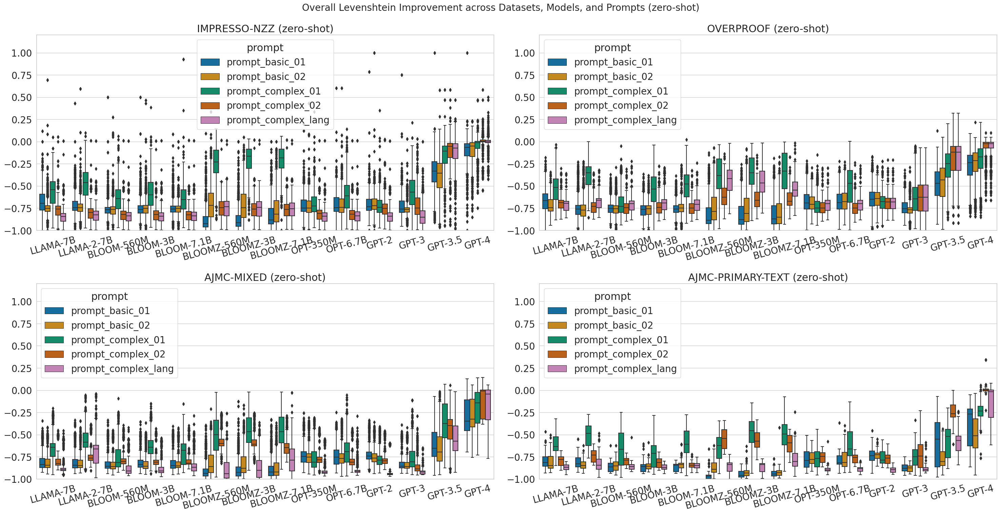

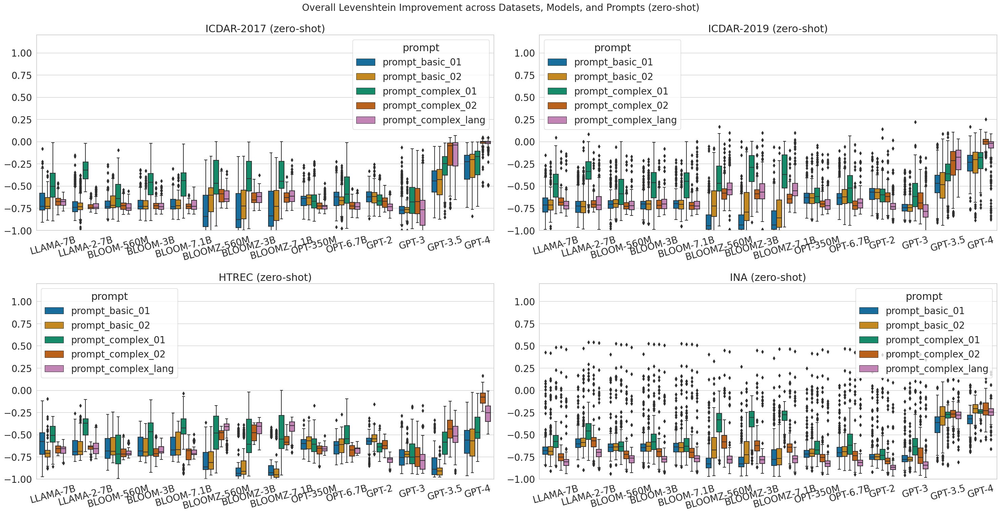

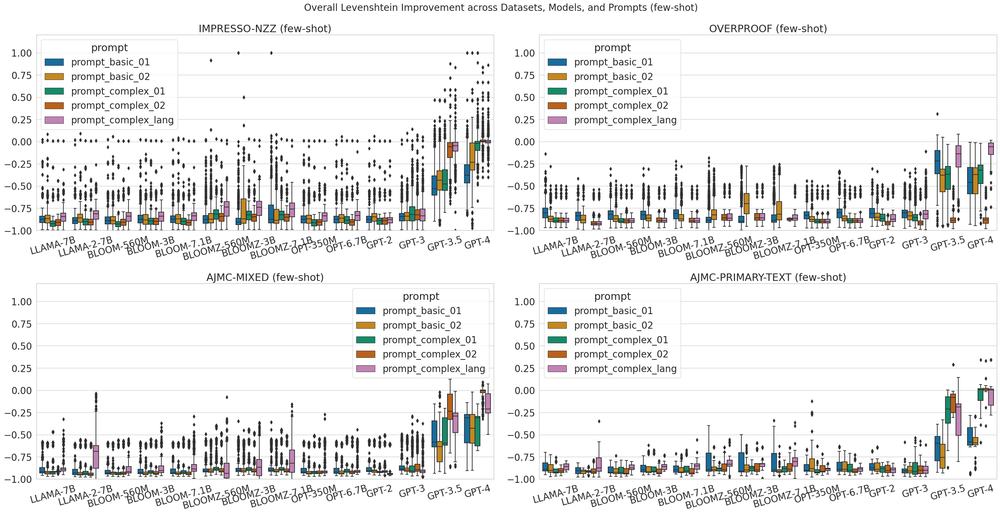

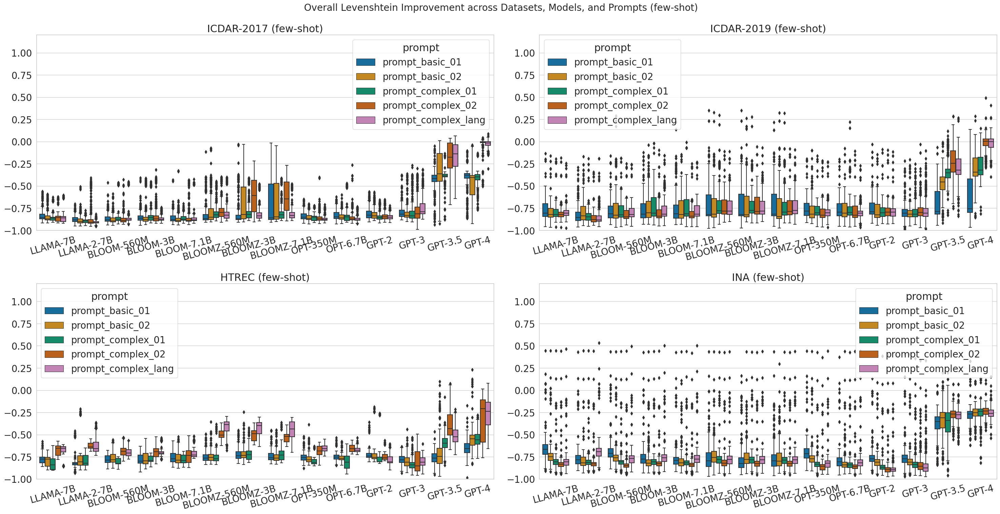

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

# data = sample_data

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    
                    
                    
                                # Plot the distribution of improvements for each model with color-coded points
#                     _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names, 
#                                     palette='Blues' if type_of_experiment == 'zero-shot' else 'Reds')
#                     _ = sns.swarmplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
#                                       ax=axs[i], order=MODELS, hue=f'sentence-lev-ocr', dodge=True, edgecolor='gray', linewidth=0.5)
#                     axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
        

                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                    
                    
                    
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


In [67]:
data.columns

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'length', 'sentence-lev-ocr', 'sentence-lev-pred',
       'sentence-lev-improvement', 'quality-band-sentence', 'region-lev-ocr',
       'region-lev-pred', 'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century', 'Access'],
      dtype='object')

In [70]:
dataset_data['sentence-lev-ocr']

0      1.000000
1      1.000000
2      1.000000
3      1.000000
4      1.000000
         ...   
831    1.000000
832    1.000000
833    1.000000
834    1.000000
835    0.969072
Name: sentence-lev-ocr, Length: 108699, dtype: float64

2


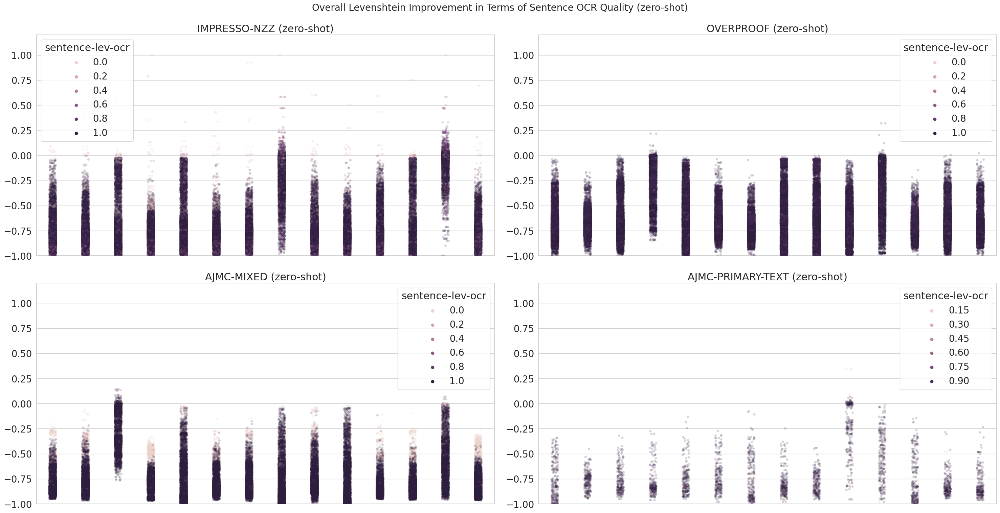

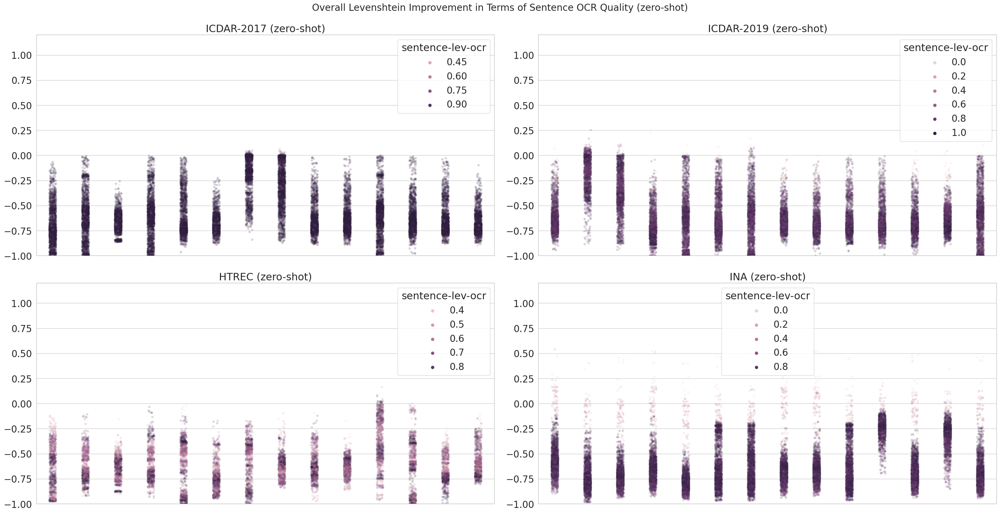

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")
sns.set_palette(sns.color_palette("colorblind", desat=0.6))

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
#                 if 'icdar' not in dataset:
#                     dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
#                                                                       f'sentence-{error_rate}-improvement', 
#                                                                       f'region-{error_rate}-improvement']].mean(axis=1)
#                 else:
#                     dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
#                                                                   f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
#                     _ = sns.boxplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
#                     axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    
#                     # Calculate the percentage of correct OCR for this dataset
#                     correct_ocr_percentage = (dataset_data['sentence-lev-ocr'] == 1.0).mean() * 100

#                     # Add text annotation to the subplot
#                     annotation_text = f"Correct OCR: {correct_ocr_percentage:.2f}%"
#                     axs[i].annotate(annotation_text, xy=(0.05, 0.95), xycoords='axes fraction', 
#                                     fontsize=12, color='Red', va='top', ha='center')
            
                    
#                    # Plot the distribution of improvements for each model with color-coded points
#                     _ = sns.boxplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names, 
#                                     palette='Blues' if type_of_experiment == 'zero-shot' else 'Reds')
#                     _ = sns.swarmplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                       ax=axs[i], order=MODELS, hue=f'sentence-lev-ocr', dodge=True, edgecolor='gray', linewidth=0.5)
                    _ = sns.stripplot(x='model', y=f'overall-levenshtein-improvement', hue=f'sentence-lev-ocr',
                                      data=dataset_data, jitter=True, alpha=0.2, ax=axs[i], size=5)

#                     print(f'{dataset.upper()} ({type_of_experiment})')
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
        
                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                    
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement in Terms of Sentence OCR Quality ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


2


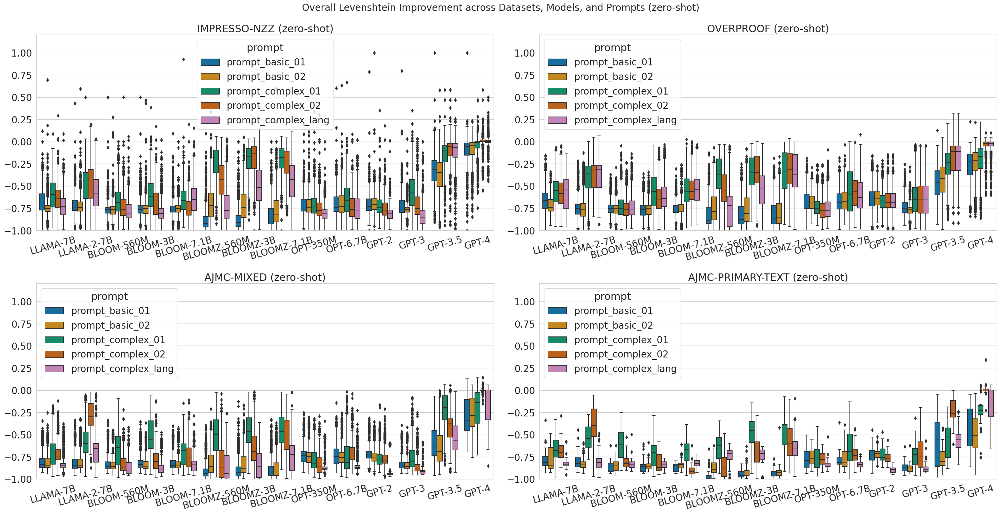

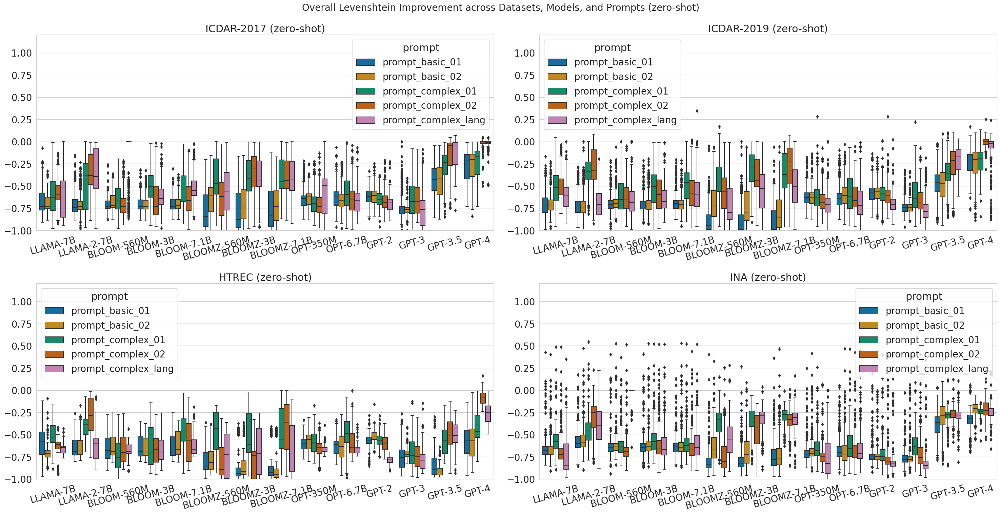

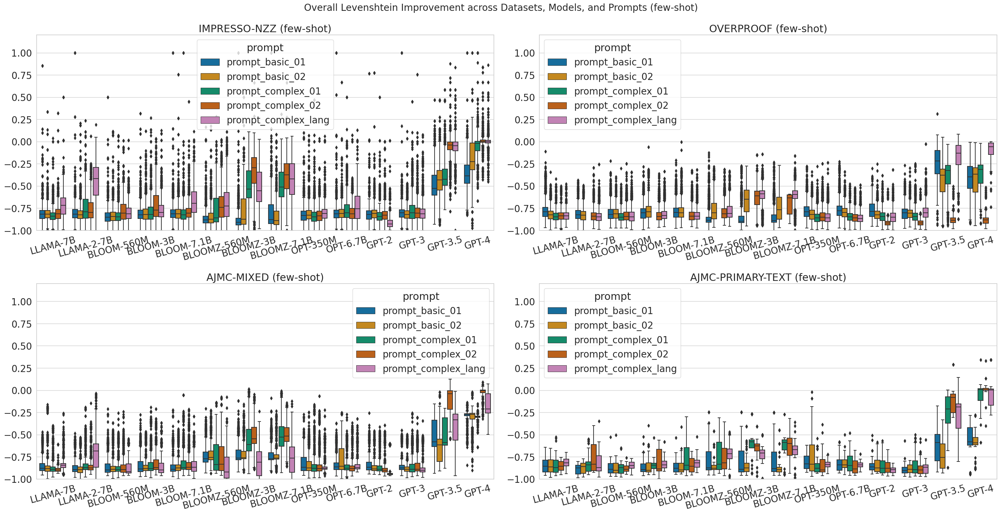

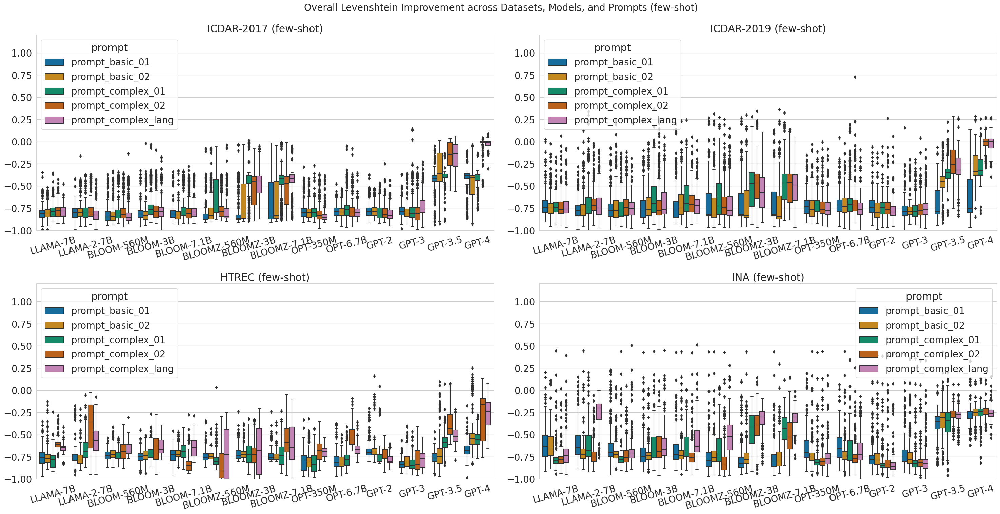

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


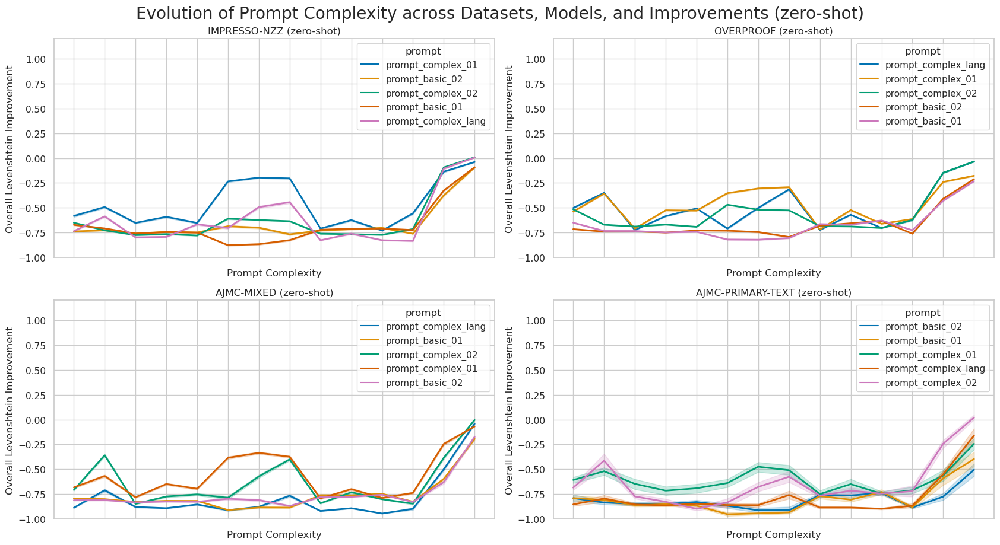

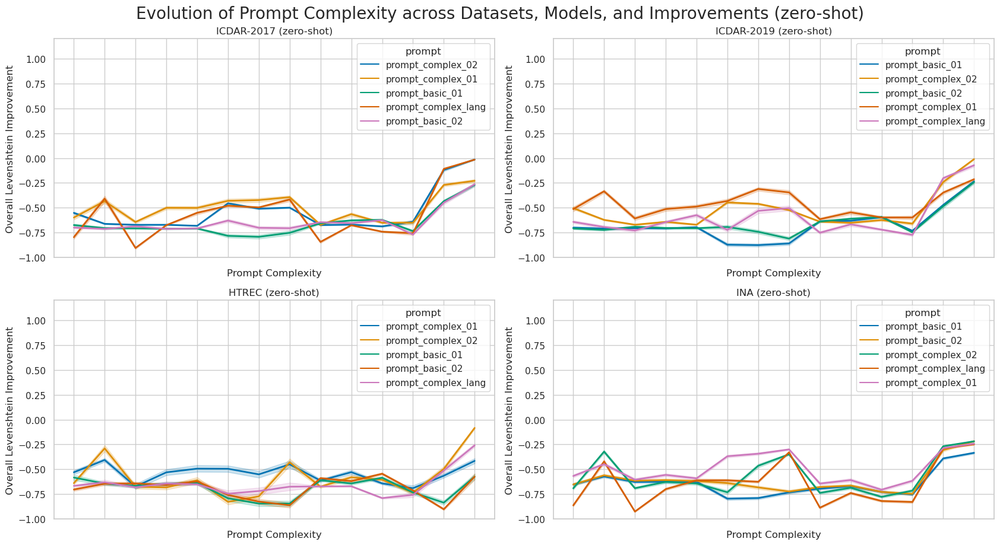

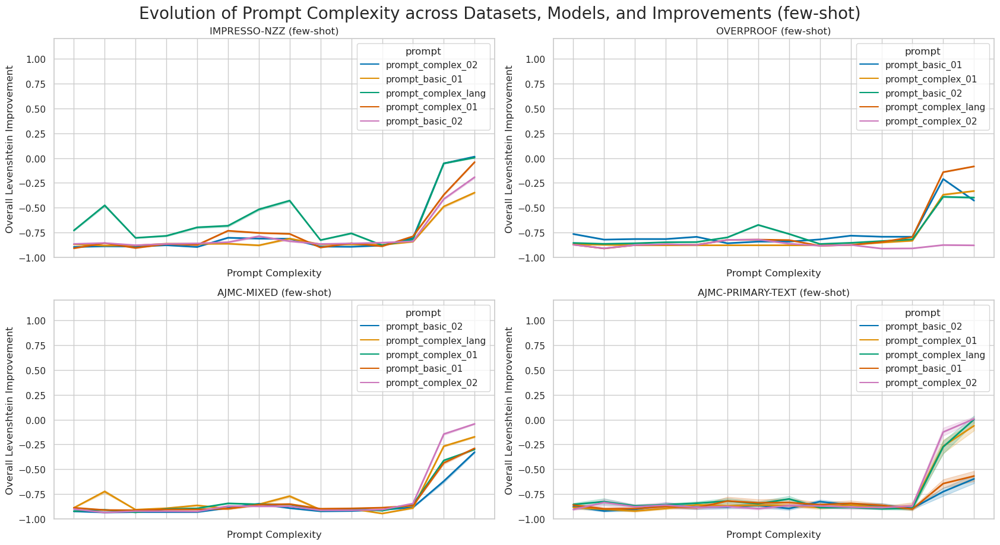

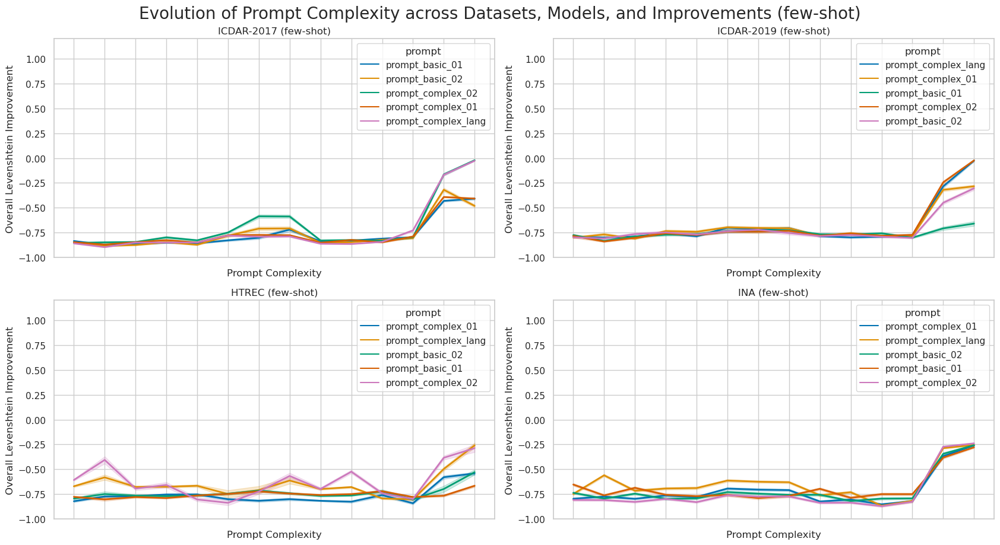

In [86]:
sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)
sns.set_style("whitegrid")

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


for type_of_experiment in ['zero-shot', 'few-shot']:#
    for error_rate in ['lev']:
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(17, 9))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                    
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                
                dataset_data['model'] = pd.Categorical(dataset_data['model'], categories=MODELS, ordered=True)
                
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the line plot of improvements for each model
                    _ = sns.lineplot(x='model', y=f'overall-levenshtein-improvement', 
                                     data=dataset_data.sort_values('model'), 
                                    ax=axs[i], hue='prompt', sort=False, linewidth=2)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)
                    axs[i].set_xlabel('Prompt Complexity')  
                    axs[i].set_ylabel('Overall Levenshtein Improvement')  
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Evolution of Prompt Complexity across Datasets, Models, and Improvements ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


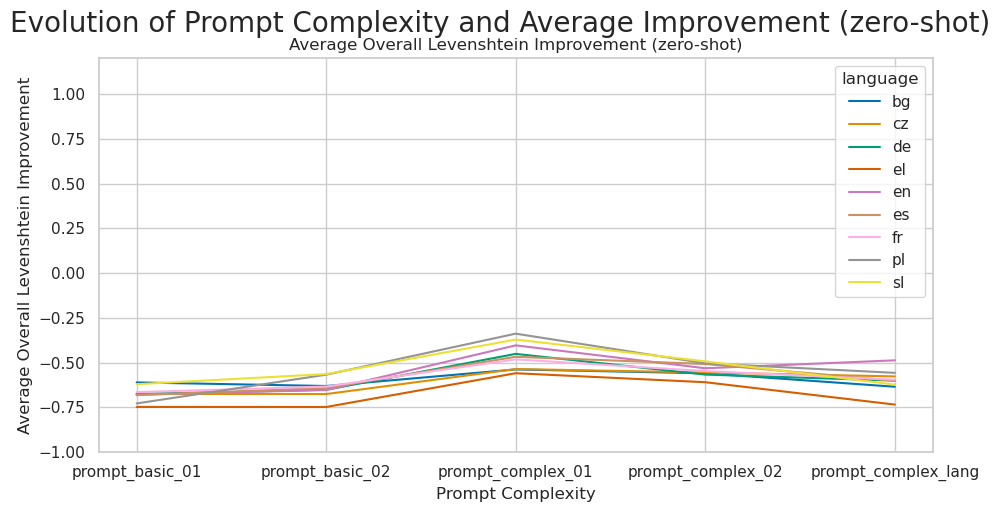

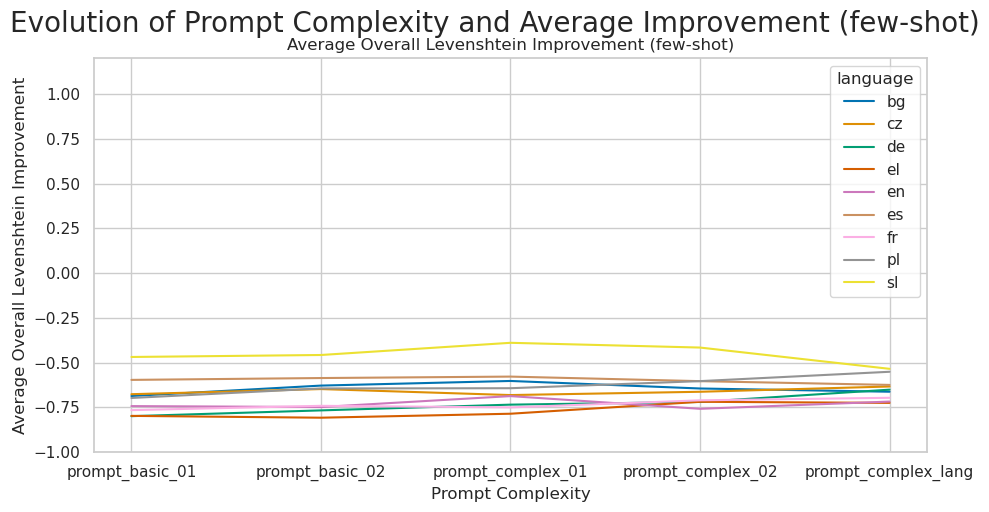

In [87]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(10, 5))  # Create the plot

        try:
            # Plot the line plot of average improvements for each prompt
            _ = sns.lineplot(x='prompt', y=f'overall-levenshtein-improvement', hue='language', data=average_improvements, 
                             ax=ax, legend='full')  # Add hue='language' to differentiate lines by language
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_ylim([-1, 1.2])
        ax.set_xlabel('Prompt Complexity')  
        ax.set_ylabel('Average Overall Levenshtein Improvement')

        plt.tight_layout()
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()



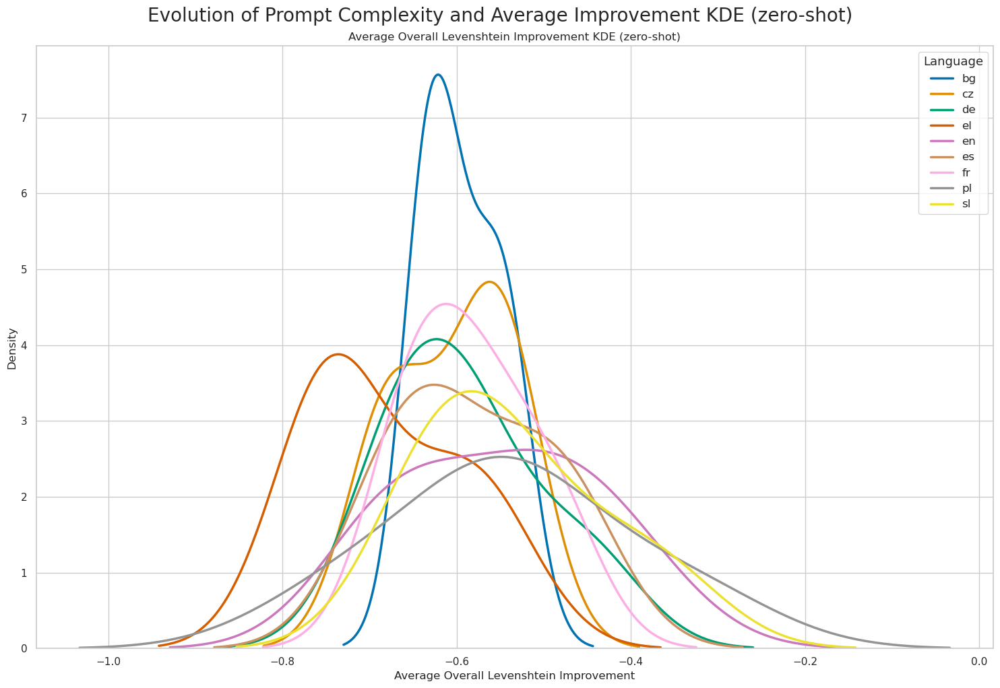

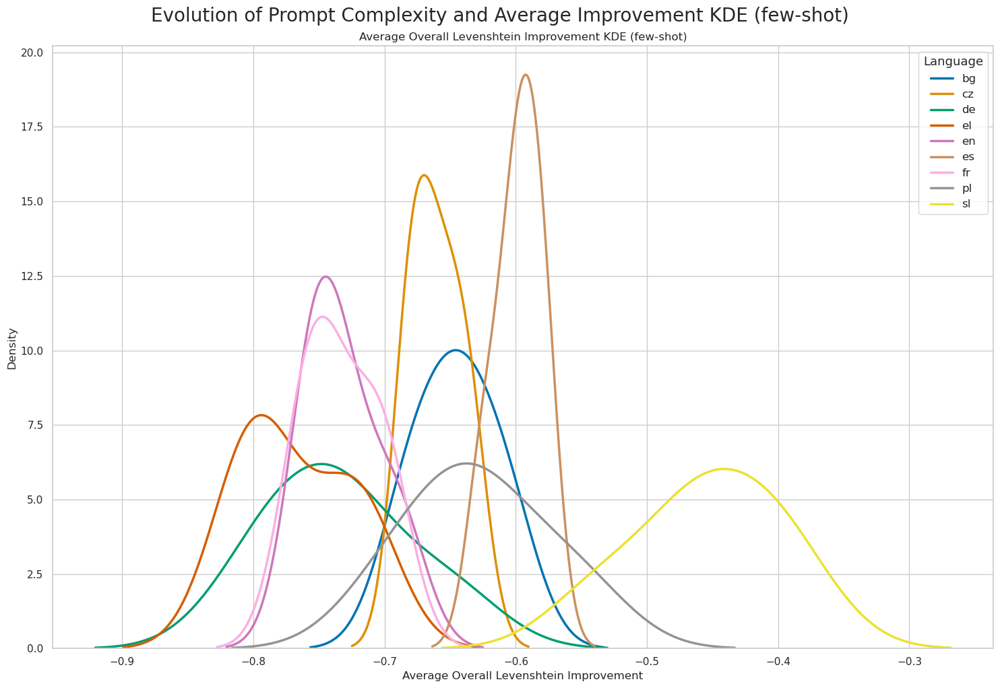

In [89]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for language in average_improvements.language.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.language == language]['overall-levenshtein-improvement'], 
                                ax=ax, label=language, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Language', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


In [ ]:
data.columns

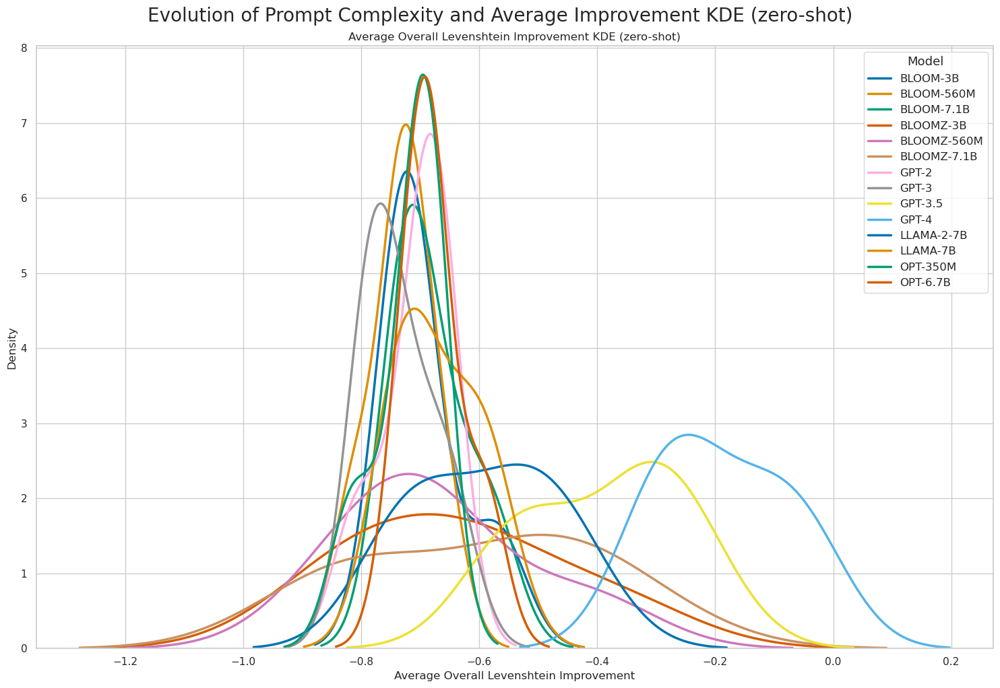

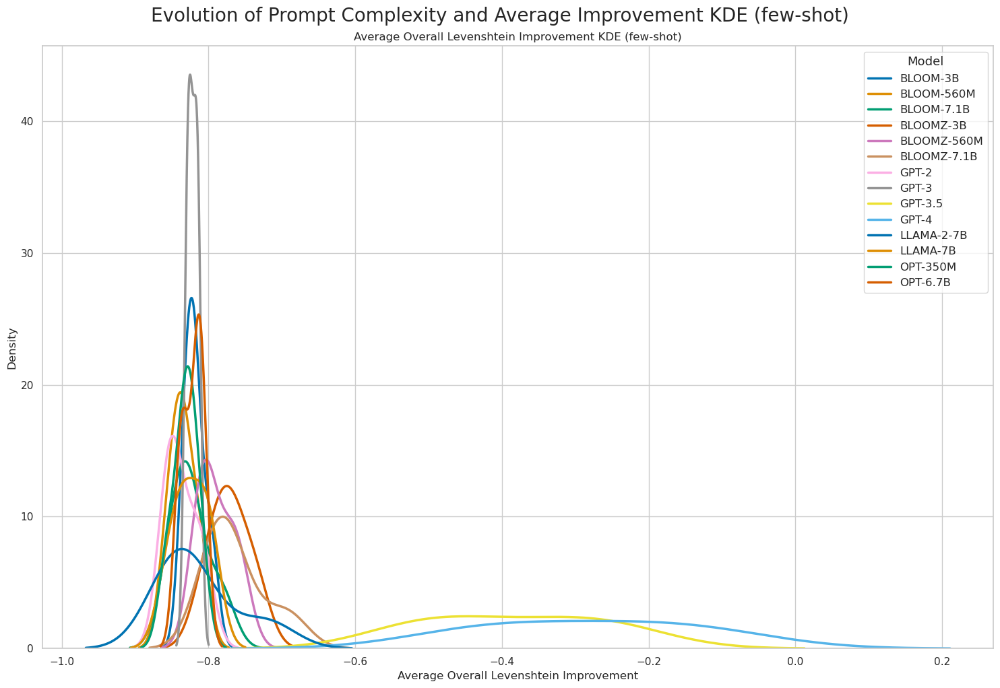

In [90]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each model and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'model', 'overall-levenshtein-improvement'])

        for model in data.model.unique():  # Iterate over each unique model
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.model == model) & (data.type == type_of_experiment)]  # Filter data for the current model
                if 'icdar' not in dataset:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and model, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and model again, this time averaging the averages for each model and prompt
        average_improvements = average_improvements.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for model in average_improvements.model.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.model == model]['overall-levenshtein-improvement'], 
                                ax=ax, label=model, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one model
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Model', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


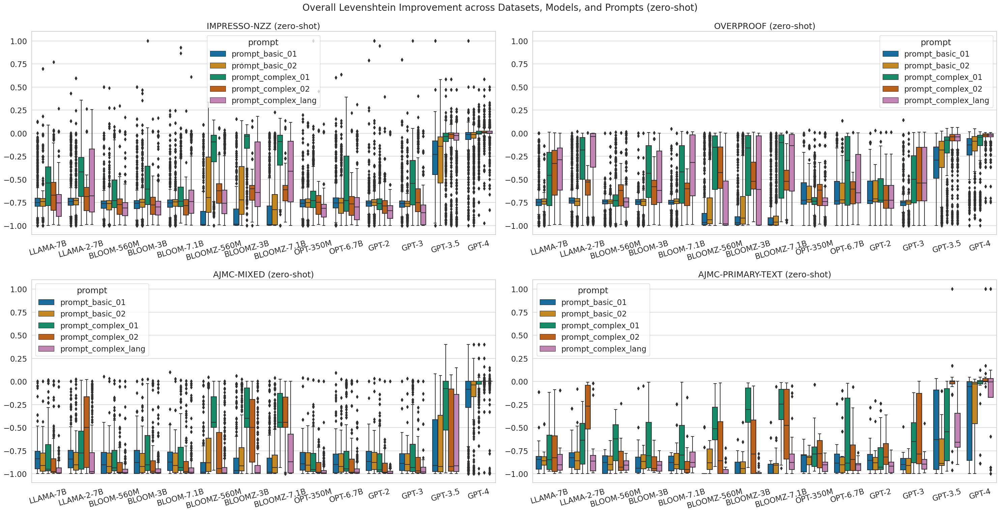

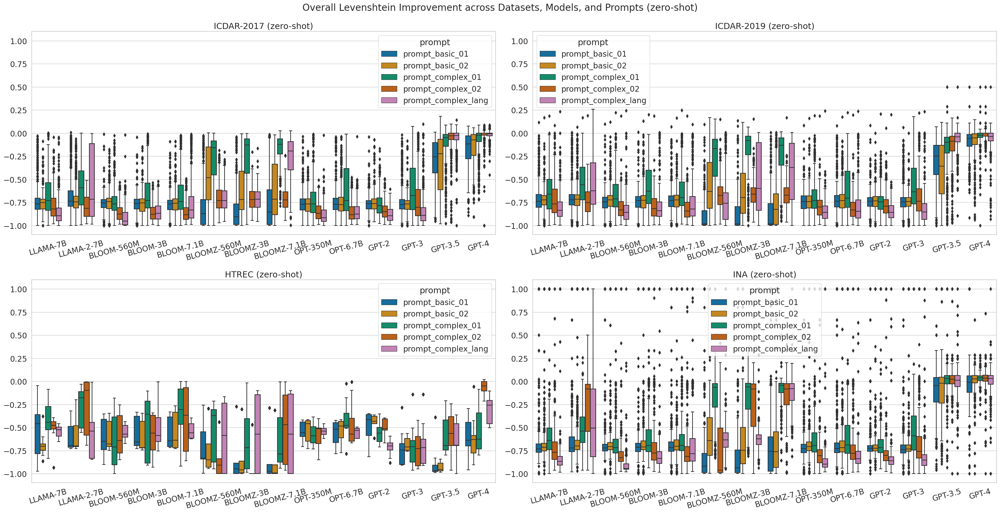

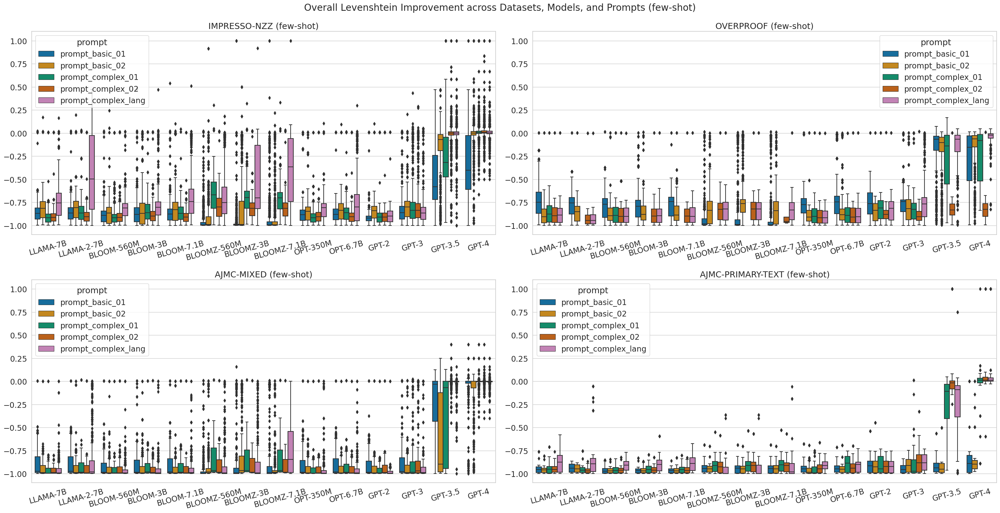

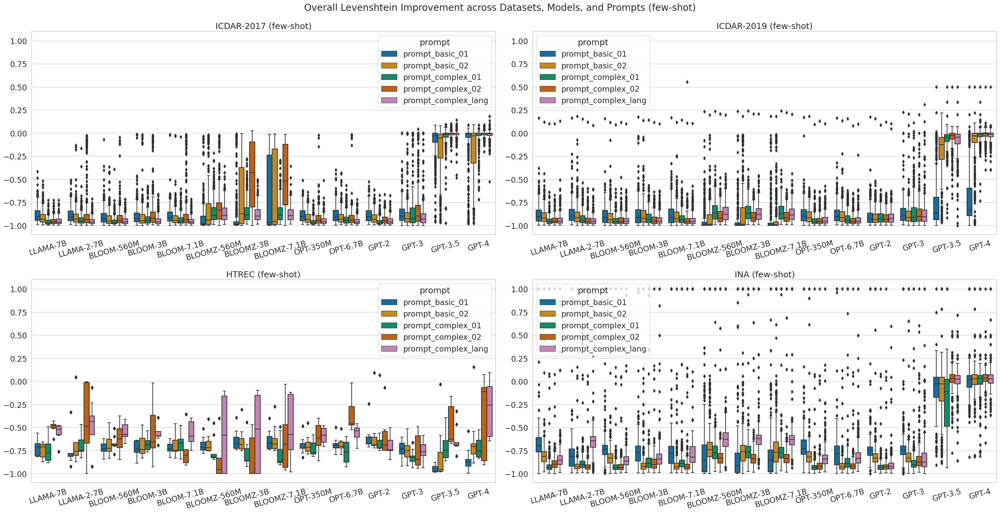

In [91]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.5)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y='overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1.1, 1.1])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')


            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


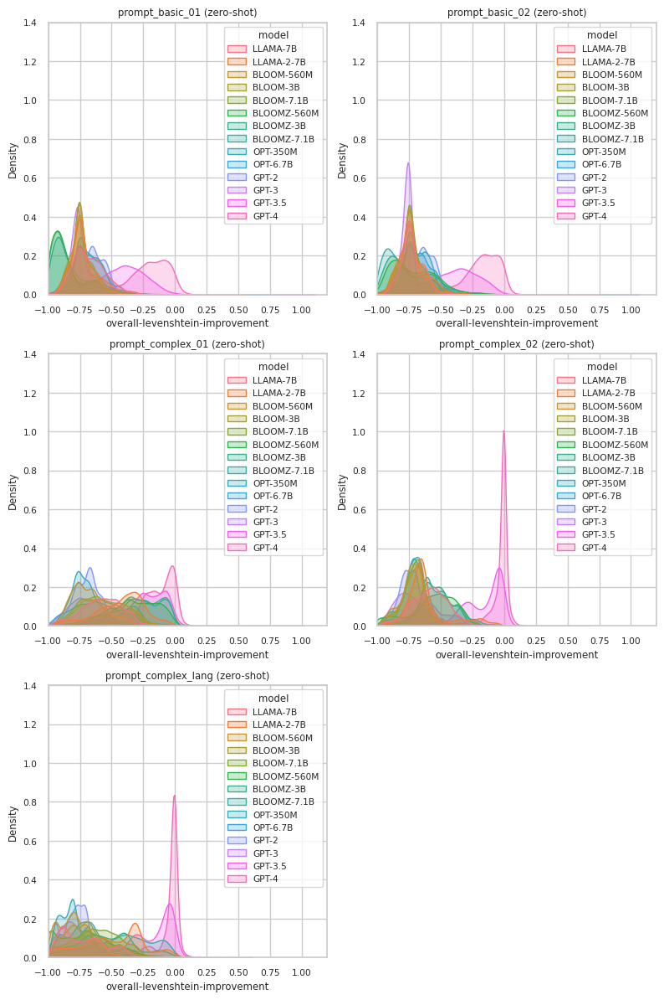

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
        axs = axs.flatten()  # To make it easy to index

        for i, prompt in enumerate(prompt_names):
            prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
            
            if 'icdar' not in dataset:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(prompt_data) > 0:
                    sns.kdeplot(data=prompt_data, x='overall-levenshtein-improvement', hue='model', 
                                fill=True, ax=axs[i], hue_order=MODELS)
                    axs[i].set_title(f'{prompt} ({type_of_experiment})')
                    axs[i].set_xlim([-1, 1.2])
                    axs[i].set_ylim([0, 1.4])
            except Exception as ex:
                print(f'Could not plot {prompt} with {ex}')

        # Remove empty subplot
        fig.delaxes(axs[-1])  # Change here

        plt.tight_layout()
        plt.show()
        
# A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, 
# analogous to a histogram. KDE represents the data using a continuous probability density curve in one or more 
# dimensions.

# Relative to a histogram, KDE can produce a plot that is less cluttered and more interpretable, especially when 
# drawing multiple distributions. But it has the potential to introduce distortions if the underlying distribution 
# is bounded or not smooth. Like a histogram, the quality of the representation also depends on the selection of 
# good smoothing parameters.


In [ ]:
data.columns

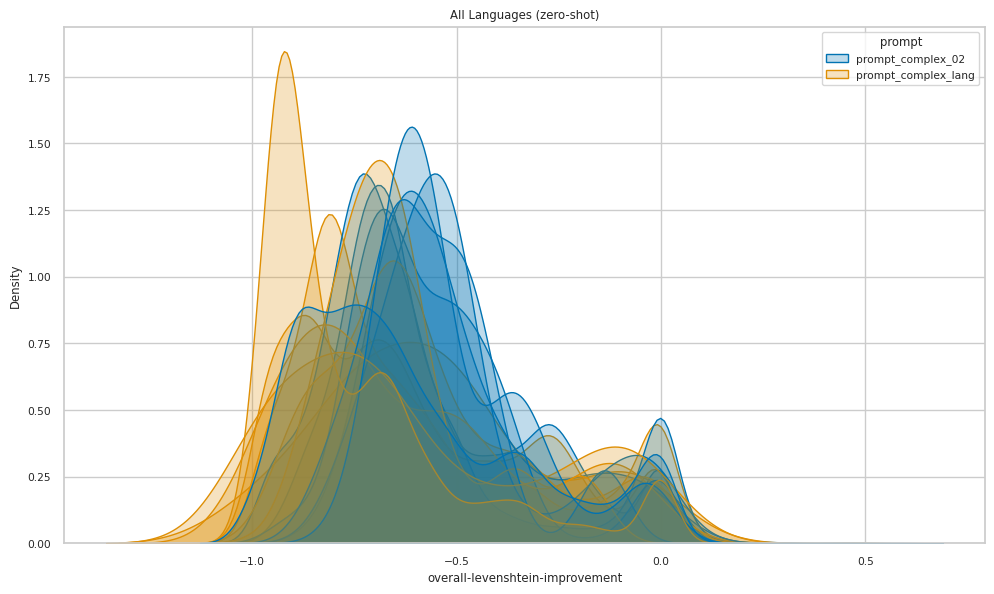

In [94]:
prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        plt.figure(figsize=(10, 6))  # Adjust as necessary

        for language in languages:
            language_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt.isin(prompts_to_compare))]

            if 'icdar' not in dataset:
                language_data['overall-levenshtein-improvement'] = language_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                language_data['overall-levenshtein-improvement'] = language_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(language_data) > 0:
                    sns.kdeplot(data=language_data, x='overall-levenshtein-improvement', hue='prompt', 
                                fill=True, hue_order=prompts_to_compare)
            except Exception as ex:
                print(f'Could not plot {language} with {ex}')

        plt.title(f'All Languages ({type_of_experiment})')
        plt.tight_layout()
        plt.show()


In [ ]:
data.columns

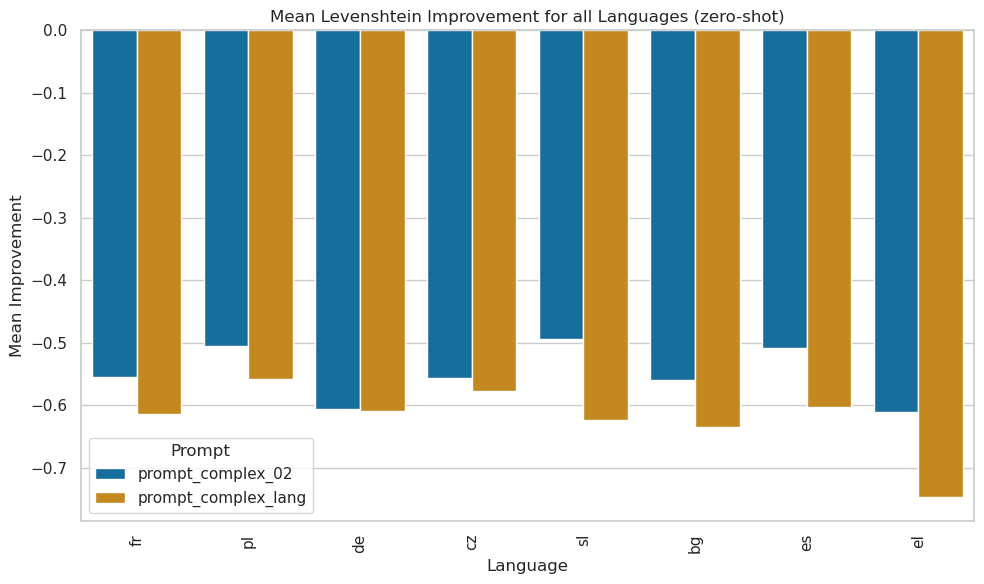

In [95]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)


prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

bar_data = []

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for language in languages:
            for prompt in prompts_to_compare:
                sub_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt == prompt)]
                if 'icdar' not in dataset:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                
                mean_improvement = np.mean(sub_data['overall-levenshtein-improvement'])
                bar_data.append({'Language': language, 'Prompt': prompt, 'Mean Improvement': mean_improvement})

bar_data = pd.DataFrame(bar_data)

plt.figure(figsize=(10, 6))
sns.barplot(x='Language', y='Mean Improvement', hue='Prompt', data=bar_data, hue_order=prompts_to_compare)
plt.title(f'Mean Levenshtein Improvement for all Languages ({type_of_experiment})')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


In [ ]:
data.columns

In [ ]:
data.dataset_name.unique()

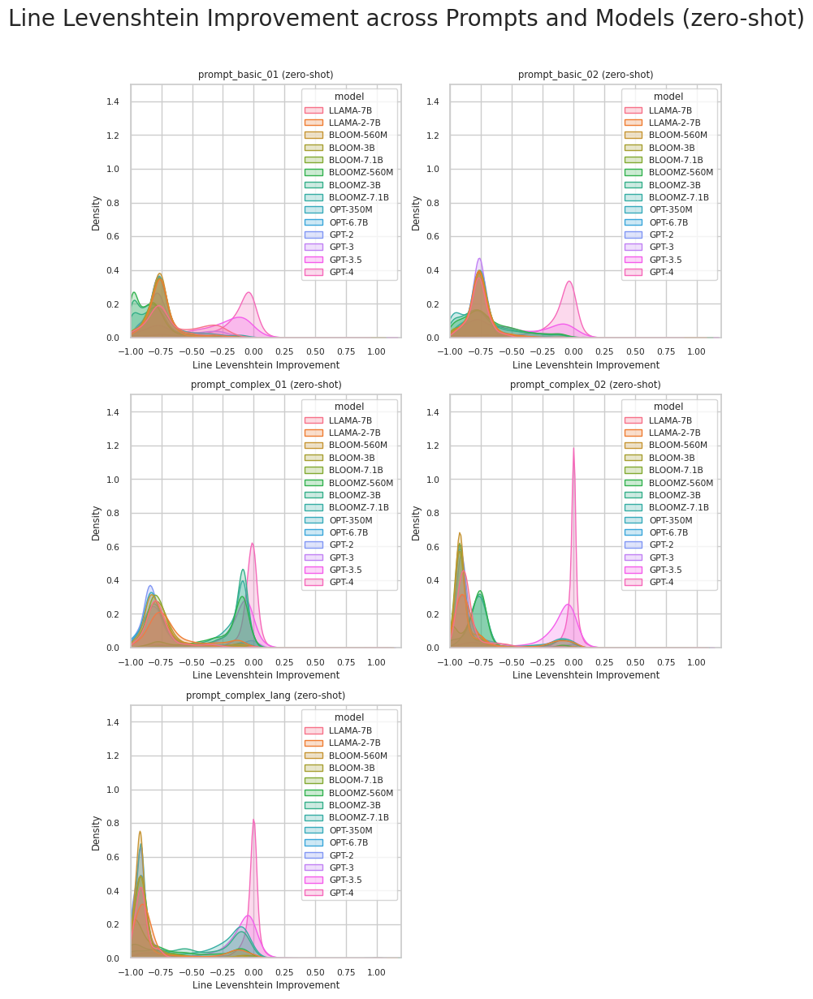

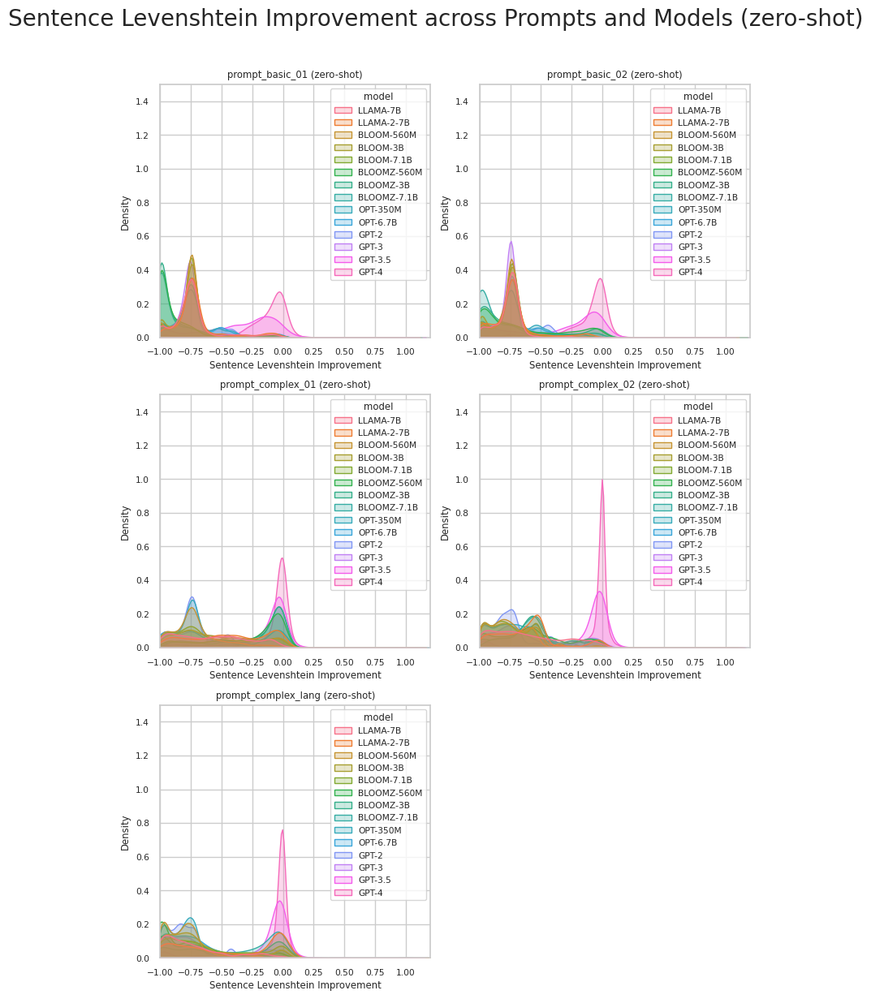

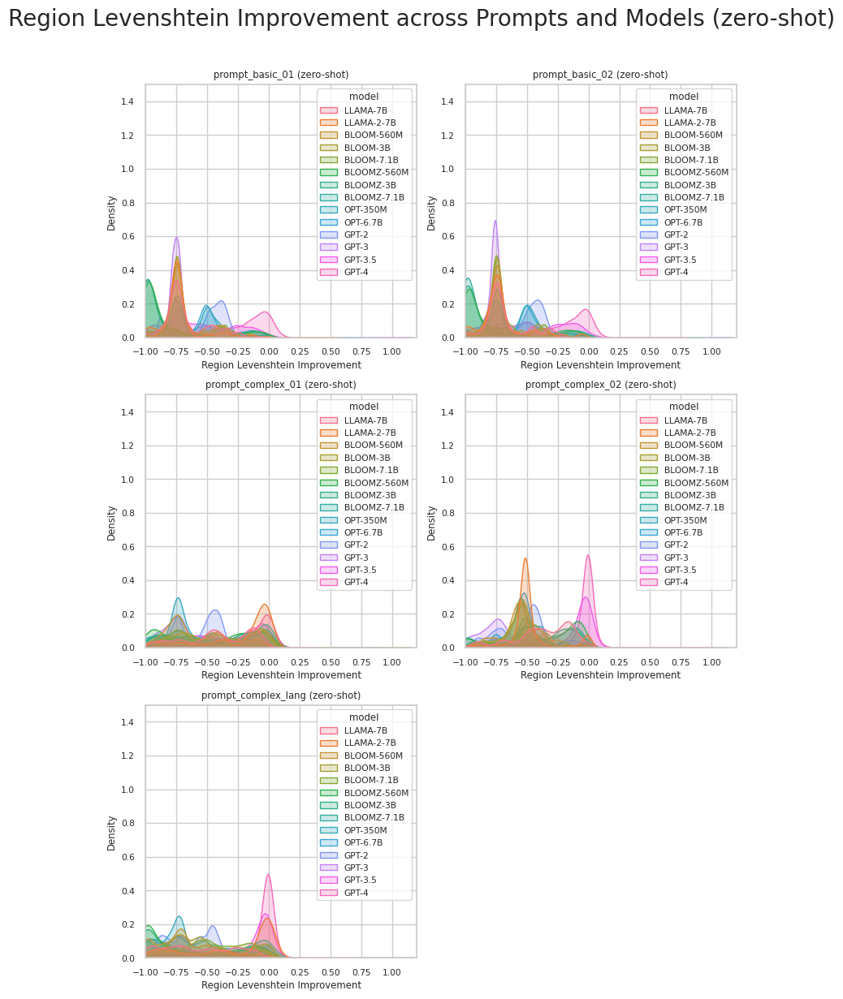

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)

segmentations = ['line', 'sentence', 'region']

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for segmentation in segmentations:
            fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
            axs = axs.flatten()  # To make it easy to index

            for i, prompt in enumerate(prompt_names):
                prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
                if segmentation == 'line':
                    prompt_data = prompt_data[~prompt_data.dataset_name.isin(['icdar-2017', 'icdar-2019'])]
                prompt_data[f'{segmentation.capitalize()} Levenshtein Improvement'] = prompt_data[f'{segmentation}-{error_rate}-improvement']

                try:
                    if len(prompt_data) > 0:
                        sns.kdeplot(data=prompt_data, x=f'{segmentation.capitalize()} Levenshtein Improvement', 
                                    hue='model', fill=True, ax=axs[i], hue_order=MODELS)
                        axs[i].set_title(f'{prompt} ({type_of_experiment})')
                        axs[i].set_xlim([-1, 1.2])
                        axs[i].set_ylim([0, 1.5])
                except Exception as ex:
                    print(f'Could not plot {prompt} with {ex}')

            # Remove empty subplot
            fig.delaxes(axs[-1])  # Change here

            plt.suptitle(f'{segmentation.capitalize()} Levenshtein Improvement across Prompts and Models ({type_of_experiment})', fontsize=20, y=1.02)
            plt.tight_layout()
            plt.show()


In [ ]:
data.columns

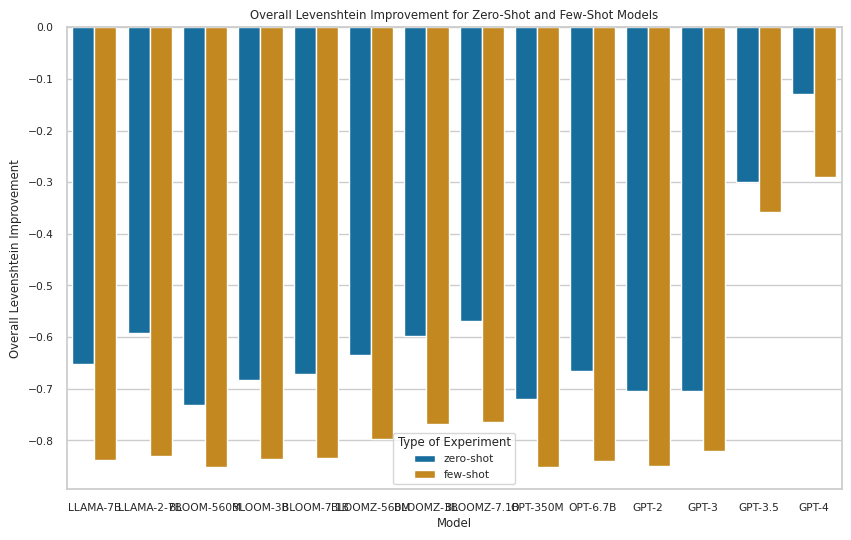

In [97]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

results_df = []  # Define results as a list


for type_of_experiment in ['zero-shot', 'few-shot']:
    for model in MODELS:
        model_data = data[(data.model == model) & (data.type == type_of_experiment)]
        
        # Compute the mean Levenshtein Improvement across line, sentence, and region levels
        if 'icdar' not in dataset:
            model_data['overall-levenshtein-improvement'] = model_data[[f'line-lev-improvement', 
                                                                        f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)
        else:
            model_data['overall-levenshtein-improvement'] = model_data[[f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)

        # Append the results
#         print(model_data['Improvement Band'].unique())
        results_df.append({'Model': model,
                        'Type of Experiment': type_of_experiment,
                        'Overall Levenshtein Improvement': np.nanmean(model_data['overall-levenshtein-improvement'])})

# Convert the results list to a DataFrame for plotting
results_df = pd.DataFrame(results_df)

# Create the plot
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='Overall Levenshtein Improvement', hue='Type of Experiment', data=results_df, order=MODELS)
plt.title('Overall Levenshtein Improvement for Zero-Shot and Few-Shot Models')
plt.show()
